In [1]:
library(caret)
library(corrplot)
library(biomaRt)
library(MLeval)
library(GeneAnswers) # used to get gene names from entrez IDs
library(ranger)
library(praznik)
library(openxlsx)
library('org.Hs.eg.db')
library(GeneAnswers)

Loading required package: lattice

Loading required package: ggplot2

corrplot 0.90 loaded

Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


Loading required package: RCurl

Loading required package: annotate

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:igraph’:

    normalize, path, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are mask

In [2]:
set.seed(64)

# Literature Survey

[Mechanism-driven biomarkers to guide immune checkpoint blockade in cancer therapy
Topalian et al, 2016](https://www.nature.com/articles/nrc.2016.36)<br>
[The evolving landscape of biomarkers for checkpoint inhibitor immunotherapy
Havel et al, 2019](https://www.nature.com/articles/s41568-019-0116-x)

In [3]:
path <- "/home/jp/ICP_Responders/Literature Review/GenesOfInterest.csv"
genes_lit_sur <- read.csv(path)
head(genes_lit_sur)

,Gene,ID
,<chr>,<dbl>
1,PDCD1/CD279,5133
2,CD274(PDL1),29126
3,PDCD1LG2(PDL2),80380
4,CTLA4,1493
5,CD8A,925
6,CD4,920


In [4]:
# for (i in 1:49){
#     cat(getSymbols(as.character(genes_lit_sur$ID), 'org.Hs.eg.db')[[i]])
#     cat(", ")
#     }

# Pre-Processing
1) Clean data by removing rows with > 50% missing info <br>
2) Find the most informative features <br>
3) Split the data into test and train


## Load Liu AntiPD1 data 
The first column is expected to be sample ID <br>

In [5]:
expr <- read.csv("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/41591_2019_654_MOESM3_ESM.txt", check.names=FALSE, sep="\t")  # 121 patients(manually verified)
colnames(expr)[1] <- "Patient"
expr <- expr[order(expr$Patient), ]
tail(expr)
dim(expr)

,Patient,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A3GALT2,A4GALT,A4GNT,⋯,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
102,Patient87,3.958186,0.4757435,0.05708922,205.5402,0.53283270,0.01902974,0.00000000,0.9324572,0.30447583,⋯,34.86248,25.499851,1.389171,2.264539,8.201818,0.51380296,16.63199,50.67620,30.37146,29.95281
108,Patient9,17.707440,0.8023684,0.00000000,102.6201,0.05533575,0.24901087,0.00000000,2.4347730,0.13833937,⋯,14.80231,18.454473,3.403149,4.426860,12.146197,0.00000000,20.64023,90.47395,38.01566,26.50582
104,Patient94,14.144119,0.7752792,0.01890925,329.5315,0.30254799,2.93093366,0.05672775,1.0967365,0.26472949,⋯,36.47594,60.944511,2.136745,3.744031,9.624808,0.07563700,22.44528,71.06096,28.32606,18.60670
105,Patient96,14.906180,1.3364161,0.00000000,290.5163,0.25700310,0.20560248,0.05140062,0.3084037,0.05140062,⋯,13.77537,1.028012,1.953224,2.672832,9.714717,0.00000000,14.44357,57.82570,20.09764,12.64455
106,Patient98,13.099469,1.2362082,0.08675145,873.1100,0.65063589,0.06506359,0.00000000,1.0843932,0.21687863,⋯,12.79584,8.545018,2.927862,3.665249,9.065527,0.17350291,19.49739,73.54354,38.58271,22.98913
107,Patient99,19.997280,0.8150550,0.00000000,727.8820,0.51177873,0.15163814,0.03790954,1.4595171,0.17059291,⋯,20.41428,15.069040,2.293527,2.615758,8.529645,0.01895477,22.17708,126.23875,38.87623,20.77443


[1]   121 20849

In [6]:
# mapping gene names to Entrez IDs
colnames(expr)[2:ncol(expr)] <- mapIds(org.Hs.eg.db, colnames(expr)[2:ncol(expr)], 'ENTREZID', 'ALIAS')

'select()' returned 1:many mapping between keys and columns



In [7]:
# Remove duplicate columns
res <- list()
uniqCname <- unique(colnames(expr))
for (i in 1:length(uniqCname)){
    Cname <- uniqCname[i]
    count <- length(which(colnames(expr) %in% Cname))
    pos <- which(colnames(expr) %in% Cname)
    if(count > 1){
        tmp <- expr[, pos]
        tmp.mean <- colMeans(tmp)
        tmp.mean.max <- max(tmp.mean)
        final_pos <- which(tmp.mean %in% tmp.mean.max)[1]
        tmp <- tmp[, final_pos]
    }else{
        tmp <- expr[,pos]
    }
    res[[i]] <- tmp
    names(res)[i] <- Cname 
}

expr_unique <- do.call(cbind, res)




# use the patient IDs as rownames
rname_expr <- expr_unique[,1]
rownames(expr_unique) <- expr_unique[,1]
expr_unique <- expr_unique[,2:ncol(expr_unique)]
expr_unique <- apply(expr_unique, 2, function(x) {as.numeric(x)})

# changing 0 to 0.001 to avoid log(0)
expr_unique[expr_unique == 0] <- 0.001

# convert values to log2(x)
expr_unique <- log(expr_unique, 2)
rownames(expr_unique) <- rname_expr

In [9]:
# load clinical data
clinical <- read.xlsx("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/41591_2019_654_MOESM4_ESM.xlsx", sheet=1, startRow = 3)
clinical <- clinical[1:144,]
colnames(clinical)[1] <- "Patient"
clinical <- clinical[,c("Patient", "gender.(Male=1,.Female=0)", "BR", "priorCTLA4")]
clinical <- clinical[clinical$priorCTLA4 == 0, ] # ONLY 84 out of 144 have no prior AntiCTLA4 therapy
clinical <- clinical[order(clinical$Patient), ]
colnames(clinical)[2:3] <- c("Gender", "Response")
clinical[clinical == "PD"] <- "N"
clinical[clinical == "SD"] <- "N"
clinical[clinical == "PR"] <- "Y"
clinical[clinical == "MR"] <- "Y"
clinical[clinical == "CR"] <- "Y"
clinical$Response <- as.factor(clinical$Response)
table(clinical$Response)
# dim(clinical)
head(clinical)


 N  Y 
48 36 

,Patient,Gender,Response,priorCTLA4
,<chr>,<dbl>,<fct>,<dbl>
4,Patient102,1,Y,0
5,Patient104,0,Y,0
6,Patient105,0,Y,0
7,Patient106,0,Y,0
8,Patient107,1,Y,0
9,Patient108,1,N,0


In [10]:
# select for samples with no prior CTLA4 treatment and are present in the clinical table
expr_unique_noCTLA4 <- expr_unique[which(rownames(expr_unique) %in% clinical$Patient), ]

In [11]:
# merge expression and response
expr_res <- merge(expr_unique_noCTLA4, clinical[, c("Patient", "Response")], by.x = "row.names",  by.y = 'Patient')
head(expr_res)
dim(expr_res)

,Row.names,1,503538,29974,2,144571,144568,127550,53947,51146,⋯,11130,7789,158586,79364,440590,79699,7791,23140,26009,Response
,<I<chr>>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,Patient102,4.327359,-0.8475669,-2.262604,9.663733,-1.7320897,-9.965784,-9.965784,1.2113268,-0.5745484,⋯,2.701897,1.4003606,1.834257,3.762227,-3.847567,4.796289,7.912183,5.170169,4.024851,Y
2,Patient105,3.701457,-9.9657843,-9.965784,6.761310,-0.6234737,-4.208436,-3.208436,-0.8161188,-2.8865081,⋯,2.946382,-0.6848742,1.020383,2.209416,-4.208436,4.649545,4.322945,3.519484,5.063027,Y
3,Patient106,4.198740,-0.1476570,-9.965784,6.551687,-3.3955845,-3.073656,-9.965784,-1.2256595,-3.0736564,⋯,3.462396,0.9263436,1.659698,3.092256,-5.395585,4.280373,5.412575,4.915028,4.160922,Y
4,Patient107,-9.965784,-9.9657843,-9.965784,9.078291,-9.9657843,-9.965784,-9.965784,-9.9657843,-9.9657843,⋯,-9.965784,-9.9657843,-9.965784,-9.965784,-9.965784,-9.965784,8.560465,4.292071,-9.965784,Y
5,Patient108,-0.722509,-9.9657843,-9.965784,9.443654,-9.9657843,-9.965784,-9.965784,-9.9657843,-9.9657843,⋯,-9.965784,-9.9657843,-1.137546,3.703756,-9.965784,2.921347,6.015583,5.499078,2.581272,N
6,Patient112,4.152404,0.2525682,-3.104984,8.719776,-1.1049838,3.024299,-9.965784,2.3044072,-9.9657843,⋯,2.966479,1.5243729,2.064941,3.819829,-9.965784,3.386869,6.673093,5.017844,3.922922,N


[1]    74 20492

In [12]:
# liu_train <- readRDS("/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/Liu_AntiPD1_train.rds")
# dim(liu_train)

## Clean Data

In [13]:
# Check which column has > 50% NA values
countNA <- function(x=NULL,cutOff=NULL){
  output<-FALSE
  perc<-sum(is.na(x))*100/length(x)
  if(perc>cutOff){output<-TRUE}
  output  
}
col_nas <- apply(expr_res,2,function(x){countNA(x, 50)})
cat("Columns with NAs > 50% = ", sum(col_nas), "\n")
# all columns have <50% NAs

# Check which rows has > 50% NA values
row_nas <- apply(expr_res,1,function(x){countNA(x, 0)})
cat("Rows with NAs > 0% = ", sum(row_nas), "\n")


cat("Dimensions of the filtered dataset = ", dim(expr_res))

Columns with NAs > 50% =  0 
Rows with NAs > 0% =  0 
Dimensions of the filtered dataset =  74 20492

## Look for near zero variance and remove those columns
Since all the expression values are log2 normalised, there is no near zero variance in genes

In [14]:
nzv <- nearZeroVar(expr_res[, -which(colnames(expr_res) %in% c("Patient, Response, Gender"))], saveMetrics= TRUE)
nzv[which(nzv$zeroVar %in% TRUE), ]

# All features were retained and there was no filtering due to near zero variance

freqRatio,percentUnique,zeroVar,nzv
<dbl>,<dbl>,<lgl>,<lgl>


## Look for correlation and remove highly correlated columns

In [15]:
exp_feat <- grep("[0-9]",colnames(expr_res))

In [16]:
# find attributes that are highly corrected (ideally >0.75)
tmp <- expr_res
tmp[is.na(tmp)] <- 0
expr_corr <-  cor(tmp[,c(exp_feat)]) 
highlyCorrelated <- findCorrelation(expr_corr, cutoff=0.75, names=TRUE, verbose=FALSE)
length(highlyCorrelated)
highlyCorrelated <- highlyCorrelated[highlyCorrelated %in% c(as.character(genes_lit_sur$ID)) == FALSE]   
length(highlyCorrelated)
expr_res_AntiPD1_rmcorr <- expr_res[, -which(colnames(expr_res) %in% highlyCorrelated)]

[1] 12130

[1] 12091

## Linear dependencies(not used)
NOTE: Linear Dependencies were not used because
1) A large number of features from columns 157 to 400 were flagged as linearly dependent to columns 1 to 156 <br>
2) We will rely on feature importance and the robustness of the model selected to identify the most important features hence linear dependencies can become redundant

In [17]:
# cat("Started with train dimension = ", dim(train), "\n")
# cat("Post 50% NA filtering in rows and columns the dimension is", dim(GideHugoRiazAmatoLiu_AntiPD1_filtered), "\n")
cat("The dimension of the Liu dataset is", dim(expr_res), "\n")
cat("Post filtering highly correlated columns the dimension is", dim(expr_res_AntiPD1_rmcorr), "\n")
# cat("Post removing linearly dependent columns the dimension is", dim(expr_rmLnCmb))

The dimension of the Liu dataset is 74 20492 
Post filtering highly correlated columns the dimension is 74 8401 


In [18]:
# 8027(in liu train with duplicates) to 8401(in full Liu dataset without duplicates)

## Subset into train and test

In [21]:
train_pos <- createDataPartition(expr_res_AntiPD1_rmcorr$Response, p = 0.8, list = F)
liu_train <- expr_res_AntiPD1_rmcorr[train_pos, ]
liu_test <- expr_res_AntiPD1_rmcorr[-train_pos, ]

nrow(liu_train)
nrow(liu_test)
nrow(expr_res_AntiPD1_rmcorr)

saveRDS(liu_train, 
        "/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/Liu_AntiPD1_train.rds")

saveRDS(liu_test, 
        "/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/Liu_AntiPD1_test.rds")

[1] 60

[1] 14

[1] 74

# Feature Selection


There are 2 kinds of feature selection: automated and manual
1) Automated<br>
Automatic feature selection methods can be used to build many models with different subsets of a dataset and identify those attributes that are and are not required to build an accurate model.The algorithm is configured to explore all possible subsets of the attributes.Then it selects the optimal number of attributes and the most important attributes. The relevant functions in CARET are: rfeControl and rfe.<br>


2) Manual<br>
For classification, ROC curve analysis is conducted on each predictor. For two class problems, a series of cutoffs is applied to the predictor data to predict the class. The sensitivity and specificity are computed for each cutoff and the ROC curve is computed. The trapezoidal rule is used to compute the area under the ROC curve. This area is used as the measure of variable importance.The relevant functions in CARET are varImp.<br>
<br>

Note: [Chen et al, 2020](https://journalofbigdata.springeropen.com/articles/10.1186/s40537-020-00327-4#Sec14) shows that manually selecting the topmost variables using the random forest varImp function is more accurate in identifying relevant features compared to automated methods.


[Darst et al, 2018](https://bmcgenomdata.biomedcentral.com/articles/10.1186/s12863-018-0633-8) suggested that although RF-RFE decreased the importance of correlated variables, in the presence of many correlated variables, it also decreased the importance of causal variables, making both hard to detect. These findings suggest that RF-RFE may not scale to high-dimensional data.

[Sanz et al, 2018](https://bmcbioinformatics.biomedcentral.com/articles/10.1186/s12859-018-2451-4#Sec3) -> SVM

In [23]:
exp_feat_rmcorr <- grep("[0-9]",colnames(liu_train))

mod_inp_mat <- cbind(liu_train$"Response", liu_train[, c(exp_feat_rmcorr)])
colnames(mod_inp_mat)[colnames(mod_inp_mat) == "liu_train$Response"] <- "Response"

# input for modeling
mod_inp_mat$Response <- as.character(mod_inp_mat$Response)
mod_inp_mat[mod_inp_mat$Response == '1',"Response"] <- 'Y' 
mod_inp_mat[mod_inp_mat$Response == '0', "Response"] <- 'N' 
mod_inp_mat$Response <- as.factor(mod_inp_mat$Response)
mod_inp_mat[is.na(mod_inp_mat)] <- 0
dim(mod_inp_mat)
#  define target and feature names
col_names = colnames(mod_inp_mat)
target = "Response"
feature_names = col_names[col_names!=target]

[1]   60 8399

In [24]:
saveRDS(mod_inp_mat, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/liu_mod_inp_mat_AntiPD1.rds")

In [25]:
target
length(feature_names)

[1] "Response"

[1] 8398

## Automated Feature Selection

In [26]:
feature_size <- c(50, 100, 200, 400, 600, 800, 1000, 1500, 2000, 2500, 3000, 4000, 6000, 8000)

### Random Forest

In [27]:
date()
rf.control <- rfeControl(functions=rfFuncs, method="repeatedcv", number=10, repeats=3)
system.time(a.rf <- rfe(Response~., data=mod_inp_mat, 
            sizes=feature_size, 
            rfeControl=rf.control))

date()

[1] "Wed Aug 18 06:04:19 2021"

   user  system elapsed 
523.991   0.177 524.290 

[1] "Wed Aug 18 06:13:03 2021"

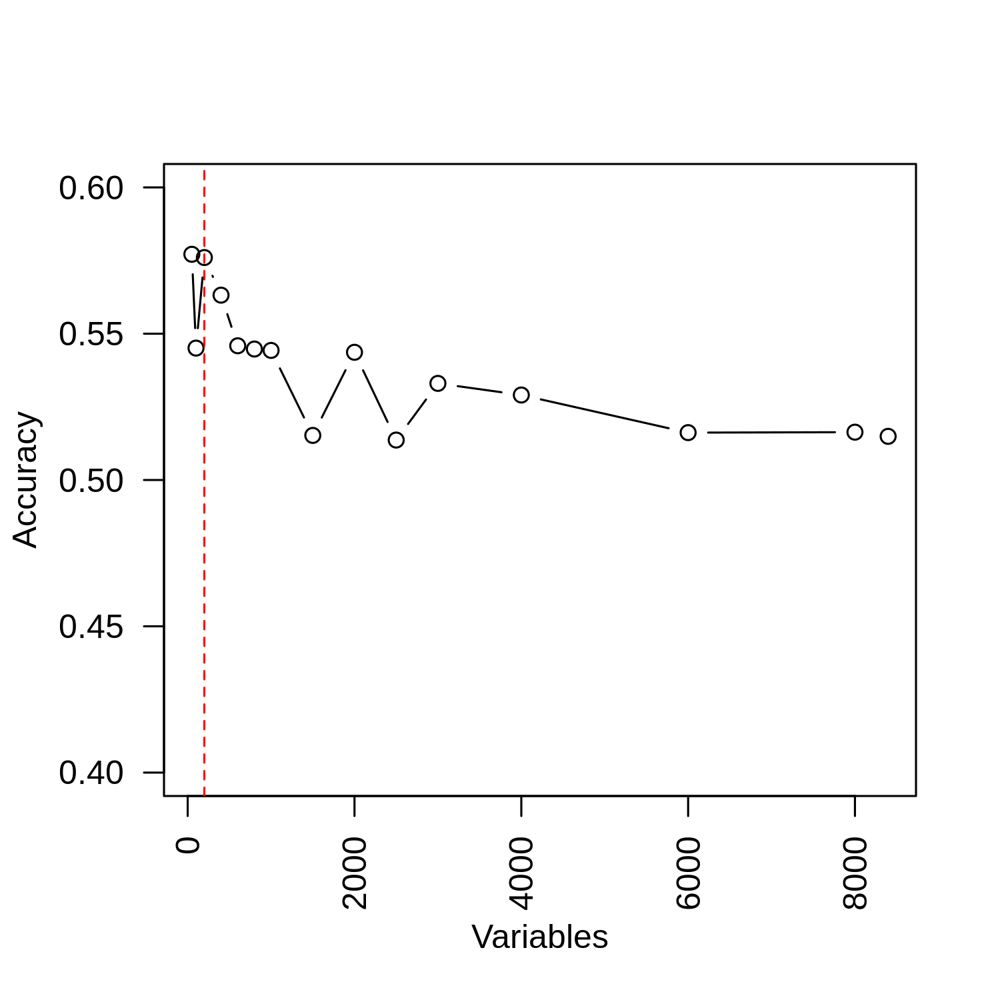

In [50]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 300)
# list the chosen featuresplot(a.rf, type=c("g", "o"))
rf.pred <- predictors(a.rf)
# plot the results
plot(a.rf$results$Variables, a.rf$results$Accuracy, ylab="Accuracy", xlab="Variables", 
     type="b", ylim =c(0.40, 0.60), las=2)
abline(v=200, lty="dashed", col="red")
a.rf.results <- a.rf$results

In [29]:
round(a.rf$results, 3)

Variables,Accuracy,Kappa,AccuracySD,KappaSD
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
50,0.577,0.145,0.132,0.265
100,0.545,0.065,0.150,0.291
200,0.576,0.124,0.160,0.326
400,0.563,0.084,0.152,0.318
600,0.546,0.042,0.187,0.394
800,0.545,0.054,0.200,0.410
1000,0.544,0.045,0.197,0.406
1500,0.515,-0.017,0.198,0.400
2000,0.544,0.049,0.172,0.350


## Manual Feature Selection

In [30]:
# define a resampling approach for caret where data is divided into 10 random subsets and prediction is done on 
# 1 using the remaining 9. This approach is repeated thrice
control <- trainControl(method="repeatedcv", number=10, repeats=3)

### glmNet
A generalized linear model (GLM) is a flexible generalization of ordinary linear regression that allows for the response variable to have an error distribution other than the normal distribution. 

In [31]:
head(mod_inp_mat)

,Response,29974,2,144571,144568,127550,51146,729522,13,344752,⋯,284312,221584,100129195,222696,201516,342933,646698,57643,23053,440590
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Y,-2.262604,9.663733,-1.7320897,-9.965784,-9.965784,-0.5745484,-2.432529,0.295391,-3.8475669,⋯,-4.432529,-2.6251745,-2.625174,1.7769240,-3.847566906,-9.965784,-1.525639,0.1821804,6.977922,-3.847567
2,Y,-9.965784,6.761310,-0.6234737,-4.208436,-3.208436,-2.8865081,-9.965784,-5.208436,-9.9657843,⋯,-9.965784,-1.5079965,-5.208436,1.9514352,0.001017186,-5.208436,-9.965784,-1.0385112,5.255088,-4.208436
3,Y,-9.965784,6.551687,-3.3955845,-3.073656,-9.965784,-3.0736564,-3.395585,-4.395585,-9.9657843,⋯,-9.965784,-1.4886939,-3.810622,1.3725998,-5.395584516,-9.965784,-3.073656,1.6488096,6.841028,-5.395585
4,Y,-9.965784,9.078291,-9.9657843,-9.965784,-9.965784,-9.9657843,-9.965784,-9.965784,-9.9657843,⋯,-9.965784,-9.9657843,-9.965784,-9.9657843,-9.965784285,-9.965784,-9.965784,1.1698831,4.171704,-9.965784
5,N,-9.965784,9.443654,-9.9657843,-9.965784,-9.965784,-9.9657843,-9.965784,-9.965784,-9.9657843,⋯,-9.965784,-9.9657843,-9.965784,-9.9657843,-9.965784285,-9.965784,-9.965784,-2.7225090,5.211182,-9.965784
6,N,-3.104984,8.719776,-1.1049838,3.024299,-9.965784,-9.9657843,-9.965784,-0.404544,0.6229367,⋯,-9.965784,-0.7126663,-1.404544,0.9824791,-9.965784285,-9.965784,-2.297629,-1.5200213,7.669392,-9.965784


In [32]:
date()
m.glm <- train(Response~., data=mod_inp_mat, 
                  method="glmnet", 
                  trControl=control,
                  preProcess = c("scale", "center")
                 )
date()

[1] "Wed Aug 18 06:13:04 2021"

[1] "Wed Aug 18 06:13:38 2021"

In [33]:
# estimate variable importance
glm.imp <- varImp(m.glm, scale=TRUE)$importance
rownames(glm.imp) <- gsub("`", "", rownames(glm.imp))
glm.imp$Name <- rownames(glm.imp)
# summarize importance
glm.imp <- glm.imp[order(glm.imp$Overall, decreasing=TRUE),]
colnames(glm.imp) <- c("Score", "Name")
head(glm.imp)

,Score,Name
,<dbl>,<chr>
64784,100.00000,64784
101060691,76.06784,101060691
729862,75.74581,729862
9752,70.03928,9752
100133139,58.78336,100133139
728430,53.81307,728430


### SVM
Support vector machines (SVMs) is a representation of different classes in a hyperplane in multidimensional space. The hyperplane is generated in an iterative manner by SVM for error minimization and divide the datasets into classes to find a maximum marginal hyperplane (MMH).<br>
This is effective in high dimensional spaces.

In [34]:
table(mod_inp_mat[,1])


 N  Y 
33 27 

In [35]:
date()
m.svm <- train(
#                   Response~., data=mod_inp_mat, 
                  y = mod_inp_mat[,1], x = mod_inp_mat[, -1],
                  method="svmRadial", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Wed Aug 18 06:13:38 2021"

[1] "Wed Aug 18 06:21:22 2021"

In [36]:
# estimate variable importance
svm.imp <- varImp(m.svm, scale=TRUE)$importance
svm.imp$Name <- rownames(svm.imp)
# summarize importance
svm.imp <- svm.imp[order(svm.imp$N, decreasing=TRUE),]
svm.imp$N <- NULL
colnames(svm.imp) <- c("Score", "Name")
head(svm.imp)

,Score,Name
,<dbl>,<chr>
64784,100.00000,64784
493812,98.22485,493812
149998,91.51874,149998
285175,90.92702,285175
5010,87.77120,5010
728590,86.98225,728590


### PCA Neural Network
The neural network is a weighted graph where nodes are the neurons, and edges with weights represent the connections. <br>
pcaNNet uses principle components to build a neural network

In [37]:
date()
m.nnet <- train(Response~., data=mod_inp_mat, 
                  method="pcaNNet", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Wed Aug 18 06:21:23 2021"

# weights:  57
initial  value 29.960474 
iter  10 value 25.965792
iter  20 value 25.699649
iter  30 value 25.697814
iter  40 value 25.691143
iter  50 value 25.333336
final  value 25.333333 
converged
# weights:  167
initial  value 27.773385 
iter  10 value 19.507831
iter  20 value 18.225404
iter  30 value 17.907279
iter  40 value 17.893150
iter  50 value 17.893090
iter  50 value 17.893090
iter  50 value 17.893090
final  value 17.893090 
converged
# weights:  277
initial  value 28.654950 
iter  10 value 16.306431
iter  20 value 12.750993
iter  30 value 12.385133
iter  40 value 10.942258
iter  50 value 10.404707
iter  60 value 10.366912
iter  70 value 10.365032
iter  80 value 10.364770
final  value 10.364769 
converged
# weights:  57
initial  value 29.009530 
iter  10 value 21.971485
iter  20 value 20.822736
iter  30 value 12.652808
iter  40 value 9.658357
iter  50 value 8.424938
iter  60 value 5.499435
iter  70 value 5.481689
iter  80 value 5.481378
iter  90 value 5.481301
iter  90 valu

initial  value 29.698054 
iter  10 value 21.670440
iter  20 value 17.418071
iter  30 value 11.670069
iter  40 value 8.348690
iter  50 value 7.467471
iter  60 value 7.189829
iter  70 value 7.187779
iter  80 value 7.184972
iter  90 value 7.182013
iter 100 value 7.178743
final  value 7.178743 
stopped after 100 iterations
# weights:  56
initial  value 27.343577 
iter  10 value 26.261492
iter  20 value 24.344788
final  value 24.342261 
converged
# weights:  164
initial  value 27.989624 
iter  10 value 20.197692
iter  20 value 15.359998
iter  30 value 14.020601
iter  40 value 14.014822
iter  50 value 14.014698
iter  60 value 14.014685
final  value 14.014685 
converged
# weights:  272
initial  value 29.347959 
iter  10 value 20.851141
iter  20 value 16.702010
iter  30 value 13.063914
iter  40 value 11.881628
iter  50 value 10.636835
iter  60 value 10.629977
iter  70 value 9.686094
iter  80 value 8.560146
iter  90 value 8.500503
iter 100 value 8.500005
final  value 8.500005 
stopped after 100

initial  value 27.074260 
iter  10 value 23.960591
iter  20 value 23.933773
final  value 23.197809 
converged
# weights:  167
initial  value 31.189200 
iter  10 value 19.892935
iter  20 value 17.233864
iter  30 value 17.102693
iter  40 value 17.102417
iter  50 value 16.205719
iter  60 value 16.188380
iter  70 value 15.720118
iter  80 value 15.567687
iter  90 value 14.854656
iter 100 value 14.662332
final  value 14.662332 
stopped after 100 iterations
# weights:  277
initial  value 28.968318 
iter  10 value 16.648987
iter  20 value 10.950099
iter  30 value 8.985974
iter  40 value 8.646709
iter  50 value 6.778346
iter  60 value 5.188067
iter  70 value 5.025295
iter  80 value 5.019494
iter  90 value 5.011893
iter 100 value 5.000138
final  value 5.000138 
stopped after 100 iterations
# weights:  57
initial  value 28.851715 
iter  10 value 24.070786
iter  20 value 18.514556
iter  30 value 11.984670
iter  40 value 8.311835
iter  50 value 5.783422
iter  60 value 5.398932
iter  70 value 5.3961

initial  value 28.282610 
iter  10 value 23.228596
iter  20 value 21.788254
iter  30 value 21.662343
final  value 21.662338 
converged
# weights:  167
initial  value 33.845996 
iter  10 value 19.781970
iter  20 value 17.789515
iter  30 value 16.687215
iter  40 value 16.683518
iter  50 value 14.921805
iter  60 value 14.752277
iter  70 value 14.752253
final  value 14.752252 
converged
# weights:  277
initial  value 29.745642 
iter  10 value 18.480859
iter  20 value 14.087840
iter  30 value 13.596265
iter  40 value 13.063832
iter  50 value 12.660791
iter  60 value 12.656964
iter  70 value 12.621733
iter  80 value 12.620748
iter  90 value 12.615990
iter 100 value 12.605038
final  value 12.605038 
stopped after 100 iterations
# weights:  57
initial  value 28.393534 
iter  10 value 25.009212
iter  20 value 19.702340
iter  30 value 14.688020
iter  40 value 8.590999
iter  50 value 8.313049
iter  60 value 8.301104
iter  70 value 8.289710
iter  80 value 8.289438
final  value 8.289373 
converged


initial  value 27.370023 
iter  10 value 24.945795
iter  20 value 19.782714
iter  30 value 19.748011
final  value 19.748011 
converged
# weights:  170
initial  value 31.729054 
iter  10 value 21.525241
iter  20 value 14.319198
iter  30 value 13.696722
iter  40 value 12.811989
iter  50 value 12.476273
iter  60 value 12.476234
iter  70 value 12.476228
iter  70 value 12.476228
iter  70 value 12.476228
final  value 12.476228 
converged
# weights:  282
initial  value 32.046380 
iter  10 value 15.915958
iter  20 value 10.772673
iter  30 value 7.682722
iter  40 value 5.748973
iter  50 value 5.352067
iter  60 value 4.504143
iter  70 value 3.993329
iter  80 value 3.965919
iter  90 value 3.334429
iter 100 value 3.333858
final  value 3.333858 
stopped after 100 iterations
# weights:  58
initial  value 30.920324 
iter  10 value 19.130963
iter  20 value 14.871459
iter  30 value 10.867433
iter  40 value 8.269245
iter  50 value 6.840975
iter  60 value 6.263480
iter  70 value 5.656282
iter  80 value 5

initial  value 29.029037 
iter  10 value 25.979072
iter  20 value 25.613358
final  value 25.613339 
converged
# weights:  170
initial  value 31.074840 
iter  10 value 23.056030
iter  20 value 19.567785
iter  30 value 18.985673
iter  40 value 17.944674
iter  50 value 17.943489
iter  60 value 17.940098
iter  70 value 14.893423
iter  80 value 13.048734
iter  90 value 13.024061
final  value 13.024052 
converged
# weights:  282
initial  value 31.461929 
iter  10 value 21.625903
iter  20 value 15.972265
iter  30 value 13.591109
iter  40 value 8.701747
iter  50 value 8.316761
iter  60 value 7.511910
iter  70 value 7.381099
iter  80 value 7.082452
iter  90 value 6.689537
iter 100 value 6.494456
final  value 6.494456 
stopped after 100 iterations
# weights:  58
initial  value 30.045552 
iter  10 value 24.558675
iter  20 value 20.820656
iter  30 value 15.071781
iter  40 value 11.113344
iter  50 value 9.557153
iter  60 value 8.297022
iter  70 value 8.253226
iter  80 value 8.251544
iter  90 value 

initial  value 27.594827 
iter  10 value 25.626250
iter  20 value 24.801685
iter  30 value 23.663612
iter  40 value 23.034792
final  value 23.034783 
converged
# weights:  164
initial  value 28.130096 
iter  10 value 24.536849
iter  20 value 22.068928
iter  30 value 19.640883
iter  40 value 17.217660
iter  50 value 16.827509
iter  60 value 15.332572
iter  70 value 15.043566
iter  80 value 14.955712
final  value 14.955633 
converged
# weights:  272
initial  value 27.414168 
iter  10 value 20.280568
iter  20 value 19.739438
iter  30 value 18.744527
iter  40 value 17.655470
iter  50 value 17.484229
iter  60 value 17.483815
iter  70 value 15.848325
iter  80 value 15.847278
iter  90 value 15.083546
iter 100 value 15.078346
final  value 15.078346 
stopped after 100 iterations
# weights:  56
initial  value 27.415560 
iter  10 value 22.870112
iter  20 value 15.124526
iter  30 value 11.879672
iter  40 value 9.279286
iter  50 value 8.543528
iter  60 value 7.116280
iter  70 value 5.844657
iter  8

initial  value 29.485940 
iter  10 value 23.290797
final  value 22.307937 
converged
# weights:  164
initial  value 38.547451 
iter  10 value 21.843196
iter  20 value 20.797280
iter  30 value 18.811408
iter  40 value 17.699346
iter  50 value 17.318177
iter  60 value 16.212894
iter  70 value 16.051274
iter  80 value 16.050698
iter  90 value 15.628593
iter 100 value 15.582108
final  value 15.582108 
stopped after 100 iterations
# weights:  272
initial  value 31.102899 
iter  10 value 14.082996
iter  20 value 12.950521
iter  30 value 12.183484
iter  40 value 11.840922
iter  50 value 11.667129
iter  60 value 11.666688
iter  70 value 11.666668
iter  80 value 10.768718
iter  90 value 10.766672
final  value 10.766667 
converged
# weights:  56
initial  value 31.791208 
iter  10 value 24.539837
iter  20 value 20.588289
iter  30 value 13.672785
iter  40 value 12.038476
iter  50 value 10.049370
iter  60 value 8.302746
iter  70 value 8.234767
iter  80 value 8.227581
iter  90 value 8.226866
final  

initial  value 26.677559 
iter  10 value 26.186080
iter  20 value 20.135441
iter  30 value 19.494530
iter  40 value 17.731224
iter  50 value 14.943177
iter  60 value 14.942050
iter  70 value 14.942043
iter  80 value 14.942031
iter  80 value 14.942031
iter  80 value 14.942031
final  value 14.942031 
converged
# weights:  164
initial  value 31.787103 
iter  10 value 22.428613
iter  20 value 19.794793
iter  30 value 18.767942
iter  40 value 17.758251
iter  50 value 16.335198
iter  60 value 16.326192
iter  70 value 15.175440
iter  80 value 13.931729
iter  90 value 13.895474
iter 100 value 13.895461
final  value 13.895461 
stopped after 100 iterations
# weights:  272
initial  value 32.322438 
iter  10 value 18.455926
iter  20 value 11.727421
iter  30 value 10.768451
iter  40 value 10.388150
iter  50 value 9.505105
iter  60 value 9.500072
iter  70 value 9.500007
final  value 9.500000 
converged
# weights:  56
initial  value 28.033578 
iter  10 value 21.778617
iter  20 value 18.997731
iter  3

initial  value 28.998851 
iter  10 value 26.619466
iter  20 value 25.858363
iter  30 value 25.424800
iter  40 value 24.504930
final  value 24.504910 
converged
# weights:  167
initial  value 31.195779 
iter  10 value 21.789819
iter  20 value 15.510726
iter  30 value 14.164698
iter  40 value 14.117462
iter  50 value 14.034547
final  value 14.034520 
converged
# weights:  277
initial  value 30.484906 
iter  10 value 18.374885
iter  20 value 11.682843
iter  30 value 7.592737
iter  40 value 6.307048
iter  50 value 6.057755
iter  60 value 5.842488
iter  70 value 4.895442
iter  80 value 4.841965
iter  90 value 4.837918
iter 100 value 4.836311
final  value 4.836311 
stopped after 100 iterations
# weights:  57
initial  value 31.792446 
iter  10 value 23.148654
iter  20 value 15.987668
iter  30 value 14.507389
iter  40 value 8.432019
iter  50 value 8.260181
iter  60 value 6.806950
iter  70 value 6.734396
iter  80 value 6.731545
iter  90 value 6.731415
final  value 6.731406 
converged
# weights:

[1] "Wed Aug 18 06:45:35 2021"

In [38]:
# estimate variable importance
nnet.imp <- varImp(m.nnet, scale=TRUE)$importance
rownames(nnet.imp) <- gsub("`", "", rownames(nnet.imp))
nnet.imp$Name <- rownames(nnet.imp)
# summarize importance
nnet.imp <- nnet.imp[order(nnet.imp$N, decreasing=TRUE),]
nnet.imp$N <- NULL
colnames(nnet.imp) <- c("Score", "Name")
head(nnet.imp)

,Score,Name
,<dbl>,<chr>
64784,100.00000,64784
493812,98.22485,493812
149998,91.51874,149998
285175,90.92702,285175
5010,87.77120,5010
728590,86.98225,728590


### Gradient Boosting Machines (GBM)
Gradient boosting is a machine learning technique for regression, classification and other tasks, which produces a prediction model in the form of an ensemble of weak prediction models, typically decision trees

In [39]:
date()
library(gbm)
m.gbm <- train(Response~., data=mod_inp_mat, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Wed Aug 18 06:45:36 2021"

Loaded gbm 2.1.8



Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.2971            -nan     0.1000    0.0034
     2        1.2586            -nan     0.1000   -0.0163
     3        1.2049            -nan     0.1000   -0.0007
     4        1.1502            -nan     0.1000    0.0092
     5        1.1239            -nan     0.1000   -0.0152
     6        1.0922            -nan     0.1000   -0.0014
     7        1.0281            -nan     0.1000    0.0090
     8        0.9856            -nan     0.1000    0.0089
     9        0.9347            -nan     0.1000    0.0072
    10        0.8980            -nan     0.1000    0.0004
    20        0.6306            -nan     0.1000   -0.0066
    40        0.3326            -nan     0.1000   -0.0026
    60        0.1884            -nan     0.1000   -0.0010
    80        0.1123            -nan     0.1000   -0.0011
   100        0.0748            -nan     0.1000   -0.0019
   120        0.0404            -nan     0.1000   -0.0008
   140        

[1] "Wed Aug 18 06:50:17 2021"

In [40]:
# estimate variable importance
gbm.imp <- varImp(m.gbm, scale=TRUE)$importance
rownames(gbm.imp) <- gsub("`", "", rownames(gbm.imp))
gbm.imp$Name <- rownames(gbm.imp)
# summarize importance
gbm.imp <- gbm.imp[order(gbm.imp$Overall, decreasing=TRUE),]
colnames(gbm.imp) <- c("Score", "Name")
head(gbm.imp)

,Score,Name
,<dbl>,<chr>
64784,100.00000,64784
401010,69.95878,401010
387597,51.98029,387597
493812,51.84743,493812
79567,49.90373,79567
27035,47.99424,27035


### Partial Least Squares
Partial least squares(PLS) is a method for construct-ing predictive models when the factors are many and highly collinear. <br>
Partial least squares regression bears some relation to principal components regression; instead of finding hyperplanes of maximum variance between the response and independent variables, it finds a linear regression model by projecting the predicted variables and the observable variables to a new space

In [41]:
date()
m.pls <- train(Response~., data=mod_inp_mat, 
                  method="pls", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Wed Aug 18 06:50:17 2021"

[1] "Wed Aug 18 06:50:31 2021"

In [42]:
# estimate variable importance
pls.imp <- varImp(m.pls, scale=TRUE)$importance
rownames(pls.imp) <- gsub("`", "", rownames(pls.imp))
pls.imp$Name <- rownames(pls.imp)
# summarize importance
pls.imp <- pls.imp[order(pls.imp$Overall, decreasing=TRUE),]
colnames(pls.imp) <- c("Score", "Name")
head(pls.imp)


Attaching package: ‘pls’


The following object is masked from ‘package:corrplot’:

    corrplot


The following object is masked from ‘package:caret’:

    R2


The following object is masked from ‘package:stats’:

    loadings




,Score,Name
,<dbl>,<chr>
493812,100.00000,493812
171019,97.35134,171019
101060691,96.16053,101060691
727758,95.50847,727758
149998,95.48669,149998
342538,95.09721,342538


### Cforest
Cforest generates an ensemble of trees of the same form as ctree with random features selected at each node and subsampling (by default)

In [ ]:
date()
m.cforest <- train(Response~., data=mod_inp_mat, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Wed Aug 18 06:50:31 2021"

In [44]:
# estimate variable importance
cforest.imp <- varImp(m.cforest, scale=TRUE)$importance
rownames(cforest.imp) <- gsub("`", "", rownames(cforest.imp))
cforest.imp$Name <- rownames(cforest.imp)
# summarize importance
cforest.imp <- cforest.imp[order(cforest.imp$Overall, decreasing=TRUE),]
colnames(cforest.imp) <- c("Score", "Name")
head(cforest.imp)

,Score,Name
,<dbl>,<chr>
7932,100.00000,7932
51643,73.72282,51643
441238,73.46302,441238
100652831,72.31988,100652831
100147811,72.09623,100147811
283624,68.31892,283624


### High Dimensional Discriminant Analysis
HDDA performs linear discriminant analysis in high dimensional problems based on reliable covariance estimators for problems with (many) more variables than observations

In [45]:
date()
m.hdda <- train(Response~., data=mod_inp_mat, 
                  method="hdda", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Wed Aug 18 08:17:34 2021"

[1] "Wed Aug 18 08:18:10 2021"

In [46]:
hdda.imp <- varImp(m.hdda, scale=TRUE)$importance
rownames(hdda.imp) <- gsub("`", "", rownames(hdda.imp))
hdda.imp$Name <- rownames(hdda.imp)
# summarize importance
hdda.imp <- hdda.imp[order(hdda.imp$N, decreasing=TRUE),]
hdda.imp$N <- NULL
colnames(hdda.imp) <- c("Score", "Name")
head(hdda.imp)

,Score,Name
,<dbl>,<chr>
64784,100.00000,64784
493812,98.22485,493812
149998,91.51874,149998
285175,90.92702,285175
5010,87.77120,5010
728590,86.98225,728590


### Naïve Bayes
Naïve Bayes algorithm is a supervised learning algorithm, which is based on Bayes theorem and used for solving classification problems

In [47]:
date()
m.nb <- train(Response~., data=mod_inp_mat, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Wed Aug 18 08:18:11 2021"

[1] "Wed Aug 18 08:23:45 2021"

In [48]:
# estimate variable importance
nb.imp <- varImp(m.nb, scale=TRUE)$importance
rownames(nb.imp) <- gsub("`", "", rownames(nb.imp))
nb.imp$Name <- rownames(nb.imp)
# summarize importance
nb.imp <- nb.imp[order(nb.imp$N, decreasing=TRUE),]
nb.imp$N <- NULL
colnames(nb.imp) <- c("Score", "Name")
head(nb.imp)

,Score,Name
,<dbl>,<chr>
64784,100.00000,64784
493812,98.22485,493812
149998,91.51874,149998
285175,90.92702,285175
5010,87.77120,5010
728590,86.98225,728590


# ONLY RAN FOR THE FEATURE SELECTION BIT
MAKE CHANGES TO NAMES OF SAVED GENE LISTS (TO NOT OVERLAP WITH TIDE) AND NUMBER OF VARIABLES ACCORDING TO RECURSIVE FEATURE SELECTION 

## Rank Analysis

### Compare ranks from multiple Models

In [49]:
# getRank adds a rank column to the input matrix according to varImp scores
getRank <- function(tmp=NULL, cname=NULL){
    tmp[,cname] <- rank(-tmp$Score)
    tmp$Score <- NULL
    tmp
}

glm.rank <- getRank(glm.imp, "glm.Rank")
svm.rank <- getRank(svm.imp, "svm.Rank")
nnet.rank <- getRank(nnet.imp, "PCAnnet.Rank")
gbm.rank <- getRank(gbm.imp, "gbm.Rank")
pls.rank <- getRank(pls.imp, "pls.Rank")
cforest.rank <- getRank(cforest.imp, "cforest.Rank")
hdda.rank <- getRank(hdda.imp, "hdda.Rank")
nb.rank <- getRank(nb.imp, "nb.Rank")

all.rank <- Reduce(function(x,y) merge(x,y, by="Name"),list(glm.rank, svm.rank, nnet.rank, gbm.rank,
                                                             pls.rank, cforest.rank, hdda.rank, nb.rank))
                   
colnames(all.rank)[1] <- "Gene_ID" 
all.rank$Gene_Name <- getSymbols(all.rank$Gene_ID, 'org.Hs.eg.db')
# all.rank is the merged matrix containing gene IDs as the first column, gene names as the last column and 
# ranks for all the models as intermediate columns                  

In [51]:
rank.threshold <- 200
rank.clmn <- grep("Rank", colnames(all.rank))
all.rank$Threshold.200 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
all.rank <- all.rank[order(all.rank$Threshold.200, decreasing=TRUE),]

In [52]:
ml.list <- all.rank[all.rank$Threshold.200 >=4, ]$Gene_ID
# save the list of genes which fall within Top 100 rank in at least 4 out of 8 models tested
saveRDS(ml.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/liu_ml.list.rds")

### Merge ranks using Borda voting method
NOT used since the results are very similar to manual ranking method

In [ ]:
# #merge rank using Borda method
# library(votesys)
# data <- all.rank[,2:9]
# transpose <- t(data)
# tmp <- as.matrix(transpose)
# colnames(tmp) <- all.rank$Gene_Name
# # tmp
# vote <- create_vote(tmp, xtype=1)
# res.borda <- borda_method(vote, modified = FALSE)  # Winner is with the lowest score, for modified is FALSE.
# merged.rank<-data.frame(gene=names(res.borda$other_info$count_min),
#                         rank.borda=res.borda$other_info$count_min,
#                         stringsAsFactors=F)

# merged.rank <- merged.rank[order(merged.rank$rank.borda, decreasing=FALSE),]
# head(merged.rank)

# Ranger Gene List

In [53]:
tmp <- mod_inp_mat
colnames(tmp) <- paste0("X.", colnames(tmp))
m.rf_ranger <-   ranger(X.Response~., data=tmp, importance="permutation")

ranger.imp <- importance(m.rf_ranger)
ranger.imp200 <- names(ranger.imp[order(ranger.imp, decreasing=TRUE)][1:200])
ranger.imp200 <- gsub("X.", "", ranger.imp200)


# res_ranger <- evalm(list(inp_top200_ranger),
#              gnames=c('ranger_top200'))
# res_ranger$roc

In [54]:
saveRDS(ranger.imp200, 
        "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/liu_ranger.imp200.rds")

# AUC-ROC analysis

In [56]:
# Find literature curated genes in raw input data
genes_lit_rawdata <- genes_lit_sur$ID[which(genes_lit_sur$ID %in% colnames(liu_train))] 
top_genes_out <- all.rank$Gene_ID[which(genes_lit_rawdata %in% 
                                        all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])]
ctrl <- trainControl(method="repeatedcv", number=10, repeats=3, 
                     summaryFunction=twoClassSummary, classProbs=T,savePredictions = T)

In [57]:
head(mod_inp_mat)

,Response,29974,2,144571,144568,127550,51146,729522,13,344752,⋯,284312,221584,100129195,222696,201516,342933,646698,57643,23053,440590
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Y,-2.262604,9.663733,-1.7320897,-9.965784,-9.965784,-0.5745484,-2.432529,0.295391,-3.8475669,⋯,-4.432529,-2.6251745,-2.625174,1.7769240,-3.847566906,-9.965784,-1.525639,0.1821804,6.977922,-3.847567
2,Y,-9.965784,6.761310,-0.6234737,-4.208436,-3.208436,-2.8865081,-9.965784,-5.208436,-9.9657843,⋯,-9.965784,-1.5079965,-5.208436,1.9514352,0.001017186,-5.208436,-9.965784,-1.0385112,5.255088,-4.208436
3,Y,-9.965784,6.551687,-3.3955845,-3.073656,-9.965784,-3.0736564,-3.395585,-4.395585,-9.9657843,⋯,-9.965784,-1.4886939,-3.810622,1.3725998,-5.395584516,-9.965784,-3.073656,1.6488096,6.841028,-5.395585
4,Y,-9.965784,9.078291,-9.9657843,-9.965784,-9.965784,-9.9657843,-9.965784,-9.965784,-9.9657843,⋯,-9.965784,-9.9657843,-9.965784,-9.9657843,-9.965784285,-9.965784,-9.965784,1.1698831,4.171704,-9.965784
5,N,-9.965784,9.443654,-9.9657843,-9.965784,-9.965784,-9.9657843,-9.965784,-9.965784,-9.9657843,⋯,-9.965784,-9.9657843,-9.965784,-9.9657843,-9.965784285,-9.965784,-9.965784,-2.7225090,5.211182,-9.965784
6,N,-3.104984,8.719776,-1.1049838,3.024299,-9.965784,-9.9657843,-9.965784,-0.404544,0.6229367,⋯,-9.965784,-0.7126663,-1.404544,0.9824791,-9.965784285,-9.965784,-2.297629,-1.5200213,7.669392,-9.965784


## CHANGE NUMBER OF FEATURES FCBF44, LIMMA86, TOP100VAR

In [63]:
fcbf18.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/liu_fcbf18.list.rds")
top200var.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/liu_top200var.list.rds")
limma200.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/liu_limma200.list.rds")

In [59]:
m.jmim <- JMIM(mod_inp_mat[, -which(colnames(mod_inp_mat) %in% "Response")], 
               mod_inp_mat$Response, 200)

df.jmim <- data.frame(m.jmim)[order(m.jmim$score, decreasing=TRUE),]
df.jmim
jmim.list <- (rownames(df.jmim))[1:200] 

,selection,score
,<int>,<dbl>
706,1707,0.6199778
51747,4133,0.5495094
11176,585,0.5464519
602,601,0.5002421
3326,3250,0.5002421
10946,6671,0.4945788
2195,2364,0.4858580
80059,4122,0.4858580
341640,2519,0.4771372


In [60]:
prat <- read.csv("/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/Prat.csv", check.names = F)
prat.list <- colnames(prat)[14:ncol(prat)]

## glmNet

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 480

Number of groups: 8

Observations per group: 60

Positive: Y

Negative: N

Group: glm_ml.top200

Positive: 27

Negative: 33

Group: glm_fcbf18

Positive: 27

Negative: 33

Group: glm_top200var

Positive: 27

Negative: 33

Group: glm_limma200

Positive: 27

Negative: 33

Group: glm_top200_ranger

Positive: 27

Negative: 33

Group: glm_jmim

Positive: 27

Negative: 33

Group: glm_litsur

Positive: 27

Negative: 33

Group: glm_prat

Positive: 27

Negative: 33

***Performance Metrics***



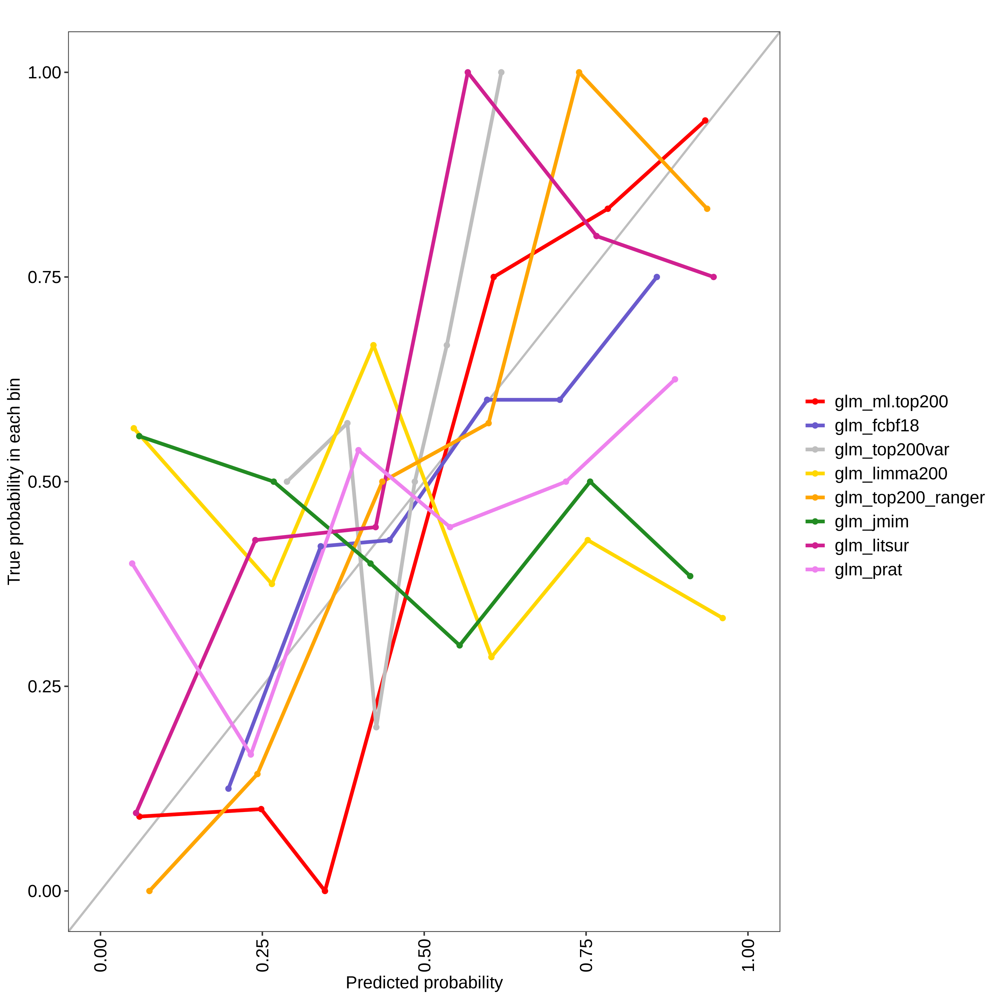

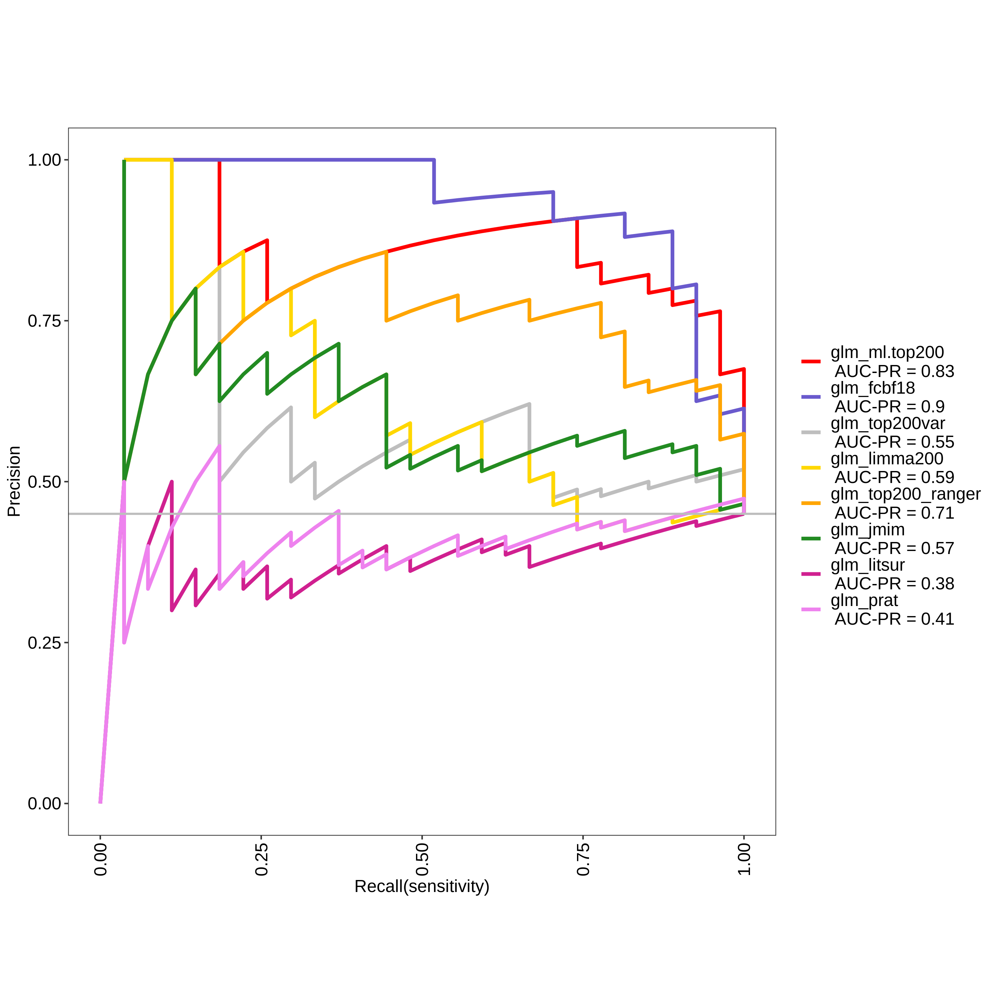

glm_ml.top200 Optimal Informedness = 0.720538720538721

glm_fcbf18 Optimal Informedness = 0.797979797979798

glm_top200var Optimal Informedness = 0.333333333333333

glm_limma200 Optimal Informedness = 0.262626262626263

glm_top200_ranger Optimal Informedness = 0.595959595959596

glm_jmim Optimal Informedness = 0.32996632996633

glm_litsur Optimal Informedness = 0.0202020202020201

glm_prat Optimal Informedness = 0.0909090909090908

glm_ml.top200 AUC-ROC = 0.91

glm_fcbf18 AUC-ROC = 0.94

glm_top200var AUC-ROC = 0.63

glm_limma200 AUC-ROC = 0.61

glm_top200_ranger AUC-ROC = 0.84

glm_jmim AUC-ROC = 0.68

glm_litsur AUC-ROC = 0.37

glm_prat AUC-ROC = 0.44



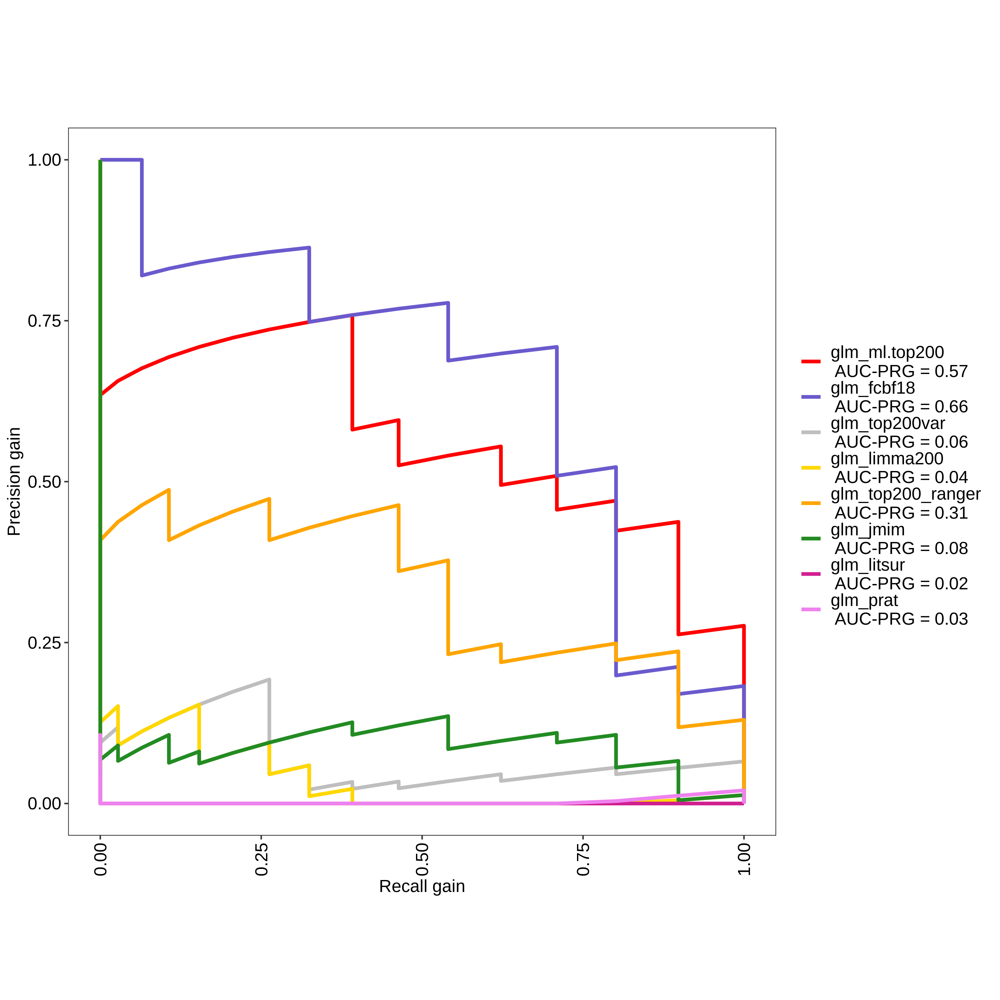

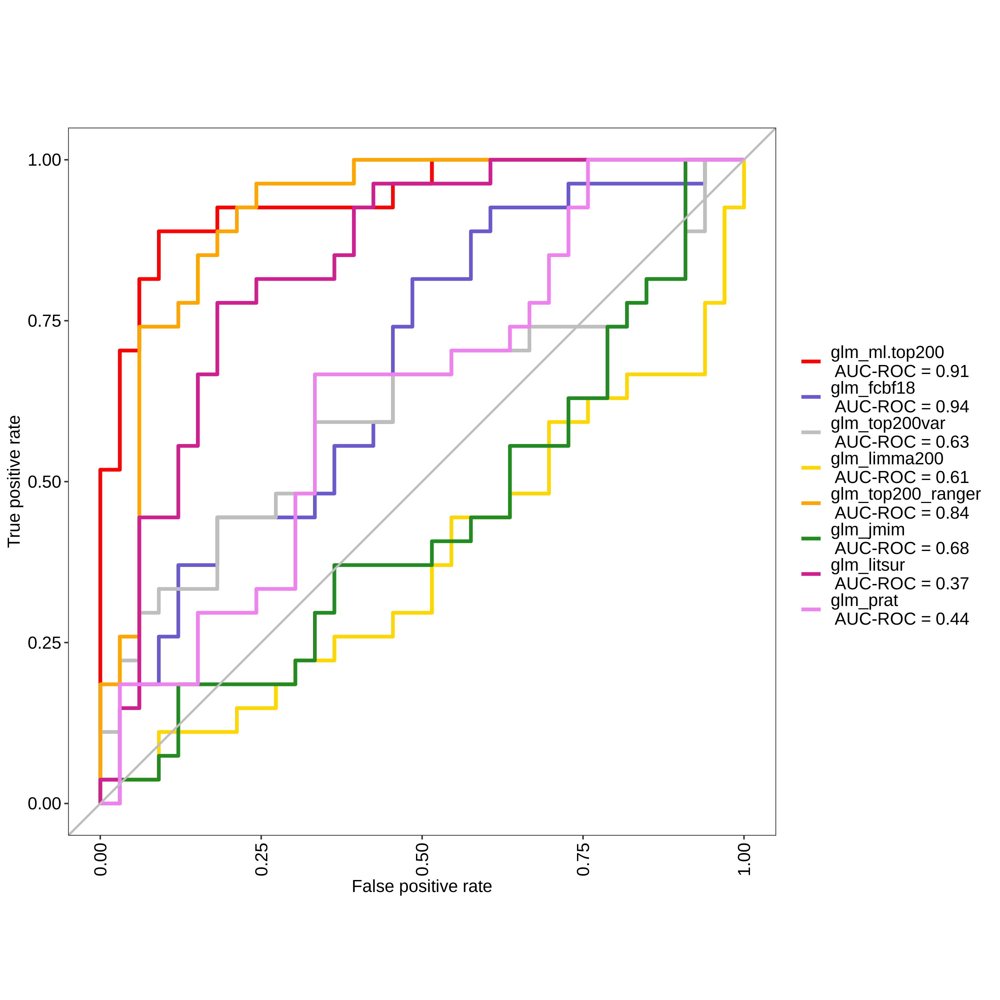

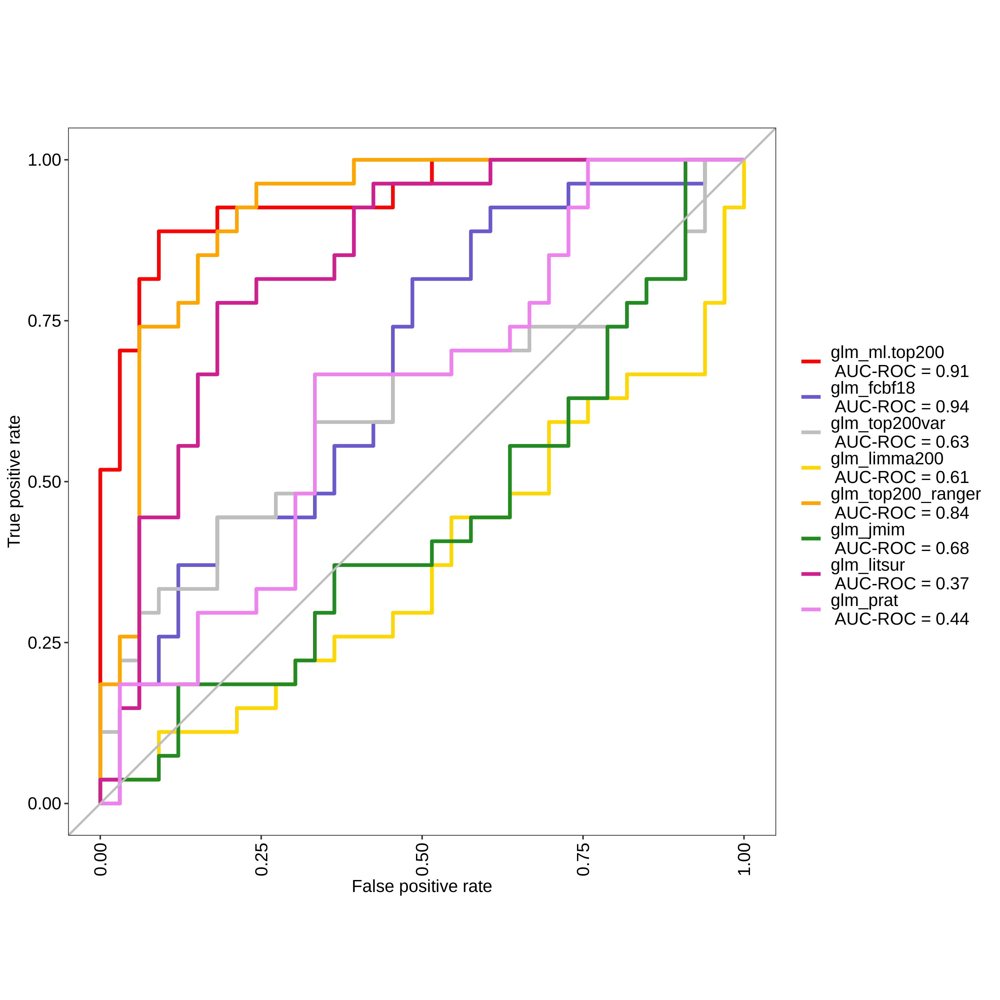

In [64]:
inp_top200_glm <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf18_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf18.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma200_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma200.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_top200_ranger_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_jmim_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_prat_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_glm <- evalm(list(inp_top200_glm, inp_fcbf18_glm, inp_top200var_glm, inp_limma200_glm, inp_top200_ranger_glm, inp_jmim_glm, inp_litsur_glm, inp_prat_glm),
             gnames=c('glm_ml.top200', 'glm_fcbf18', 'glm_top200var', 'glm_limma200', 'glm_top200_ranger', 'glm_jmim', 'glm_litsur', 'glm_prat'))
res_glm$roc

## SVM

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 480

Number of groups: 8

Observations per group: 60

Positive: Y

Negative: N

Group: svm_ml.top200

Positive: 27

Negative: 33

Group: svm_fcbf18

Positive: 27

Negative: 33

Group: svm_top200var

Positive: 27

Negative: 33

Group: svm_limma200

Positive: 27

Negative: 33

Group: svm_top200_ranger

Positive: 27

Negative: 33

Group: svm_jmim

Positive: 27

Negative: 33

Group: svm_litsur

Positive: 27

Negative: 33

Group: svm_prat

Positive: 27

Negative: 33

***Performance Metrics***



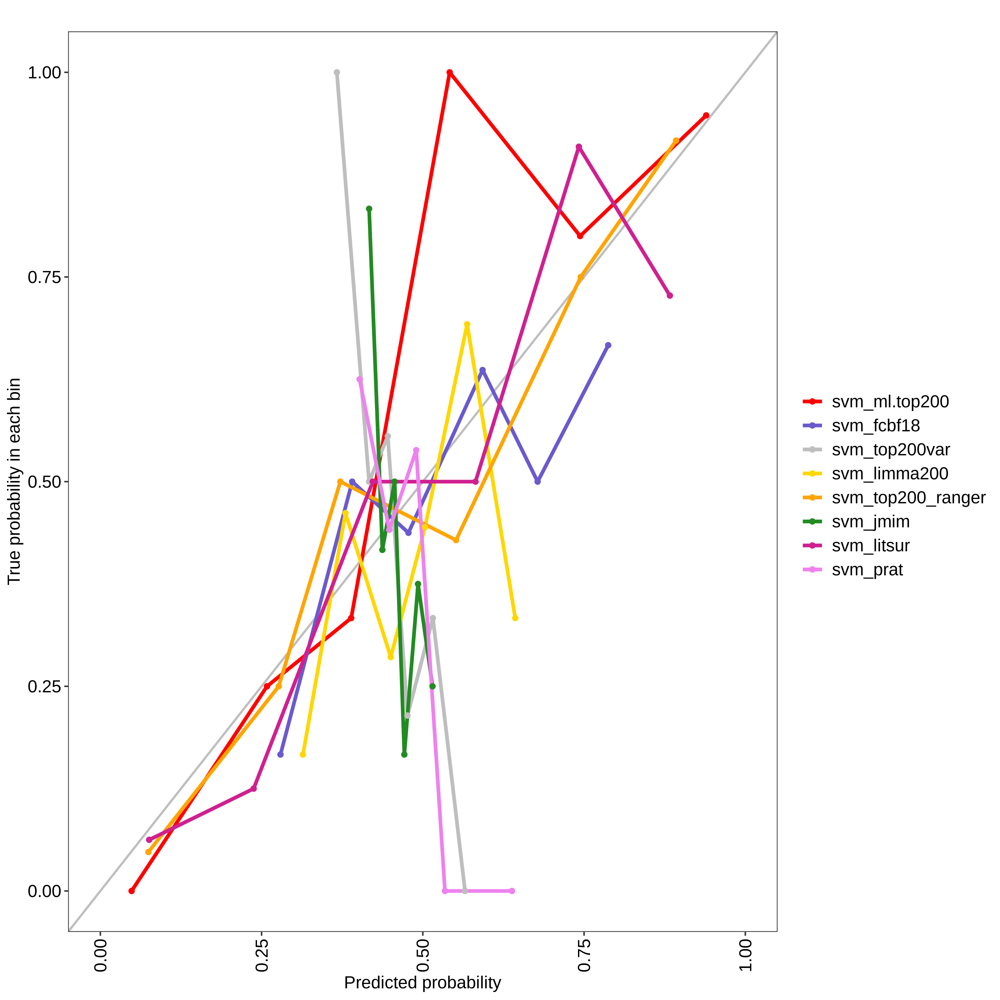

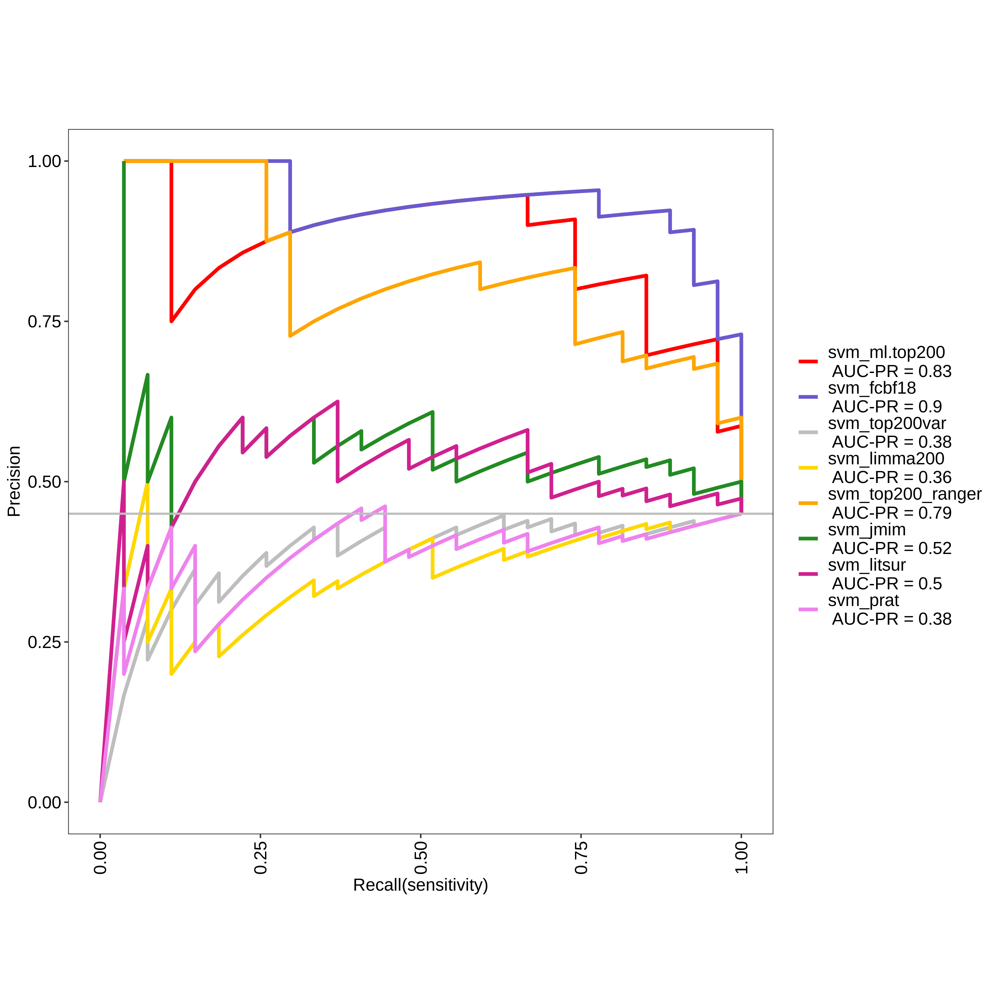

svm_ml.top200 Optimal Informedness = 0.7003367003367

svm_fcbf18 Optimal Informedness = 0.835016835016835

svm_top200var Optimal Informedness = 0

svm_limma200 Optimal Informedness = 0.0134680134680134

svm_top200_ranger Optimal Informedness = 0.619528619528619

svm_jmim Optimal Informedness = 0.252525252525253

svm_litsur Optimal Informedness = 0.272727272727273

svm_prat Optimal Informedness = 0.0202020202020203

svm_ml.top200 AUC-ROC = 0.91

svm_fcbf18 AUC-ROC = 0.96

svm_top200var AUC-ROC = 0.42

svm_limma200 AUC-ROC = 0.34

svm_top200_ranger AUC-ROC = 0.87

svm_jmim AUC-ROC = 0.64

svm_litsur AUC-ROC = 0.6

svm_prat AUC-ROC = 0.4



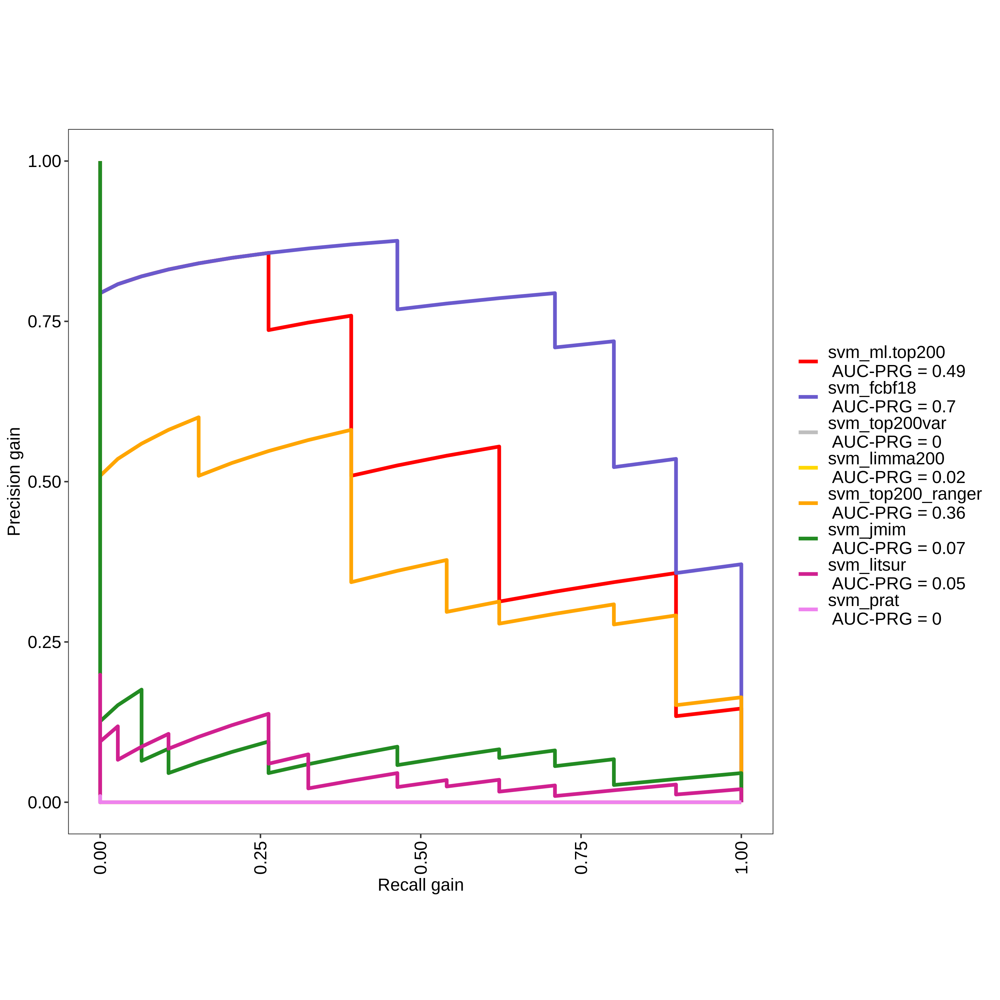

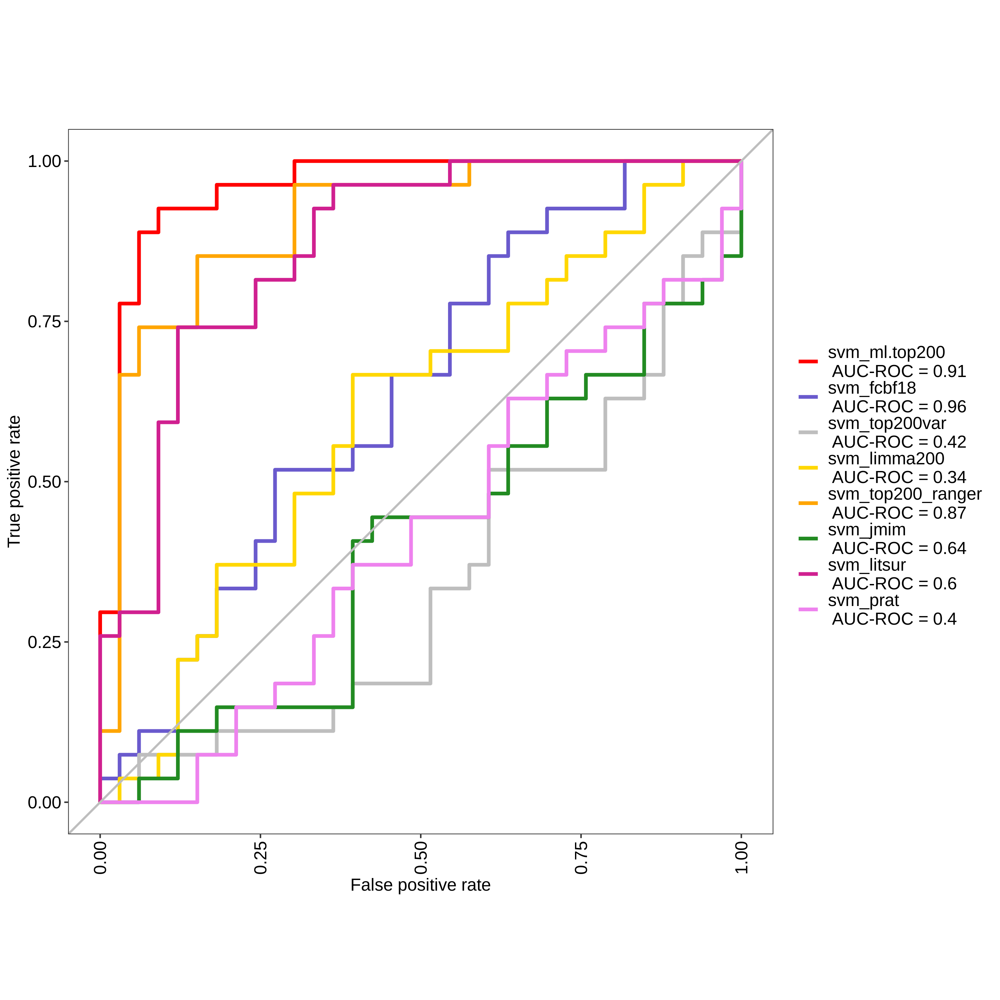

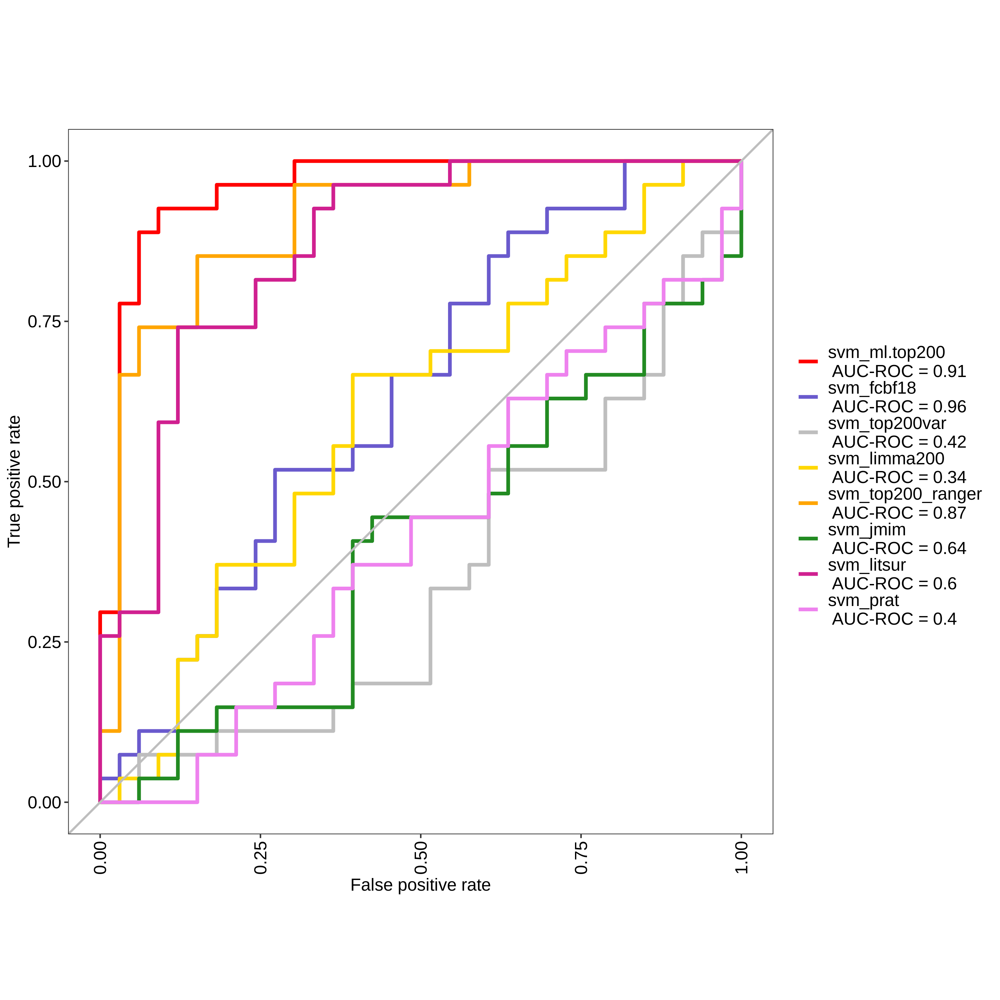

In [66]:
inp_top200_svm <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf18_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf18.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma200_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma200.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_jmim_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_prat_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
res_svm <- evalm(list(inp_top200_svm, inp_fcbf18_svm, inp_top200var_svm, inp_limma200_svm, inp_top200_ranger_svm, inp_jmim_svm, inp_litsur_svm, inp_prat_svm),
             gnames=c('svm_ml.top200', 'svm_fcbf18', 'svm_top200var', 'svm_limma200', 'svm_top200_ranger', 'svm_jmim', 'svm_litsur', 'svm_prat'))
res_svm$roc

## PCA Neural Network

# weights:  54
initial  value 27.938145 
iter  10 value 14.718703
iter  20 value 12.315397
iter  30 value 12.185172
iter  40 value 12.185005
iter  50 value 10.650579
iter  60 value 10.650027
iter  70 value 10.650019
iter  80 value 10.650002
final  value 10.650001 
converged
# weights:  158
initial  value 27.836532 
iter  10 value 10.854011
iter  20 value 7.327488
iter  30 value 7.153478
iter  40 value 7.009827
iter  50 value 3.997902
iter  60 value 1.617123
iter  70 value 1.514791
iter  80 value 0.074968
iter  90 value 0.017944
iter 100 value 0.009180
final  value 0.009180 
stopped after 100 iterations
# weights:  262
initial  value 29.362018 
iter  10 value 3.992004
iter  20 value 3.939271
iter  30 value 3.887416
iter  40 value 3.857612
final  value 3.857168 
converged
# weights:  54
initial  value 33.799684 
iter  10 value 12.491409
iter  20 value 7.528106
iter  30 value 6.110005
iter  40 value 6.070399
final  value 6.070331 
converged
# weights:  158
initial  value 33.326003 
iter  

initial  value 32.911515 
iter  10 value 8.631494
iter  20 value 3.332542
iter  30 value 2.847962
iter  40 value 2.832449
final  value 2.832264 
converged
# weights:  54
initial  value 26.442492 
iter  10 value 15.396523
iter  20 value 15.114765
iter  30 value 10.008833
iter  40 value 9.919981
iter  50 value 7.660350
iter  60 value 6.484159
iter  70 value 3.931911
iter  80 value 3.922731
iter  90 value 3.906437
iter 100 value 3.870160
final  value 3.870160 
stopped after 100 iterations
# weights:  158
initial  value 29.248062 
iter  10 value 6.097778
iter  20 value 2.325812
iter  30 value 2.160210
iter  40 value 2.093787
iter  50 value 2.048611
iter  60 value 1.983202
iter  70 value 1.951779
iter  80 value 1.941330
iter  90 value 1.931536
iter 100 value 1.923361
final  value 1.923361 
stopped after 100 iterations
# weights:  262
initial  value 27.595453 
iter  10 value 0.621443
iter  20 value 0.076601
iter  30 value 0.068708
iter  40 value 0.064307
iter  50 value 0.053998
iter  60 valu

initial  value 31.622467 
iter  10 value 6.124575
iter  20 value 6.088124
iter  30 value 6.079025
iter  40 value 6.069319
iter  50 value 6.048503
iter  60 value 2.251454
iter  70 value 2.077245
iter  80 value 2.070896
iter  90 value 2.063652
iter 100 value 2.045354
final  value 2.045354 
stopped after 100 iterations
# weights:  55
initial  value 29.296288 
iter  10 value 16.679237
final  value 16.678335 
converged
# weights:  161
initial  value 31.398515 
iter  10 value 9.429992
iter  20 value 9.327618
iter  30 value 5.473981
iter  40 value 4.751350
iter  50 value 1.789190
iter  60 value 1.505571
iter  70 value 1.046358
iter  80 value 1.000554
iter  90 value 1.000307
iter 100 value 1.000176
final  value 1.000176 
stopped after 100 iterations
# weights:  267
initial  value 24.661526 
iter  10 value 7.144738
iter  20 value 1.460619
iter  30 value 0.865609
iter  40 value 0.006869
iter  50 value 0.002650
iter  60 value 0.000380
final  value 0.000085 
converged
# weights:  55
initial  value

initial  value 29.254349 
iter  10 value 9.349467
iter  20 value 6.058801
iter  30 value 5.978128
iter  40 value 5.977890
iter  40 value 5.977890
iter  40 value 5.977890
final  value 5.977890 
converged
# weights:  161
initial  value 29.640383 
iter  10 value 6.081252
iter  20 value 3.793757
iter  30 value 3.379900
iter  40 value 3.315586
iter  50 value 3.315171
final  value 3.315171 
converged
# weights:  267
initial  value 34.543418 
iter  10 value 9.514462
iter  20 value 3.481326
iter  30 value 2.769833
iter  40 value 2.754413
iter  50 value 2.754382
iter  50 value 2.754382
iter  50 value 2.754382
final  value 2.754382 
converged
# weights:  55
initial  value 30.082194 
iter  10 value 13.181894
iter  20 value 13.032358
iter  30 value 10.769367
iter  40 value 10.665792
iter  50 value 10.546778
iter  60 value 10.541228
iter  70 value 5.696372
iter  80 value 5.636917
iter  90 value 3.732487
iter 100 value 3.727658
final  value 3.727658 
stopped after 100 iterations
# weights:  161
init

initial  value 29.108252 
iter  10 value 10.548557
iter  20 value 10.202409
iter  30 value 9.603282
iter  40 value 9.543540
iter  50 value 8.778588
iter  60 value 8.732023
iter  70 value 6.789927
iter  80 value 6.339646
iter  90 value 6.299729
iter 100 value 6.272350
final  value 6.272350 
stopped after 100 iterations
# weights:  53
initial  value 29.370788 
iter  10 value 15.998502
iter  20 value 15.998479
iter  30 value 15.998456
iter  40 value 15.998433
iter  50 value 15.998408
iter  60 value 15.998383
iter  70 value 15.998357
iter  80 value 15.998330
iter  90 value 15.998302
iter 100 value 15.998273
final  value 15.998273 
stopped after 100 iterations
# weights:  155
initial  value 29.464259 
iter  10 value 9.412796
iter  20 value 7.937935
iter  30 value 7.673119
iter  40 value 7.666957
iter  50 value 7.666348
iter  60 value 7.654252
iter  70 value 7.596667
iter  80 value 7.578724
iter  90 value 7.557548
iter 100 value 7.556085
final  value 7.556085 
stopped after 100 iterations
# 

initial  value 30.815816 
iter  10 value 4.319952
iter  20 value 3.990857
iter  30 value 3.987938
iter  40 value 3.982900
iter  50 value 3.971589
iter  60 value 3.917653
iter  70 value 3.037059
iter  80 value 2.839218
iter  90 value 2.007287
iter 100 value 2.000823
final  value 2.000823 
stopped after 100 iterations
# weights:  54
initial  value 26.713697 
iter  10 value 10.240123
iter  20 value 6.619661
iter  30 value 6.063638
iter  40 value 5.991747
iter  50 value 5.981839
final  value 5.981836 
converged
# weights:  158
initial  value 28.926894 
iter  10 value 8.382994
iter  20 value 3.736104
iter  30 value 3.357721
iter  40 value 3.346218
iter  50 value 3.346183
final  value 3.346183 
converged
# weights:  262
initial  value 31.226498 
iter  10 value 9.572789
iter  20 value 3.483758
iter  30 value 3.040192
iter  40 value 3.033462
iter  50 value 3.033413
final  value 3.033413 
converged
# weights:  54
initial  value 28.650502 
iter  10 value 12.991787
iter  20 value 10.729645
iter  

initial  value 25.861846 
iter  10 value 2.372586
iter  20 value 1.951021
iter  30 value 0.094880
iter  40 value 0.064723
iter  50 value 0.054356
iter  60 value 0.045470
iter  70 value 0.038460
iter  80 value 0.035121
iter  90 value 0.033559
iter 100 value 0.028488
final  value 0.028488 
stopped after 100 iterations
# weights:  54
initial  value 28.733420 
final  value 16.000000 
converged
# weights:  158
initial  value 25.998976 
iter  10 value 4.196564
iter  20 value 2.971195
iter  30 value 2.916357
iter  40 value 2.913106
iter  50 value 2.900005
iter  60 value 2.899992
iter  70 value 2.899343
iter  80 value 2.894723
iter  90 value 2.894654
iter 100 value 2.889609
final  value 2.889609 
stopped after 100 iterations
# weights:  262
initial  value 27.382690 
iter  10 value 7.258234
iter  20 value 4.056862
iter  30 value 4.001322
iter  40 value 4.000275
iter  50 value 4.000074
iter  60 value 3.999913
iter  70 value 3.999831
iter  80 value 3.999461
iter  90 value 3.998514
iter 100 value 

initial  value 32.429113 
iter  10 value 7.034912
iter  20 value 2.895276
iter  30 value 2.689295
iter  40 value 2.688702
final  value 2.688701 
converged
# weights:  54
initial  value 32.113633 
iter  10 value 12.111281
iter  20 value 12.110082
iter  30 value 12.108806
iter  40 value 12.107438
iter  50 value 12.105957
iter  60 value 12.104337
iter  70 value 12.102544
iter  80 value 12.100527
iter  90 value 12.098218
iter 100 value 12.095514
final  value 12.095514 
stopped after 100 iterations
# weights:  158
initial  value 25.349447 
iter  10 value 5.957300
iter  20 value 2.056752
iter  30 value 0.061472
iter  40 value 0.055893
iter  50 value 0.048320
iter  60 value 0.044849
iter  70 value 0.042040
iter  80 value 0.039249
iter  90 value 0.036157
iter 100 value 0.032298
final  value 0.032298 
stopped after 100 iterations
# weights:  262
initial  value 26.017504 
iter  10 value 12.463578
iter  20 value 10.769034
iter  30 value 8.399129
iter  40 value 8.367898
iter  50 value 8.332711
ite

initial  value 27.243587 
final  value 7.999998 
converged
# weights:  161
initial  value 26.462993 
iter  10 value 6.571816
iter  20 value 5.103024
iter  30 value 5.023016
iter  40 value 5.006001
iter  50 value 5.003293
iter  60 value 5.002011
iter  70 value 4.267721
iter  80 value 4.000287
iter  90 value 3.999322
iter 100 value 3.999307
final  value 3.999307 
stopped after 100 iterations
# weights:  267
initial  value 28.706980 
iter  10 value 6.395552
iter  20 value 4.938043
iter  30 value 3.067251
iter  40 value 3.013093
iter  50 value 2.056293
iter  60 value 2.026829
iter  70 value 2.020153
iter  80 value 2.004985
iter  90 value 2.000893
iter 100 value 2.000302
final  value 2.000302 
stopped after 100 iterations
# weights:  55
initial  value 28.478716 
iter  10 value 15.254199
iter  20 value 9.632325
iter  30 value 7.424596
iter  40 value 6.150635
iter  50 value 5.989440
iter  60 value 5.989114
final  value 5.989111 
converged
# weights:  161
initial  value 30.291028 
iter  10 val

initial  value 28.569410 
iter  10 value 6.103965
iter  20 value 6.099309
iter  30 value 6.089779
iter  40 value 6.054490
iter  50 value 3.965142
iter  60 value 3.923798
iter  70 value 3.830934
iter  80 value 3.644153
iter  90 value 1.980750
iter 100 value 1.635119
final  value 1.635119 
stopped after 100 iterations
# weights:  102
initial  value 30.836503 
iter  10 value 6.049078
iter  20 value 4.052600
iter  30 value 4.048442
iter  40 value 4.047609
iter  50 value 4.046554
iter  60 value 4.045078
iter  70 value 4.042524
iter  80 value 4.033804
iter  90 value 3.670053
iter 100 value 2.633307
final  value 2.633307 
stopped after 100 iterations
# weights:  22
initial  value 27.957078 
iter  10 value 3.959464
iter  20 value 3.941046
iter  30 value 3.895907
iter  40 value 1.961879
iter  50 value 1.958670
iter  60 value 1.951773
iter  70 value 1.923108
final  value 1.920015 
converged
# weights:  62
initial  value 28.163773 
iter  10 value 6.988342
iter  20 value 6.958030
iter  30 value 6.

initial  value 28.002896 
iter  10 value 0.062974
iter  20 value 0.030715
iter  30 value 0.026813
iter  40 value 0.025166
iter  50 value 0.023932
iter  60 value 0.022533
iter  70 value 0.021240
iter  80 value 0.020893
iter  90 value 0.020694
iter 100 value 0.020488
final  value 0.020488 
stopped after 100 iterations
# weights:  102
initial  value 30.545615 
iter  10 value 2.113017
iter  20 value 0.140392
iter  30 value 0.076567
iter  40 value 0.069796
iter  50 value 0.055474
iter  60 value 0.044678
iter  70 value 0.037690
iter  80 value 0.034289
iter  90 value 0.031761
iter 100 value 0.029223
final  value 0.029223 
stopped after 100 iterations
# weights:  22
initial  value 28.829791 
final  value 5.999993 
converged
# weights:  62
initial  value 28.489860 
iter  10 value 2.009233
iter  20 value 1.932568
iter  30 value 1.911519
iter  40 value 1.849281
iter  50 value 1.755624
iter  60 value 1.357593
iter  70 value 1.333476
iter  80 value 1.333365
final  value 1.333319 
converged
# weight

initial  value 28.704264 
iter  10 value 1.746282
iter  20 value 1.190753
iter  30 value 0.073593
iter  40 value 0.055083
iter  50 value 0.052285
iter  60 value 0.048321
iter  70 value 0.043032
iter  80 value 0.040560
iter  90 value 0.039201
iter 100 value 0.038703
final  value 0.038703 
stopped after 100 iterations
# weights:  102
initial  value 30.970018 
iter  10 value 4.154764
iter  20 value 2.132413
iter  30 value 2.098881
iter  40 value 2.058540
iter  50 value 2.043899
iter  60 value 2.035813
iter  70 value 2.020060
iter  80 value 1.995951
iter  90 value 1.012314
iter 100 value 0.062108
final  value 0.062108 
stopped after 100 iterations
# weights:  22
initial  value 26.952135 
iter  10 value 9.168302
iter  20 value 5.455893
iter  30 value 5.454080
iter  40 value 3.762407
iter  50 value 3.750467
iter  60 value 3.750055
final  value 3.750055 
converged
# weights:  62
initial  value 26.834715 
iter  10 value 7.991893
iter  20 value 6.000159
iter  30 value 6.000029
iter  40 value 5.

initial  value 26.410797 
iter  10 value 2.002109
iter  20 value 1.951861
iter  30 value 1.949966
iter  40 value 1.949276
iter  50 value 1.948446
iter  60 value 1.947773
iter  70 value 1.947627
iter  80 value 1.947565
iter  90 value 1.947520
iter 100 value 1.947452
final  value 1.947452 
stopped after 100 iterations
# weights:  65
initial  value 26.813881 
iter  10 value 1.973781
iter  20 value 1.937360
iter  30 value 0.151330
iter  40 value 0.080083
iter  50 value 0.062442
iter  60 value 0.057205
iter  70 value 0.054697
iter  80 value 0.050437
iter  90 value 0.044734
iter 100 value 0.042227
final  value 0.042227 
stopped after 100 iterations
# weights:  107
initial  value 26.807216 
iter  10 value 1.900427
iter  20 value 0.616839
iter  30 value 0.066503
iter  40 value 0.057170
iter  50 value 0.053514
iter  60 value 0.047194
iter  70 value 0.042099
iter  80 value 0.038174
iter  90 value 0.036790
iter 100 value 0.035636
final  value 0.035636 
stopped after 100 iterations
# weights:  23


initial  value 27.478255 
iter  10 value 2.014613
iter  20 value 1.954237
iter  30 value 1.952064
iter  40 value 1.951565
iter  50 value 1.951140
iter  60 value 1.951031
iter  70 value 1.950881
iter  80 value 1.950771
iter  90 value 1.950633
iter 100 value 1.950607
final  value 1.950607 
stopped after 100 iterations
# weights:  62
initial  value 28.915902 
iter  10 value 4.239734
iter  20 value 4.050440
iter  30 value 3.132287
iter  40 value 1.815872
iter  50 value 0.085708
iter  60 value 0.068347
iter  70 value 0.065543
iter  80 value 0.062071
iter  90 value 0.058289
iter 100 value 0.055150
final  value 0.055150 
stopped after 100 iterations
# weights:  102
initial  value 28.230930 
iter  10 value 0.088991
iter  20 value 0.066542
iter  30 value 0.052174
iter  40 value 0.046869
iter  50 value 0.040863
iter  60 value 0.036656
iter  70 value 0.034324
iter  80 value 0.032839
iter  90 value 0.032009
iter 100 value 0.031194
final  value 0.031194 
stopped after 100 iterations
# weights:  23


initial  value 26.393457 
iter  10 value 2.017544
iter  20 value 1.905212
iter  30 value 0.192791
iter  40 value 0.004490
iter  50 value 0.001594
iter  60 value 0.000164
final  value 0.000093 
converged
# weights:  23
initial  value 28.387538 
iter  10 value 8.529871
iter  20 value 7.856999
final  value 7.854398 
converged
# weights:  65
initial  value 30.242792 
iter  10 value 8.039853
iter  20 value 7.046921
iter  30 value 7.041446
final  value 7.041432 
converged
# weights:  107
initial  value 34.295757 
iter  10 value 7.859646
iter  20 value 6.776179
iter  30 value 5.712385
iter  40 value 5.688350
iter  50 value 5.680793
final  value 5.680743 
converged
# weights:  23
initial  value 26.718137 
iter  10 value 2.055759
iter  20 value 1.982793
iter  30 value 1.962535
iter  40 value 1.958284
iter  50 value 1.951141
iter  60 value 1.947444
iter  70 value 1.936528
iter  80 value 0.252932
iter  90 value 0.045462
iter 100 value 0.039607
final  value 0.039607 
stopped after 100 iterations
#

initial  value 28.244824 
iter  10 value 3.959401
iter  20 value 1.993827
iter  30 value 1.937363
iter  40 value 0.010888
iter  50 value 0.001325
iter  60 value 0.000797
iter  70 value 0.000328
final  value 0.000092 
converged
# weights:  102
initial  value 28.836090 
iter  10 value 4.330630
iter  20 value 1.999872
iter  30 value 1.999768
iter  40 value 1.999661
iter  50 value 1.999654
iter  60 value 1.999647
iter  70 value 1.999640
iter  80 value 1.999632
iter  90 value 1.999624
iter 100 value 1.999616
final  value 1.999616 
stopped after 100 iterations
# weights:  22
initial  value 26.458816 
iter  10 value 11.548951
iter  20 value 8.611099
final  value 8.604249 
converged
# weights:  62
initial  value 30.981508 
iter  10 value 8.376066
iter  20 value 6.630931
iter  30 value 6.607465
final  value 6.607366 
converged
# weights:  102
initial  value 32.084533 
iter  10 value 7.463394
iter  20 value 6.227607
iter  30 value 6.202719
final  value 6.202636 
converged
# weights:  22
initial 

initial  value 26.978399 
final  value 8.000000 
converged
# weights:  62
initial  value 25.429378 
iter  10 value 1.986193
iter  20 value 1.962924
iter  30 value 1.958864
iter  40 value 1.952880
iter  50 value 1.948270
iter  60 value 1.936171
iter  70 value 1.857067
iter  80 value 1.468688
iter  90 value 0.978860
iter 100 value 0.895876
final  value 0.895876 
stopped after 100 iterations
# weights:  102
initial  value 25.583784 
iter  10 value 1.937515
iter  20 value 0.235779
iter  30 value 0.015443
final  value 0.000071 
converged
# weights:  22
initial  value 31.194772 
iter  10 value 8.862747
iter  20 value 8.721490
final  value 8.721487 
converged
# weights:  62
initial  value 30.514283 
iter  10 value 7.840018
iter  20 value 6.467714
iter  30 value 6.439151
final  value 6.439145 
converged
# weights:  102
initial  value 31.047434 
iter  10 value 7.315892
iter  20 value 6.144622
iter  30 value 6.124065
iter  40 value 6.123605
final  value 6.123604 
converged
# weights:  22
initial

initial  value 34.876106 
iter  10 value 16.986639
iter  20 value 5.072153
iter  30 value 3.761011
iter  40 value 3.700984
iter  50 value 3.700189
iter  60 value 3.700170
final  value 3.700170 
converged
# weights:  272
initial  value 35.525533 
iter  10 value 9.635687
iter  20 value 3.627403
iter  30 value 3.242635
iter  40 value 3.170278
iter  50 value 3.168442
iter  60 value 3.168395
final  value 3.168394 
converged
# weights:  56
initial  value 27.619493 
iter  10 value 14.542373
iter  20 value 14.157591
iter  30 value 13.649302
iter  40 value 12.139579
iter  50 value 12.134092
iter  60 value 12.104918
iter  70 value 10.503870
iter  80 value 6.269791
iter  90 value 5.680321
iter 100 value 5.677420
final  value 5.677420 
stopped after 100 iterations
# weights:  164
initial  value 32.082885 
iter  10 value 16.773118
iter  20 value 14.535347
iter  30 value 14.480281
iter  40 value 13.726922
iter  50 value 11.531163
iter  60 value 6.081190
iter  70 value 5.334772
iter  80 value 5.27774

initial  value 31.684785 
iter  10 value 7.313913
iter  20 value 3.801643
iter  30 value 2.077502
iter  40 value 2.026205
iter  50 value 2.012567
iter  60 value 2.004353
iter  70 value 1.946677
iter  80 value 1.873463
iter  90 value 1.851044
iter 100 value 1.790193
final  value 1.790193 
stopped after 100 iterations
# weights:  262
initial  value 28.498246 
iter  10 value 11.256731
iter  20 value 7.423357
iter  30 value 7.244842
iter  40 value 7.096286
iter  50 value 5.351188
iter  60 value 5.335830
iter  70 value 5.315001
iter  80 value 5.243913
iter  90 value 4.342416
iter 100 value 4.279031
final  value 4.279031 
stopped after 100 iterations
# weights:  56
initial  value 28.683417 
iter  10 value 16.600436
iter  20 value 16.099154
iter  30 value 14.917258
iter  40 value 14.762274
iter  50 value 13.159349
iter  60 value 10.215926
iter  70 value 10.199006
iter  80 value 10.198982
iter  90 value 10.198949
iter  90 value 10.198949
iter  90 value 10.198949
final  value 10.198949 
converg

initial  value 28.245297 
iter  10 value 4.042002
iter  20 value 0.496578
iter  30 value 0.255843
iter  40 value 0.204173
iter  50 value 0.151969
iter  60 value 0.118951
iter  70 value 0.108771
iter  80 value 0.088677
iter  90 value 0.066393
iter 100 value 0.051706
final  value 0.051706 
stopped after 100 iterations
# weights:  56
initial  value 27.759510 
iter  10 value 15.536813
iter  20 value 14.427423
iter  30 value 12.763281
iter  40 value 12.759293
iter  50 value 12.736878
iter  60 value 12.148557
final  value 12.148555 
converged
# weights:  164
initial  value 29.080017 
iter  10 value 10.863807
iter  20 value 6.437864
iter  30 value 6.014837
iter  40 value 4.754339
iter  50 value 4.679469
iter  60 value 4.673429
iter  70 value 4.669499
iter  80 value 4.667980
iter  90 value 4.666768
iter 100 value 4.666671
final  value 4.666671 
stopped after 100 iterations
# weights:  272
initial  value 28.435022 
iter  10 value 13.566072
iter  20 value 6.912350
iter  30 value 4.082237
iter  4

initial  value 26.912776 
iter  10 value 3.110330
iter  20 value 2.414493
iter  30 value 1.502666
iter  40 value 1.334160
iter  50 value 1.333810
iter  60 value 1.333681
iter  70 value 1.333474
iter  80 value 1.333448
iter  90 value 1.333417
iter 100 value 0.128323
final  value 0.128323 
stopped after 100 iterations
# weights:  55
initial  value 32.201186 
iter  10 value 12.549832
iter  20 value 7.217570
iter  30 value 6.698171
iter  40 value 6.666208
iter  50 value 6.663172
iter  60 value 6.663132
final  value 6.663132 
converged
# weights:  161
initial  value 30.634231 
iter  10 value 15.748149
iter  20 value 7.396354
iter  30 value 4.815310
iter  40 value 4.299171
iter  50 value 4.280039
iter  60 value 4.279881
final  value 4.279878 
converged
# weights:  267
initial  value 34.483825 
iter  10 value 10.650209
iter  20 value 4.504280
iter  30 value 3.851684
iter  40 value 3.756431
iter  50 value 3.753166
final  value 3.753148 
converged
# weights:  55
initial  value 28.946975 
iter  

initial  value 32.166847 
iter  10 value 11.659971
iter  20 value 4.106334
iter  30 value 3.561814
iter  40 value 3.505369
iter  50 value 3.504239
iter  60 value 3.504226
final  value 3.504226 
converged
# weights:  54
initial  value 27.410754 
iter  10 value 14.999931
iter  20 value 13.147008
iter  30 value 11.378255
iter  40 value 9.555412
iter  50 value 7.736379
iter  60 value 7.637902
iter  70 value 7.602650
iter  80 value 5.815027
iter  90 value 5.803324
iter 100 value 5.798962
final  value 5.798962 
stopped after 100 iterations
# weights:  158
initial  value 29.853487 
iter  10 value 9.544585
iter  20 value 5.424846
iter  30 value 3.151654
iter  40 value 1.936079
iter  50 value 1.630102
iter  60 value 1.586250
iter  70 value 1.416973
iter  80 value 1.409882
iter  90 value 1.402982
iter 100 value 1.397603
final  value 1.397603 
stopped after 100 iterations
# weights:  262
initial  value 26.416401 
iter  10 value 8.164778
iter  20 value 4.734656
iter  30 value 3.796531
iter  40 val

initial  value 38.354930 
iter  10 value 5.712019
iter  20 value 3.431189
iter  30 value 3.337441
iter  40 value 1.876676
iter  50 value 1.833479
iter  60 value 1.826735
iter  70 value 1.763311
iter  80 value 1.108914
iter  90 value 1.093032
iter 100 value 1.087555
final  value 1.087555 
stopped after 100 iterations
# weights:  55
initial  value 28.282890 
iter  10 value 9.419499
iter  20 value 5.621891
iter  30 value 5.613754
iter  40 value 5.611841
iter  50 value 5.611164
iter  60 value 5.611107
iter  70 value 5.611076
final  value 5.611074 
converged
# weights:  161
initial  value 29.422179 
iter  10 value 5.883961
iter  20 value 4.182657
iter  30 value 4.000574
iter  40 value 4.000034
iter  50 value 4.000001
final  value 4.000000 
converged
# weights:  267
initial  value 28.591158 
iter  10 value 6.259780
iter  20 value 6.000484
iter  30 value 6.000132
iter  40 value 5.907056
iter  50 value 5.833580
iter  60 value 5.832995
iter  70 value 4.897373
iter  80 value 4.832764
iter  90 va

initial  value 35.194278 
iter  10 value 3.156439
iter  20 value 0.016285
iter  30 value 0.004788
iter  40 value 0.001012
iter  50 value 0.000304
iter  60 value 0.000111
iter  60 value 0.000089
iter  60 value 0.000089
final  value 0.000089 
converged
# weights:  56
initial  value 30.031904 
iter  10 value 9.271735
iter  20 value 6.648784
iter  30 value 6.510259
iter  40 value 6.509287
final  value 6.509286 
converged
# weights:  164
initial  value 34.529661 
iter  10 value 10.884831
iter  20 value 5.141758
iter  30 value 4.106883
iter  40 value 3.948038
iter  50 value 3.944208
final  value 3.944193 
converged
# weights:  272
initial  value 33.675270 
iter  10 value 10.391615
iter  20 value 4.444609
iter  30 value 3.795254
iter  40 value 3.752406
iter  50 value 3.741139
iter  60 value 3.741072
final  value 3.741072 
converged
# weights:  56
initial  value 27.607182 
iter  10 value 14.038862
iter  20 value 9.151900
iter  30 value 7.702449
iter  40 value 7.298305
iter  50 value 7.292481
i

initial  value 37.070746 
iter  10 value 10.813071
iter  20 value 4.617435
iter  30 value 3.853761
iter  40 value 3.716587
iter  50 value 3.691584
iter  60 value 3.691395
final  value 3.691395 
converged
# weights:  55
initial  value 27.115336 
iter  10 value 14.171180
iter  20 value 12.041335
iter  30 value 10.884948
iter  40 value 10.646905
iter  50 value 10.555809
iter  60 value 8.836873
iter  70 value 8.760574
iter  80 value 7.264806
iter  90 value 7.253224
iter 100 value 5.357895
final  value 5.357895 
stopped after 100 iterations
# weights:  161
initial  value 28.893601 
iter  10 value 13.689033
iter  20 value 12.127366
iter  30 value 11.172493
iter  40 value 9.307547
iter  50 value 7.125663
iter  60 value 7.014782
iter  70 value 7.011457
iter  80 value 6.532930
iter  90 value 6.176427
iter 100 value 5.401858
final  value 5.401858 
stopped after 100 iterations
# weights:  267
initial  value 29.701770 
iter  10 value 3.635446
iter  20 value 2.392329
iter  30 value 1.150956
iter  4

initial  value 29.930829 
iter  10 value 24.339123
iter  20 value 17.488571
iter  30 value 16.250697
iter  40 value 16.250142
final  value 16.250046 
converged
# weights:  161
initial  value 30.100079 
iter  10 value 8.785459
iter  20 value 4.566330
iter  30 value 3.533225
iter  40 value 3.517396
iter  50 value 3.503217
iter  60 value 3.501138
iter  70 value 3.500396
iter  80 value 3.500125
iter  90 value 3.500032
iter 100 value 3.500028
final  value 3.500028 
stopped after 100 iterations
# weights:  267
initial  value 27.526298 
iter  10 value 3.805729
iter  20 value 2.792912
iter  30 value 2.558103
iter  40 value 2.398440
iter  50 value 2.356278
iter  60 value 2.346394
iter  70 value 2.336684
iter  80 value 2.325633
iter  90 value 2.002238
iter 100 value 2.001210
final  value 2.001210 
stopped after 100 iterations
# weights:  55
initial  value 28.415106 
iter  10 value 16.686248
iter  20 value 8.754737
iter  30 value 7.879099
iter  40 value 6.443363
iter  50 value 6.437950
final  val

initial  value 27.687459 
iter  10 value 12.402373
iter  20 value 9.363190
iter  30 value 8.506439
iter  40 value 8.195858
iter  50 value 7.200286
iter  60 value 7.200118
iter  70 value 7.057197
iter  70 value 7.057197
iter  70 value 7.057197
final  value 7.057197 
converged
# weights:  252
initial  value 32.093449 
iter  10 value 1.211916
iter  20 value 0.037701
iter  30 value 0.000332
final  value 0.000073 
converged
# weights:  52
initial  value 30.968235 
iter  10 value 20.569504
iter  20 value 16.379661
iter  30 value 14.140296
iter  40 value 13.659239
iter  50 value 11.215473
iter  60 value 10.687362
iter  70 value 10.683464
final  value 10.683459 
converged
# weights:  152
initial  value 33.653643 
iter  10 value 11.584612
iter  20 value 6.212539
iter  30 value 4.963722
iter  40 value 4.799306
iter  50 value 4.786245
iter  60 value 4.755346
iter  70 value 4.740203
iter  80 value 4.705302
iter  90 value 4.703771
final  value 4.703754 
converged
# weights:  252
initial  value 32.3

initial  value 31.353355 
iter  10 value 9.331174
iter  20 value 4.356967
iter  30 value 1.238392
iter  40 value 0.647044
iter  50 value 0.147888
iter  60 value 0.010818
iter  70 value 0.003050
iter  80 value 0.001720
iter  90 value 0.000724
iter 100 value 0.000261
final  value 0.000261 
stopped after 100 iterations
# weights:  52
initial  value 31.868844 
iter  10 value 19.202644
iter  20 value 13.121347
iter  30 value 8.893895
iter  40 value 8.201205
iter  50 value 8.194009
iter  60 value 6.851577
iter  70 value 6.842566
final  value 6.842551 
converged
# weights:  152
initial  value 30.447829 
iter  10 value 14.714246
iter  20 value 8.300570
iter  30 value 6.535366
iter  40 value 4.942205
iter  50 value 4.642362
iter  60 value 4.517180
iter  70 value 4.512670
final  value 4.512652 
converged
# weights:  252
initial  value 31.794206 
iter  10 value 10.833027
iter  20 value 6.332040
iter  30 value 5.218818
iter  40 value 4.748370
iter  50 value 4.550702
iter  60 value 4.306237
iter  7

initial  value 35.327153 
iter  10 value 16.413238
iter  20 value 7.809215
iter  30 value 5.678296
iter  40 value 5.336100
iter  50 value 5.241743
iter  60 value 5.143293
iter  70 value 5.120690
iter  80 value 5.099464
iter  90 value 5.054861
iter 100 value 5.051255
final  value 5.051255 
stopped after 100 iterations
# weights:  52
initial  value 28.758385 
iter  10 value 19.460272
iter  20 value 18.775023
iter  30 value 17.166637
iter  40 value 16.380267
iter  50 value 14.166254
iter  60 value 13.672753
iter  70 value 11.086444
iter  80 value 10.708104
iter  90 value 10.705988
iter 100 value 10.701464
final  value 10.701464 
stopped after 100 iterations
# weights:  152
initial  value 30.532684 
iter  10 value 9.871181
iter  20 value 0.960627
iter  30 value 0.130896
iter  40 value 0.116066
iter  50 value 0.107953
iter  60 value 0.101536
iter  70 value 0.097258
iter  80 value 0.091717
iter  90 value 0.086896
iter 100 value 0.083296
final  value 0.083296 
stopped after 100 iterations
# w

initial  value 29.809083 
iter  10 value 12.772608
iter  20 value 12.636170
iter  30 value 10.834624
iter  40 value 10.688024
iter  50 value 10.668882
iter  60 value 9.077988
iter  70 value 8.967229
iter  80 value 8.964058
iter  90 value 8.957998
iter 100 value 7.376429
final  value 7.376429 
stopped after 100 iterations
# weights:  149
initial  value 32.334527 
iter  10 value 15.987131
iter  20 value 10.931676
iter  30 value 9.149108
iter  40 value 8.889511
iter  50 value 8.747315
iter  60 value 8.702415
iter  70 value 7.241743
iter  80 value 6.273150
iter  90 value 6.226114
iter 100 value 5.444397
final  value 5.444397 
stopped after 100 iterations
# weights:  247
initial  value 28.180186 
iter  10 value 8.925208
iter  20 value 5.110955
iter  30 value 4.208121
iter  40 value 4.176350
iter  50 value 4.155244
iter  60 value 4.134135
iter  70 value 3.186464
iter  80 value 3.156490
iter  90 value 2.188939
iter 100 value 2.144458
final  value 2.144458 
stopped after 100 iterations
# weigh

initial  value 30.251001 
iter  10 value 13.372076
iter  20 value 7.764590
iter  30 value 6.062648
iter  40 value 5.971628
iter  50 value 4.692925
iter  60 value 4.418344
iter  70 value 4.225511
iter  80 value 4.221003
iter  90 value 4.014695
iter 100 value 3.556524
final  value 3.556524 
stopped after 100 iterations
# weights:  247
initial  value 30.222695 
iter  10 value 13.341498
iter  20 value 11.813099
iter  30 value 3.840874
iter  40 value 3.233946
iter  50 value 2.533452
iter  60 value 2.168473
iter  70 value 2.128923
iter  80 value 2.110546
iter  90 value 2.094413
iter 100 value 2.089675
final  value 2.089675 
stopped after 100 iterations
# weights:  52
initial  value 26.751359 
iter  10 value 12.756722
iter  20 value 10.674671
iter  30 value 10.636547
iter  40 value 10.636430
iter  50 value 10.636368
final  value 10.636366 
converged
# weights:  152
initial  value 26.463948 
iter  10 value 8.745210
iter  20 value 6.092026
iter  30 value 6.010463
iter  40 value 6.001286
iter  5

initial  value 27.906510 
final  value 20.000000 
converged
# weights:  152
initial  value 27.594094 
iter  10 value 14.494001
iter  20 value 13.843525
iter  30 value 13.841378
iter  40 value 13.840936
iter  50 value 13.514700
iter  60 value 13.503775
iter  70 value 13.466899
iter  80 value 13.464564
iter  90 value 13.456405
iter 100 value 13.441552
final  value 13.441552 
stopped after 100 iterations
# weights:  252
initial  value 28.516837 
iter  10 value 12.924951
iter  20 value 11.536964
iter  30 value 9.685462
iter  40 value 8.231623
iter  50 value 8.106834
iter  60 value 7.250839
iter  70 value 7.197897
iter  80 value 7.193026
iter  90 value 7.191348
iter 100 value 7.190820
final  value 7.190820 
stopped after 100 iterations
# weights:  52
initial  value 33.835858 
iter  10 value 13.771643
iter  20 value 12.401897
iter  30 value 11.341335
iter  40 value 11.224137
iter  50 value 9.953435
iter  60 value 9.879135
iter  70 value 9.878078
final  value 9.878077 
converged
# weights:  1

initial  value 29.271546 
iter  10 value 20.764611
iter  20 value 14.122564
iter  30 value 11.629228
iter  40 value 9.979855
iter  50 value 9.845389
iter  60 value 9.182763
iter  70 value 8.469199
iter  80 value 7.169585
iter  90 value 7.163207
final  value 7.163190 
converged
# weights:  152
initial  value 32.649990 
iter  10 value 16.455331
iter  20 value 10.305791
iter  30 value 5.780224
iter  40 value 4.956915
iter  50 value 4.867575
iter  60 value 4.767885
iter  70 value 4.758688
final  value 4.758514 
converged
# weights:  252
initial  value 33.550423 
iter  10 value 11.116207
iter  20 value 5.386203
iter  30 value 4.666488
iter  40 value 4.461922
iter  50 value 4.393736
iter  60 value 4.337247
iter  70 value 4.334973
final  value 4.334963 
converged
# weights:  52
initial  value 27.293817 
iter  10 value 18.196487
iter  20 value 15.085581
iter  30 value 14.583484
iter  40 value 14.356569
iter  50 value 13.658783
iter  60 value 11.042799
iter  70 value 10.663840
iter  80 value 10

initial  value 30.843811 
iter  10 value 17.460353
iter  20 value 10.073904
iter  30 value 7.666939
iter  40 value 6.915682
iter  50 value 6.659914
iter  60 value 6.327225
iter  70 value 6.215992
iter  80 value 6.050224
iter  90 value 6.032638
iter 100 value 6.031476
final  value 6.031476 
stopped after 100 iterations
# weights:  252
initial  value 32.458689 
iter  10 value 13.864592
iter  20 value 7.795521
iter  30 value 5.456452
iter  40 value 4.725782
iter  50 value 4.531985
iter  60 value 4.476492
iter  70 value 4.444723
iter  80 value 4.439181
iter  90 value 4.439172
iter  90 value 4.439172
iter  90 value 4.439172
final  value 4.439172 
converged
# weights:  52
initial  value 27.327050 
iter  10 value 18.285233
iter  20 value 7.771740
iter  30 value 7.586543
iter  40 value 7.559725
iter  50 value 7.480366
iter  60 value 7.377555
iter  70 value 5.672221
iter  80 value 5.671187
iter  90 value 5.669726
iter 100 value 5.668405
final  value 5.668405 
stopped after 100 iterations
# weig

initial  value 27.048496 
iter  10 value 18.409042
iter  20 value 13.508725
iter  30 value 10.960894
iter  40 value 9.318128
iter  50 value 8.611773
iter  60 value 8.405575
iter  70 value 8.394655
final  value 8.394653 
converged
# weights:  149
initial  value 35.045629 
iter  10 value 14.627314
iter  20 value 6.850144
iter  30 value 5.677700
iter  40 value 5.408930
iter  50 value 5.251557
iter  60 value 5.244542
iter  70 value 5.244459
final  value 5.244458 
converged
# weights:  247
initial  value 31.748477 
iter  10 value 11.405600
iter  20 value 5.882179
iter  30 value 4.679004
iter  40 value 4.516951
iter  50 value 4.500807
iter  60 value 4.500008
final  value 4.500003 
converged
# weights:  51
initial  value 27.365045 
iter  10 value 15.298009
iter  20 value 14.889333
iter  30 value 12.278857
iter  40 value 10.654731
iter  50 value 10.652574
iter  60 value 10.516981
iter  70 value 9.017535
iter  80 value 9.015659
iter  90 value 9.012870
iter 100 value 7.447441
final  value 7.4474

initial  value 30.132074 
iter  10 value 4.401138
iter  20 value 3.322556
iter  30 value 3.293907
final  value 3.293880 
converged
# weights:  262
initial  value 34.975471 
iter  10 value 5.778070
iter  20 value 2.957208
iter  30 value 2.711016
iter  40 value 2.708853
final  value 2.708850 
converged
# weights:  54
initial  value 28.704563 
iter  10 value 12.168624
iter  20 value 12.142021
iter  30 value 11.951098
iter  40 value 9.536691
iter  50 value 8.935497
iter  60 value 8.839559
iter  70 value 8.795988
iter  80 value 7.264041
iter  90 value 7.257398
iter 100 value 5.631323
final  value 5.631323 
stopped after 100 iterations
# weights:  158
initial  value 27.902652 
iter  10 value 3.302441
iter  20 value 2.295380
iter  30 value 1.423783
iter  40 value 1.076947
iter  50 value 1.072376
iter  60 value 1.064990
iter  70 value 0.070182
iter  80 value 0.063601
iter  90 value 0.057502
iter 100 value 0.046892
final  value 0.046892 
stopped after 100 iterations
# weights:  262
initial  val

initial  value 27.111135 
iter  10 value 4.763058
iter  20 value 3.297106
iter  30 value 3.006270
iter  40 value 2.050561
iter  50 value 1.999643
iter  60 value 1.948671
iter  70 value 1.923642
iter  80 value 1.916027
iter  90 value 1.914380
iter 100 value 1.911614
final  value 1.911614 
stopped after 100 iterations
# weights:  54
initial  value 31.537521 
iter  10 value 9.908507
iter  20 value 5.951399
iter  30 value 5.934104
final  value 5.934080 
converged
# weights:  158
initial  value 30.663417 
iter  10 value 8.454750
iter  20 value 3.715300
iter  30 value 3.325052
iter  40 value 3.311569
iter  50 value 3.311485
final  value 3.311485 
converged
# weights:  262
initial  value 34.570684 
iter  10 value 8.946703
iter  20 value 3.262951
iter  30 value 2.805052
iter  40 value 2.783085
iter  50 value 2.782983
final  value 2.782983 
converged
# weights:  54
initial  value 27.330437 
iter  10 value 8.229459
iter  20 value 6.227799
iter  30 value 6.219981
iter  40 value 6.204222
iter  50 

initial  value 29.764554 
iter  10 value 7.679032
iter  20 value 6.739399
iter  30 value 5.179970
iter  40 value 4.211007
iter  50 value 4.187939
iter  60 value 3.928121
iter  70 value 2.113828
iter  80 value 2.101360
iter  90 value 2.084659
iter 100 value 2.072893
final  value 2.072893 
stopped after 100 iterations
# weights:  54
initial  value 28.633391 
iter  10 value 13.958342
iter  20 value 13.958248
iter  20 value 13.958248
iter  20 value 13.958248
final  value 13.958248 
converged
# weights:  158
initial  value 25.954653 
iter  10 value 1.639493
iter  20 value 0.103957
iter  30 value 0.009759
iter  40 value 0.003341
iter  50 value 0.001061
iter  60 value 0.000438
iter  70 value 0.000323
final  value 0.000075 
converged
# weights:  262
initial  value 27.682681 
iter  10 value 3.925031
iter  20 value 2.072681
iter  30 value 2.002875
iter  40 value 2.000166
iter  50 value 2.000074
iter  60 value 2.000040
iter  70 value 2.000014
final  value 2.000004 
converged
# weights:  54
initia

initial  value 28.464101 
iter  10 value 4.046345
iter  20 value 3.128092
iter  30 value 2.481560
iter  40 value 1.950447
iter  50 value 1.933197
iter  60 value 1.910004
iter  70 value 1.890427
iter  80 value 1.839868
iter  90 value 0.095005
iter 100 value 0.077665
final  value 0.077665 
stopped after 100 iterations
# weights:  257
initial  value 34.578295 
iter  10 value 4.847627
iter  20 value 2.136010
iter  30 value 0.170099
iter  40 value 0.083531
iter  50 value 0.073908
iter  60 value 0.071790
iter  70 value 0.070143
iter  80 value 0.058626
iter  90 value 0.035982
iter 100 value 0.026664
final  value 0.026664 
stopped after 100 iterations
# weights:  53
initial  value 29.112103 
iter  10 value 13.676010
iter  20 value 11.601913
iter  30 value 11.379519
iter  40 value 11.379176
final  value 11.379170 
converged
# weights:  155
initial  value 28.095039 
iter  10 value 11.462447
iter  20 value 7.274514
iter  30 value 7.056667
iter  40 value 6.958773
iter  50 value 6.871791
iter  60 v

initial  value 28.922965 
iter  10 value 8.364339
iter  20 value 1.724457
iter  30 value 0.087138
iter  40 value 0.022874
iter  50 value 0.005127
iter  60 value 0.000964
iter  70 value 0.000112
final  value 0.000097 
converged
# weights:  55
initial  value 28.989550 
iter  10 value 8.050076
iter  20 value 6.049110
iter  30 value 6.031979
final  value 6.031975 
converged
# weights:  161
initial  value 35.865642 
iter  10 value 12.027545
iter  20 value 3.907287
iter  30 value 3.414228
iter  40 value 3.391066
final  value 3.391035 
converged
# weights:  267
initial  value 33.782749 
iter  10 value 5.950114
iter  20 value 3.479742
iter  30 value 2.890581
iter  40 value 2.858707
iter  50 value 2.858440
final  value 2.858440 
converged
# weights:  55
initial  value 29.303570 
iter  10 value 13.142244
iter  20 value 12.338601
iter  30 value 12.315730
iter  40 value 7.500921
iter  50 value 7.420381
iter  60 value 5.481108
iter  70 value 1.954105
iter  80 value 1.953076
iter  90 value 1.949319


initial  value 28.004804 
iter  10 value 3.728929
iter  20 value 3.704013
iter  30 value 3.702717
iter  40 value 1.923312
iter  50 value 1.923131
iter  60 value 1.923121
iter  70 value 1.923062
iter  80 value 0.010996
iter  90 value 0.000419
iter 100 value 0.000291
final  value 0.000291 
stopped after 100 iterations
# weights:  161
initial  value 28.695837 
iter  10 value 3.313065
iter  20 value 3.008077
iter  30 value 2.026160
iter  40 value 2.000120
iter  50 value 2.000039
iter  60 value 2.000007
iter  60 value 2.000007
iter  60 value 2.000007
final  value 2.000007 
converged
# weights:  267
initial  value 30.642870 
iter  10 value 3.989200
iter  20 value 3.001150
iter  30 value 2.999095
iter  40 value 2.899226
iter  50 value 2.012422
iter  60 value 2.000345
iter  70 value 2.000159
iter  80 value 2.000050
final  value 2.000048 
converged
# weights:  55
initial  value 31.943582 
iter  10 value 11.818053
iter  20 value 7.356822
iter  30 value 5.946396
final  value 5.945478 
converged
#

initial  value 30.009389 
iter  10 value 10.094366
iter  20 value 6.004695
iter  30 value 5.895216
iter  40 value 5.894345
final  value 5.894345 
converged
# weights:  158
initial  value 31.851217 
iter  10 value 9.894972
iter  20 value 4.281165
iter  30 value 3.331886
iter  40 value 3.294105
iter  50 value 3.293583
iter  60 value 3.293575
final  value 3.293575 
converged
# weights:  262
initial  value 31.929982 
iter  10 value 9.746064
iter  20 value 2.866270
iter  30 value 2.704392
iter  40 value 2.696281
iter  50 value 2.696234
final  value 2.696234 
converged
# weights:  54
initial  value 27.370388 
iter  10 value 13.860431
iter  20 value 6.433540
iter  30 value 5.810022
iter  40 value 4.001503
iter  50 value 3.946319
iter  60 value 3.920052
iter  70 value 3.852275
iter  80 value 3.754186
iter  90 value 1.970824
iter 100 value 1.964749
final  value 1.964749 
stopped after 100 iterations
# weights:  158
initial  value 28.060153 
iter  10 value 4.357622
iter  20 value 4.110756
iter  

initial  value 32.499157 
iter  10 value 0.860177
iter  20 value 0.079192
iter  30 value 0.059709
iter  40 value 0.046811
iter  50 value 0.041486
iter  60 value 0.037556
iter  70 value 0.034070
iter  80 value 0.030857
iter  90 value 0.027526
iter 100 value 0.025933
final  value 0.025933 
stopped after 100 iterations
# weights:  54
initial  value 27.423931 
iter  10 value 11.897473
iter  20 value 11.700468
iter  30 value 11.530200
iter  40 value 11.122875
iter  50 value 9.379753
iter  60 value 9.353601
iter  70 value 9.352685
iter  80 value 9.220797
iter  90 value 7.253239
iter 100 value 7.234454
final  value 7.234454 
stopped after 100 iterations
# weights:  158
initial  value 29.871051 
iter  10 value 6.964225
iter  20 value 6.549074
iter  30 value 5.602476
iter  40 value 4.890203
iter  50 value 4.889048
iter  60 value 4.888954
iter  70 value 4.881377
iter  80 value 4.874616
iter  90 value 3.874068
iter 100 value 3.856252
final  value 3.856252 
stopped after 100 iterations
# weights: 

initial  value 33.289752 
iter  10 value 10.988344
iter  20 value 7.655995
iter  30 value 6.156748
iter  40 value 6.137990
final  value 6.137958 
converged
# weights:  161
initial  value 29.323432 
iter  10 value 8.368973
iter  20 value 3.690934
iter  30 value 3.413048
iter  40 value 3.410424
iter  50 value 3.410406
iter  50 value 3.410406
iter  50 value 3.410406
final  value 3.410406 
converged
# weights:  267
initial  value 36.379915 
iter  10 value 10.597809
iter  20 value 3.082023
iter  30 value 2.867802
iter  40 value 2.861266
iter  50 value 2.861180
final  value 2.861180 
converged
# weights:  55
initial  value 28.417507 
iter  10 value 5.972399
iter  20 value 5.953263
iter  30 value 5.928212
iter  40 value 5.869604
iter  50 value 5.725151
iter  60 value 5.694525
iter  70 value 3.895900
iter  80 value 3.890525
iter  90 value 3.884914
iter 100 value 3.881270
final  value 3.881270 
stopped after 100 iterations
# weights:  161
initial  value 29.926432 
iter  10 value 6.023708
iter  

initial  value 37.678948 
iter  10 value 11.391406
iter  20 value 4.710634
iter  30 value 3.421889
iter  40 value 3.348766
iter  50 value 3.346771
final  value 3.346761 
converged
# weights:  55
initial  value 28.135654 
iter  10 value 15.009136
iter  20 value 13.479673
iter  30 value 5.648984
iter  40 value 3.874338
iter  50 value 3.872961
iter  60 value 3.870802
iter  70 value 3.869760
iter  80 value 2.046206
iter  90 value 1.962235
iter 100 value 1.960689
final  value 1.960689 
stopped after 100 iterations
# weights:  161
initial  value 28.781708 
iter  10 value 3.391404
iter  20 value 2.818499
iter  30 value 2.773859
iter  40 value 2.504434
iter  50 value 2.401200
iter  60 value 2.392364
iter  70 value 2.389221
iter  80 value 1.304301
iter  90 value 1.053814
iter 100 value 1.041243
final  value 1.041243 
stopped after 100 iterations
# weights:  267
initial  value 27.892755 
iter  10 value 6.384218
iter  20 value 6.192795
iter  30 value 6.169741
iter  40 value 6.153274
iter  50 valu

initial  value 32.131667 
iter  10 value 6.475391
iter  20 value 4.334885
iter  30 value 2.009521
iter  40 value 1.708630
iter  50 value 1.683000
iter  60 value 1.668851
iter  70 value 1.609491
iter  80 value 1.255905
iter  90 value 1.121316
iter 100 value 0.227883
final  value 0.227883 
stopped after 100 iterations
# weights:  53
initial  value 29.120020 
iter  10 value 11.657519
iter  20 value 3.870455
iter  30 value 3.847363
iter  40 value 1.952785
iter  50 value 1.920157
iter  60 value 0.000950
final  value 0.000078 
converged
# weights:  155
initial  value 29.257509 
iter  10 value 9.076011
iter  20 value 7.541139
iter  30 value 7.501268
iter  40 value 7.500004
final  value 7.500000 
converged
# weights:  257
initial  value 27.893801 
iter  10 value 7.725075
iter  20 value 7.362871
iter  30 value 6.670052
iter  40 value 5.337764
iter  50 value 4.519186
iter  60 value 2.592563
iter  70 value 1.370448
iter  80 value 1.339493
iter  90 value 1.337799
iter 100 value 1.178993
final  val

initial  value 30.868372 
iter  10 value 21.042778
iter  20 value 12.405573
iter  30 value 10.205550
iter  40 value 9.799768
iter  50 value 6.357953
iter  60 value 6.235812
iter  70 value 6.234313
iter  80 value 6.234152
iter  80 value 6.234152
iter  80 value 6.234152
final  value 6.234152 
converged
# weights:  158
initial  value 33.594159 
iter  10 value 7.149972
iter  20 value 3.882896
iter  30 value 3.756648
iter  40 value 3.754674
final  value 3.754673 
converged
# weights:  262
initial  value 32.945612 
iter  10 value 11.221365
iter  20 value 3.967796
iter  30 value 3.480954
iter  40 value 3.463235
iter  50 value 3.462884
final  value 3.462884 
converged
# weights:  54
initial  value 27.265380 
iter  10 value 17.295229
iter  20 value 16.441246
iter  30 value 16.374915
iter  40 value 16.093718
iter  50 value 15.523858
iter  60 value 13.301178
iter  70 value 13.186081
iter  80 value 13.159013
iter  90 value 11.881725
iter 100 value 11.852542
final  value 11.852542 
stopped after 10

initial  value 32.174710 
iter  10 value 20.961674
iter  20 value 19.699416
iter  30 value 16.406140
iter  40 value 10.691990
iter  50 value 10.668965
iter  60 value 10.667976
iter  70 value 9.086590
iter  80 value 9.083831
iter  90 value 8.793621
iter 100 value 3.891593
final  value 3.891593 
stopped after 100 iterations
# weights:  158
initial  value 27.125911 
iter  10 value 0.320440
iter  20 value 0.208398
iter  30 value 0.128828
iter  40 value 0.102264
iter  50 value 0.080208
iter  60 value 0.066225
iter  70 value 0.059414
iter  80 value 0.054625
iter  90 value 0.050390
iter 100 value 0.048042
final  value 0.048042 
stopped after 100 iterations
# weights:  262
initial  value 28.401196 
iter  10 value 6.247343
iter  20 value 4.175556
iter  30 value 3.234355
iter  40 value 2.177217
iter  50 value 2.156410
iter  60 value 2.139482
iter  70 value 2.057446
iter  80 value 2.035768
iter  90 value 1.946641
iter 100 value 1.927383
final  value 1.927383 
stopped after 100 iterations
# weight

initial  value 28.388011 
iter  10 value 12.432265
iter  20 value 6.091012
iter  30 value 5.623719
iter  40 value 5.623471
iter  50 value 5.623419
iter  60 value 5.623378
iter  70 value 5.623352
iter  80 value 5.623347
iter  80 value 5.623347
iter  80 value 5.623347
final  value 5.623347 
converged
# weights:  161
initial  value 29.084025 
iter  10 value 10.887766
iter  20 value 9.697893
iter  30 value 9.647433
iter  40 value 9.619221
iter  50 value 9.423105
iter  60 value 9.420092
iter  70 value 9.418165
iter  80 value 8.505523
iter  90 value 8.500772
iter 100 value 8.500662
final  value 8.500662 
stopped after 100 iterations
# weights:  267
initial  value 31.246137 
iter  10 value 4.208464
iter  20 value 3.883341
iter  30 value 3.521740
iter  40 value 3.488244
iter  50 value 3.033728
iter  60 value 3.013507
iter  70 value 3.011081
iter  80 value 3.006993
iter  90 value 3.000519
iter 100 value 3.000009
final  value 3.000009 
stopped after 100 iterations
# weights:  55
initial  value 3

initial  value 29.454616 
iter  10 value 10.939259
iter  20 value 7.614920
iter  30 value 6.220596
iter  40 value 6.218518
final  value 6.218515 
converged
# weights:  158
initial  value 35.561285 
iter  10 value 15.226980
iter  20 value 4.741443
iter  30 value 3.920822
iter  40 value 3.743694
iter  50 value 3.740485
final  value 3.740479 
converged
# weights:  262
initial  value 32.053989 
iter  10 value 9.882047
iter  20 value 3.939584
iter  30 value 3.268855
iter  40 value 3.216371
iter  50 value 3.215839
iter  60 value 3.215835
final  value 3.215834 
converged
# weights:  54
initial  value 27.290707 
iter  10 value 13.488978
iter  20 value 7.778476
iter  30 value 7.395133
iter  40 value 7.282002
iter  50 value 7.252848
iter  60 value 7.250096
iter  70 value 5.626919
iter  80 value 2.093473
iter  90 value 1.953754
iter 100 value 1.947095
final  value 1.947095 
stopped after 100 iterations
# weights:  158
initial  value 28.607982 
iter  10 value 12.123418
iter  20 value 10.133691
ite

initial  value 26.726152 
iter  10 value 7.831929
iter  20 value 5.963515
iter  30 value 2.149452
iter  40 value 2.117064
iter  50 value 2.044294
iter  60 value 1.797317
iter  70 value 1.696291
iter  80 value 1.669303
iter  90 value 0.563729
iter 100 value 0.117721
final  value 0.117721 
stopped after 100 iterations
# weights:  262
initial  value 31.684770 
iter  10 value 10.653857
iter  20 value 8.353977
iter  30 value 8.243884
iter  40 value 8.204045
iter  50 value 7.189598
iter  60 value 7.165827
iter  70 value 6.718286
iter  80 value 5.198532
iter  90 value 4.181882
iter 100 value 4.159996
final  value 4.159996 
stopped after 100 iterations
# weights:  54
initial  value 28.442603 
iter  10 value 16.883501
iter  20 value 13.754889
iter  30 value 12.000838
iter  40 value 11.999921
iter  50 value 11.999778
iter  60 value 11.999187
iter  70 value 10.620843
iter  80 value 10.614764
iter  90 value 10.510657
iter 100 value 10.483544
final  value 10.483544 
stopped after 100 iterations
# w

initial  value 29.342874 
final  value 16.000000 
converged
# weights:  158
initial  value 28.957532 
iter  10 value 3.552499
iter  20 value 1.403055
iter  30 value 1.336306
iter  40 value 1.333611
iter  50 value 1.333336
iter  50 value 1.333336
iter  50 value 1.333336
final  value 1.333336 
converged
# weights:  262
initial  value 27.490224 
iter  10 value 2.057274
iter  20 value 1.997488
iter  30 value 1.921683
iter  40 value 0.050862
iter  50 value 0.001897
iter  60 value 0.001106
iter  70 value 0.000147
iter  80 value 0.000136
iter  90 value 0.000114
final  value 0.000096 
converged
# weights:  54
initial  value 30.684640 
iter  10 value 13.762190
iter  20 value 8.012004
iter  30 value 6.419197
iter  40 value 6.226520
iter  50 value 6.223441
final  value 6.223431 
converged
# weights:  158
initial  value 35.552225 
iter  10 value 9.264072
iter  20 value 4.345264
iter  30 value 3.780949
iter  40 value 3.740228
iter  50 value 3.739394
final  value 3.739384 
converged
# weights:  262


initial  value 34.806123 
iter  10 value 9.967656
iter  20 value 3.811056
iter  30 value 3.393305
iter  40 value 3.378850
iter  50 value 3.378667
final  value 3.378666 
converged
# weights:  55
initial  value 27.278562 
iter  10 value 17.844138
iter  20 value 15.063961
iter  30 value 7.257165
iter  40 value 3.886042
iter  50 value 3.874848
iter  60 value 3.873057
iter  70 value 3.870884
iter  80 value 3.868603
iter  90 value 2.004940
iter 100 value 1.962689
final  value 1.962689 
stopped after 100 iterations
# weights:  161
initial  value 33.282334 
iter  10 value 8.239388
iter  20 value 5.870233
iter  30 value 2.204899
iter  40 value 2.027218
iter  50 value 2.004538
iter  60 value 1.996244
iter  70 value 1.965532
iter  80 value 1.947848
iter  90 value 1.930720
iter 100 value 1.924170
final  value 1.924170 
stopped after 100 iterations
# weights:  267
initial  value 29.513577 
iter  10 value 1.895286
iter  20 value 0.229928
iter  30 value 0.110608
iter  40 value 0.101066
iter  50 value

initial  value 26.126135 
iter  10 value 14.640581
iter  20 value 10.210527
iter  30 value 10.098019
iter  40 value 10.085135
iter  50 value 10.073352
iter  60 value 10.064419
iter  70 value 10.059900
iter  80 value 10.055673
iter  90 value 10.052278
iter 100 value 10.049820
final  value 10.049820 
stopped after 100 iterations
# weights:  92
initial  value 28.479633 
iter  10 value 17.075975
iter  20 value 6.512859
iter  30 value 6.322929
iter  40 value 4.347441
iter  50 value 4.212180
iter  60 value 3.531732
iter  70 value 3.513651
iter  80 value 3.488139
iter  90 value 3.468062
iter 100 value 3.458931
final  value 3.458931 
stopped after 100 iterations
# weights:  152
initial  value 27.653067 
iter  10 value 7.142244
iter  20 value 2.132151
iter  30 value 2.097543
iter  40 value 2.028434
iter  50 value 1.499138
iter  60 value 0.235619
iter  70 value 0.154368
iter  80 value 0.142759
iter  90 value 0.132581
iter 100 value 0.120115
final  value 0.120115 
stopped after 100 iterations
# w

initial  value 34.155385 
iter  10 value 10.525263
iter  20 value 3.181275
iter  30 value 1.990137
iter  40 value 1.723671
iter  50 value 1.233989
iter  60 value 0.325427
iter  70 value 0.231281
iter  80 value 0.213570
iter  90 value 0.202030
iter 100 value 0.189088
final  value 0.189088 
stopped after 100 iterations
# weights:  32
initial  value 27.261116 
iter  10 value 17.987800
iter  20 value 17.340731
iter  30 value 16.679739
iter  40 value 15.930239
iter  50 value 15.911296
iter  60 value 15.907370
iter  70 value 15.904688
iter  80 value 15.901104
iter  90 value 15.899602
iter 100 value 15.899496
final  value 15.899496 
stopped after 100 iterations
# weights:  92
initial  value 27.921360 
iter  10 value 13.949326
iter  20 value 5.245830
iter  30 value 3.743694
iter  40 value 3.671121
iter  50 value 3.652711
iter  60 value 1.969502
iter  70 value 1.852175
iter  80 value 1.846739
iter  90 value 1.838108
iter 100 value 1.799490
final  value 1.799490 
stopped after 100 iterations
# w

initial  value 28.734956 
iter  10 value 11.867981
iter  20 value 8.011928
iter  30 value 6.952235
iter  40 value 6.936536
iter  50 value 6.913859
iter  60 value 6.835556
iter  70 value 6.834187
iter  80 value 6.833876
iter  90 value 6.833541
iter 100 value 6.827572
final  value 6.827572 
stopped after 100 iterations
# weights:  182
initial  value 30.445564 
iter  10 value 13.595170
iter  20 value 5.082113
iter  30 value 2.056727
iter  40 value 2.001060
iter  50 value 2.000362
iter  60 value 2.000015
iter  70 value 2.000008
final  value 2.000007 
converged
# weights:  38
initial  value 28.277658 
iter  10 value 18.079234
iter  20 value 16.299047
iter  30 value 16.215216
iter  40 value 15.929569
iter  50 value 15.762113
iter  60 value 15.761330
final  value 15.761329 
converged
# weights:  110
initial  value 31.100530 
iter  10 value 19.109576
iter  20 value 13.674955
iter  30 value 13.192124
iter  40 value 13.144595
iter  50 value 13.143719
final  value 13.143718 
converged
# weights: 

initial  value 29.409286 
iter  10 value 21.206906
iter  20 value 18.687481
iter  30 value 18.060491
iter  40 value 18.055575
final  value 18.055575 
converged
# weights:  92
initial  value 29.329954 
iter  10 value 18.665545
iter  20 value 15.985537
iter  30 value 15.465073
iter  40 value 15.383873
iter  50 value 15.294753
iter  60 value 15.292702
final  value 15.292702 
converged
# weights:  152
initial  value 29.534396 
iter  10 value 18.629711
iter  20 value 15.938018
iter  30 value 15.197195
iter  40 value 14.930488
iter  50 value 14.800785
iter  60 value 14.742468
iter  70 value 14.594568
iter  80 value 14.511377
iter  90 value 14.477816
iter 100 value 14.477215
final  value 14.477215 
stopped after 100 iterations
# weights:  32
initial  value 30.679286 
iter  10 value 14.550274
iter  20 value 8.533154
iter  30 value 7.648819
iter  40 value 6.056755
iter  50 value 5.864180
iter  60 value 5.849341
iter  70 value 5.847401
iter  80 value 5.846302
iter  90 value 5.845354
iter 100 val

initial  value 28.934628 
iter  10 value 20.641989
iter  20 value 12.950253
iter  30 value 12.862975
iter  40 value 11.742406
iter  50 value 11.666578
iter  60 value 11.653396
iter  70 value 11.647383
iter  80 value 11.643524
iter  90 value 11.642043
iter 100 value 11.641538
final  value 11.641538 
stopped after 100 iterations
# weights:  92
initial  value 30.058451 
iter  10 value 18.604187
iter  20 value 5.238937
iter  30 value 2.404681
iter  40 value 2.182043
iter  50 value 2.171788
iter  60 value 2.160113
iter  70 value 0.176139
iter  80 value 0.157764
iter  90 value 0.147858
iter 100 value 0.134696
final  value 0.134696 
stopped after 100 iterations
# weights:  152
initial  value 29.267583 
iter  10 value 7.908314
iter  20 value 2.399112
iter  30 value 2.209264
iter  40 value 1.985751
iter  50 value 1.878834
iter  60 value 1.794551
iter  70 value 1.673032
iter  80 value 0.757159
iter  90 value 0.206338
iter 100 value 0.159866
final  value 0.159866 
stopped after 100 iterations
# w

initial  value 31.324953 
iter  10 value 13.170569
iter  20 value 3.924918
iter  30 value 1.985886
iter  40 value 1.420684
iter  50 value 1.367300
iter  60 value 1.231425
iter  70 value 0.353010
iter  80 value 0.319973
iter  90 value 0.299483
iter 100 value 0.257163
final  value 0.257163 
stopped after 100 iterations
# weights:  32
initial  value 28.588086 
iter  10 value 16.072896
iter  20 value 14.286507
iter  30 value 12.042434
iter  40 value 10.892647
iter  50 value 9.391783
iter  60 value 9.189045
iter  70 value 9.035643
iter  80 value 9.005799
iter  90 value 9.004142
final  value 9.004138 
converged
# weights:  92
initial  value 28.112363 
iter  10 value 17.399516
iter  20 value 6.767820
iter  30 value 5.307109
iter  40 value 4.121686
iter  50 value 3.930105
iter  60 value 3.907085
iter  70 value 3.837479
iter  80 value 2.839631
iter  90 value 2.835827
iter 100 value 2.835170
final  value 2.835170 
stopped after 100 iterations
# weights:  152
initial  value 27.029043 
iter  10 va

initial  value 28.845748 
iter  10 value 9.150743
iter  20 value 0.284501
iter  30 value 0.243745
iter  40 value 0.194504
iter  50 value 0.167877
iter  60 value 0.143650
iter  70 value 0.122378
iter  80 value 0.108365
iter  90 value 0.102000
iter 100 value 0.095591
final  value 0.095591 
stopped after 100 iterations
# weights:  33
initial  value 29.949377 
iter  10 value 18.327972
iter  20 value 14.377762
iter  30 value 13.818464
iter  40 value 13.665983
iter  50 value 13.655101
iter  60 value 13.654898
final  value 13.654891 
converged
# weights:  95
initial  value 28.210589 
iter  10 value 16.414088
iter  20 value 13.562421
iter  30 value 10.649858
iter  40 value 10.019127
iter  50 value 9.909175
iter  60 value 9.732881
iter  70 value 9.411165
iter  80 value 9.332598
iter  90 value 9.223128
iter 100 value 8.226173
final  value 8.226173 
stopped after 100 iterations
# weights:  157
initial  value 28.549628 
iter  10 value 16.076304
iter  20 value 5.074631
iter  30 value 4.008128
iter 

initial  value 28.294018 
iter  10 value 12.692786
iter  20 value 5.474012
iter  30 value 4.497635
iter  40 value 3.510916
iter  50 value 1.922430
iter  60 value 1.543924
iter  70 value 1.512778
iter  80 value 1.504478
iter  90 value 1.502521
iter 100 value 1.500677
final  value 1.500677 
stopped after 100 iterations
# weights:  152
initial  value 27.462889 
iter  10 value 8.236911
iter  20 value 3.898510
iter  30 value 3.878098
iter  40 value 3.875025
final  value 3.875000 
converged
# weights:  32
initial  value 28.160701 
iter  10 value 21.490460
iter  20 value 18.825169
iter  30 value 18.684751
final  value 18.684487 
converged
# weights:  92
initial  value 29.320609 
iter  10 value 20.478705
iter  20 value 17.458860
iter  30 value 16.213215
iter  40 value 15.815592
iter  50 value 15.698101
iter  60 value 15.612017
iter  70 value 15.601172
iter  80 value 15.598014
final  value 15.597973 
converged
# weights:  152
initial  value 33.058058 
iter  10 value 21.545599
iter  20 value 15.

initial  value 26.964749 
iter  10 value 16.477027
iter  20 value 14.431488
iter  30 value 13.731232
iter  40 value 13.655054
iter  50 value 13.653880
iter  60 value 13.653463
iter  70 value 13.653137
iter  80 value 13.652973
iter  90 value 13.652907
iter 100 value 13.652772
final  value 13.652772 
stopped after 100 iterations
# weights:  92
initial  value 27.296228 
iter  10 value 12.246927
iter  20 value 3.320557
iter  30 value 2.114596
iter  40 value 2.053080
iter  50 value 2.017745
iter  60 value 2.008853
iter  70 value 1.980225
iter  80 value 1.971290
iter  90 value 1.965935
iter 100 value 1.959791
final  value 1.959791 
stopped after 100 iterations
# weights:  152
initial  value 26.903454 
iter  10 value 10.752477
iter  20 value 4.972719
iter  30 value 4.817553
iter  40 value 2.326456
iter  50 value 2.184347
iter  60 value 2.165514
iter  70 value 2.160391
iter  80 value 2.153175
iter  90 value 2.141498
iter 100 value 2.124455
final  value 2.124455 
stopped after 100 iterations
# 

initial  value 30.264838 
iter  10 value 17.201316
iter  20 value 13.164107
iter  30 value 12.040898
iter  40 value 11.849917
iter  50 value 11.790615
iter  60 value 11.546213
iter  70 value 11.419759
iter  80 value 10.631157
iter  90 value 8.406150
iter 100 value 5.385374
final  value 5.385374 
stopped after 100 iterations
# weights:  272
initial  value 27.280013 
iter  10 value 2.391123
iter  20 value 2.196283
iter  30 value 2.155597
iter  40 value 2.138142
iter  50 value 2.120249
iter  60 value 2.106252
iter  70 value 2.089438
iter  80 value 2.079763
iter  90 value 2.072920
iter 100 value 2.062588
final  value 2.062588 
stopped after 100 iterations
# weights:  55
initial  value 27.370147 
iter  10 value 18.273432
iter  20 value 16.299499
iter  30 value 16.295908
iter  40 value 16.295524
final  value 16.295489 
converged
# weights:  161
initial  value 28.959288 
iter  10 value 16.063949
iter  20 value 13.580958
iter  30 value 10.271932
iter  40 value 4.165222
iter  50 value 3.443947


initial  value 28.584016 
iter  10 value 10.535229
iter  20 value 8.841027
iter  30 value 8.480640
iter  40 value 7.355556
iter  50 value 7.350089
iter  60 value 7.350030
final  value 7.350030 
converged
# weights:  267
initial  value 26.284059 
iter  10 value 9.025225
iter  20 value 6.016718
iter  30 value 6.004755
iter  40 value 6.001061
iter  50 value 6.000085
iter  60 value 6.000021
final  value 6.000016 
converged
# weights:  55
initial  value 29.950218 
iter  10 value 22.569722
iter  20 value 13.602055
iter  30 value 10.383987
iter  40 value 7.843780
iter  50 value 6.402682
iter  60 value 6.398828
final  value 6.398812 
converged
# weights:  161
initial  value 30.948776 
iter  10 value 13.704821
iter  20 value 5.191180
iter  30 value 4.587390
iter  40 value 4.231142
iter  50 value 3.966791
iter  60 value 3.942973
iter  70 value 3.941161
iter  80 value 3.941158
final  value 3.941158 
converged
# weights:  267
initial  value 31.950041 
iter  10 value 10.625086
iter  20 value 4.0969

initial  value 28.953085 
iter  10 value 17.423131
iter  20 value 7.457881
iter  30 value 6.579192
iter  40 value 6.431563
iter  50 value 6.416737
iter  60 value 6.414022
final  value 6.414019 
converged
# weights:  158
initial  value 29.145130 
iter  10 value 10.959145
iter  20 value 4.758068
iter  30 value 4.151731
iter  40 value 3.985301
iter  50 value 3.980030
iter  60 value 3.979766
final  value 3.979757 
converged
# weights:  262
initial  value 34.154170 
iter  10 value 14.239153
iter  20 value 5.773094
iter  30 value 3.713219
iter  40 value 3.535837
iter  50 value 3.511772
iter  60 value 3.502774
iter  70 value 3.502265
final  value 3.502263 
converged
# weights:  54
initial  value 27.455210 
iter  10 value 23.596624
iter  20 value 19.448771
iter  30 value 17.989993
iter  40 value 16.317562
iter  50 value 16.207738
iter  60 value 13.841511
iter  70 value 6.429686
iter  80 value 5.631906
iter  90 value 5.629056
iter 100 value 5.619742
final  value 5.619742 
stopped after 100 iter

initial  value 28.648883 
iter  10 value 15.870477
iter  20 value 9.571982
iter  30 value 9.481363
iter  40 value 9.421550
iter  50 value 9.392058
iter  60 value 9.371118
iter  70 value 9.093356
iter  80 value 9.025203
iter  90 value 9.023112
iter 100 value 9.020313
final  value 9.020313 
stopped after 100 iterations
# weights:  161
initial  value 31.373385 
iter  10 value 12.615838
iter  20 value 6.056396
iter  30 value 5.313451
iter  40 value 5.031219
iter  50 value 4.643284
iter  60 value 4.538439
iter  70 value 4.534639
iter  80 value 4.523980
iter  90 value 4.490308
iter 100 value 2.061977
final  value 2.061977 
stopped after 100 iterations
# weights:  267
initial  value 29.390891 
iter  10 value 9.139691
iter  20 value 2.385305
iter  30 value 0.495589
iter  40 value 0.228048
iter  50 value 0.220870
iter  60 value 0.207321
iter  70 value 0.190631
iter  80 value 0.175414
iter  90 value 0.164194
iter 100 value 0.155588
final  value 0.155588 
stopped after 100 iterations
# weights:  

initial  value 26.402744 
iter  10 value 9.442894
iter  20 value 4.463291
iter  30 value 3.240439
iter  40 value 3.204198
iter  50 value 3.188764
iter  60 value 3.148727
iter  70 value 3.135514
iter  80 value 2.114968
iter  90 value 1.237502
iter 100 value 1.113121
final  value 1.113121 
stopped after 100 iterations
# weights:  56
initial  value 29.143160 
iter  10 value 18.451668
iter  20 value 17.594829
iter  30 value 17.594077
iter  40 value 17.593829
iter  50 value 16.367044
iter  60 value 15.064747
iter  70 value 13.655562
iter  80 value 12.254770
iter  90 value 10.686125
iter 100 value 9.037122
final  value 9.037122 
stopped after 100 iterations
# weights:  164
initial  value 29.236492 
iter  10 value 9.051976
iter  20 value 5.452091
iter  30 value 5.391286
iter  40 value 5.388135
iter  50 value 5.304340
iter  60 value 5.190640
iter  70 value 5.189609
iter  80 value 5.125122
iter  90 value 4.910403
iter 100 value 4.867315
final  value 4.867315 
stopped after 100 iterations
# weig

initial  value 26.592803 
iter  10 value 12.006501
iter  20 value 11.612170
iter  30 value 10.731681
iter  40 value 9.565627
iter  50 value 9.349805
iter  60 value 9.343418
iter  70 value 9.343197
iter  80 value 8.032660
iter  90 value 8.027975
iter 100 value 8.020869
final  value 8.020869 
stopped after 100 iterations
# weights:  267
initial  value 26.944319 
iter  10 value 9.019401
iter  20 value 5.897267
iter  30 value 5.462898
iter  40 value 3.759575
iter  50 value 3.745385
iter  60 value 2.843419
iter  70 value 2.839176
iter  80 value 2.836955
iter  90 value 2.835223
iter 100 value 2.833519
final  value 2.833519 
stopped after 100 iterations
# weights:  55
initial  value 28.141138 
iter  10 value 18.704002
iter  20 value 8.390079
iter  30 value 7.865060
iter  40 value 6.555319
iter  50 value 6.546237
final  value 6.546224 
converged
# weights:  161
initial  value 30.069911 
iter  10 value 11.673905
iter  20 value 5.816360
iter  30 value 5.054839
iter  40 value 4.958728
iter  50 va

initial  value 27.828028 
iter  10 value 14.013548
iter  20 value 7.323342
iter  30 value 5.860360
iter  40 value 5.175173
iter  50 value 5.005539
iter  60 value 4.988685
iter  70 value 4.572753
iter  80 value 4.335057
iter  90 value 3.423471
iter 100 value 2.051646
final  value 2.051646 
stopped after 100 iterations
# weights:  54
initial  value 29.011737 
iter  10 value 18.344236
iter  20 value 9.851308
iter  30 value 8.090010
iter  40 value 7.729449
iter  50 value 7.715239
iter  60 value 7.714913
final  value 7.714905 
converged
# weights:  158
initial  value 32.655906 
iter  10 value 19.500790
iter  20 value 8.509011
iter  30 value 4.945431
iter  40 value 4.170866
iter  50 value 4.041275
iter  60 value 4.038234
iter  70 value 4.038029
iter  80 value 4.038023
final  value 4.038023 
converged
# weights:  262
initial  value 34.045867 
iter  10 value 11.725264
iter  20 value 5.580668
iter  30 value 4.109208
iter  40 value 3.682543
iter  50 value 3.554837
iter  60 value 3.548360
iter  7

initial  value 30.853638 
iter  10 value 14.366707
iter  20 value 6.175432
iter  30 value 5.027275
iter  40 value 5.002673
iter  50 value 5.002027
iter  60 value 5.002000
final  value 5.001998 
converged
# weights:  267
initial  value 35.054168 
iter  10 value 15.623316
iter  20 value 5.049410
iter  30 value 4.010394
iter  40 value 3.676922
iter  50 value 3.571178
iter  60 value 3.550874
iter  70 value 3.550623
final  value 3.550622 
converged
# weights:  55
initial  value 27.058700 
iter  10 value 15.207111
iter  20 value 11.001970
iter  30 value 10.969158
iter  40 value 10.919491
iter  50 value 10.668526
iter  60 value 10.666977
iter  70 value 10.662787
iter  80 value 9.097925
iter  90 value 9.083605
iter 100 value 7.414079
final  value 7.414079 
stopped after 100 iterations
# weights:  161
initial  value 27.269629 
iter  10 value 12.333786
iter  20 value 6.440418
iter  30 value 5.975224
iter  40 value 5.874483
iter  50 value 5.760479
iter  60 value 4.401204
iter  70 value 4.001552
i

initial  value 28.584094 
iter  10 value 8.612792
iter  20 value 3.210243
iter  30 value 2.492730
iter  40 value 1.944359
iter  50 value 1.434083
iter  60 value 1.363481
iter  70 value 1.315067
iter  80 value 1.288290
iter  90 value 0.337316
iter 100 value 0.278122
final  value 0.278122 
stopped after 100 iterations
# weights:  56
initial  value 28.649278 
iter  10 value 11.421329
iter  20 value 11.395010
iter  30 value 11.366726
iter  40 value 11.040235
iter  50 value 11.039992
final  value 11.039991 
converged
# weights:  164
initial  value 31.944501 
iter  10 value 9.081057
iter  20 value 7.341298
iter  30 value 5.545785
iter  40 value 5.102186
iter  50 value 4.725017
iter  60 value 4.611003
iter  70 value 4.228665
iter  80 value 3.682483
iter  90 value 3.670250
iter 100 value 3.668566
final  value 3.668566 
stopped after 100 iterations
# weights:  272
initial  value 30.399767 
iter  10 value 11.584747
iter  20 value 4.444937
iter  30 value 0.232116
iter  40 value 0.083057
iter  50 

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 480

Number of groups: 8

Observations per group: 60

Positive: Y

Negative: N

Group: pcannet_ml.top200

Positive: 27

Negative: 33

Group: pcannet_fcbf18

Positive: 27

Negative: 33

Group: pcannet_top200var

Positive: 27

Negative: 33

Group: pcannet_limma200

Positive: 27

Negative: 33

Group: pcannet_top200_ranger

Positive: 27

Negative: 33

Group: pcannet_jmim

Positive: 27

Negative: 33

Group: pcannet_litsur

Positive: 27

Negative: 33

Group: pcannet_prat

Positive: 27

Negative: 33

***Performance Metrics***



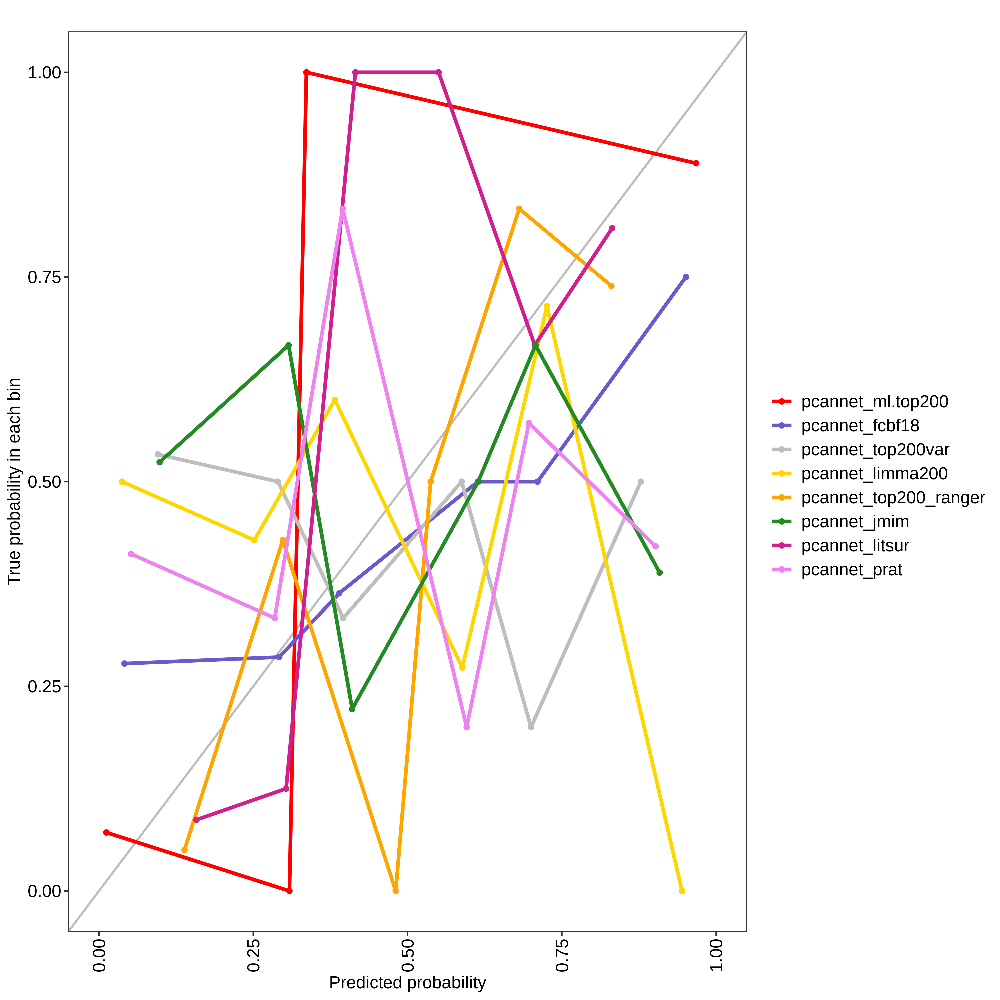

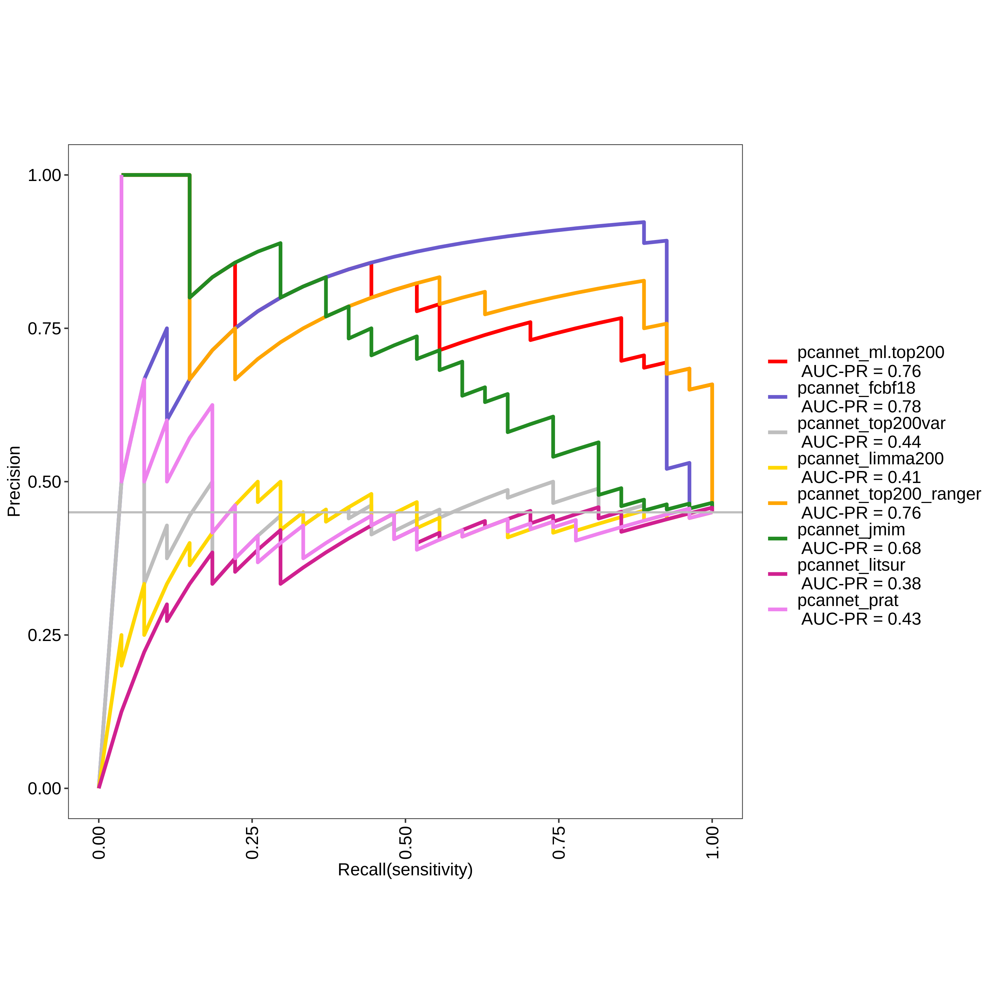

pcannet_ml.top200 Optimal Informedness = 0.63973063973064

pcannet_fcbf18 Optimal Informedness = 0.835016835016835

pcannet_top200var Optimal Informedness = 0.134680134680135

pcannet_limma200 Optimal Informedness = 0.0538720538720538

pcannet_top200_ranger Optimal Informedness = 0.737373737373737

pcannet_jmim Optimal Informedness = 0.38047138047138

pcannet_litsur Optimal Informedness = 0.0303030303030303

pcannet_prat Optimal Informedness = 0.0942760942760943

pcannet_ml.top200 AUC-ROC = 0.86

pcannet_fcbf18 AUC-ROC = 0.88

pcannet_top200var AUC-ROC = 0.51

pcannet_limma200 AUC-ROC = 0.46

pcannet_top200_ranger AUC-ROC = 0.88

pcannet_jmim AUC-ROC = 0.71

pcannet_litsur AUC-ROC = 0.43

pcannet_prat AUC-ROC = 0.45



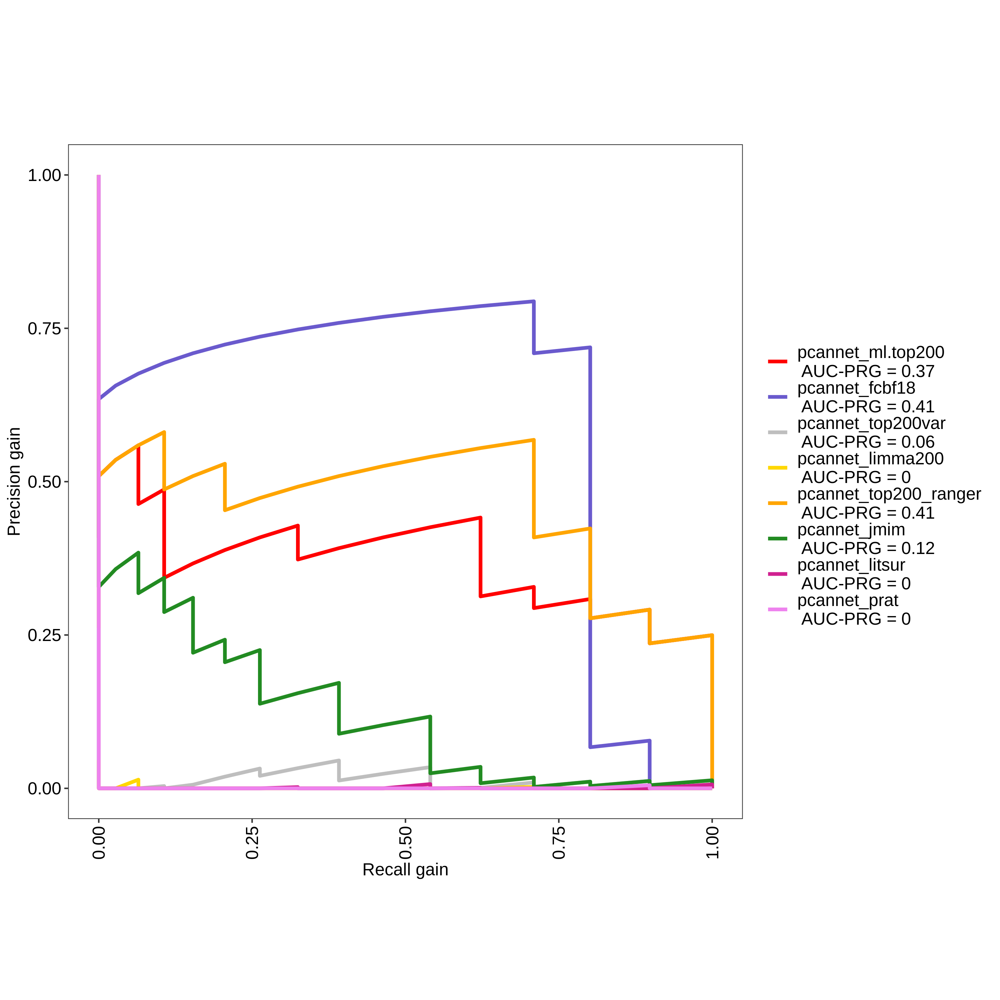

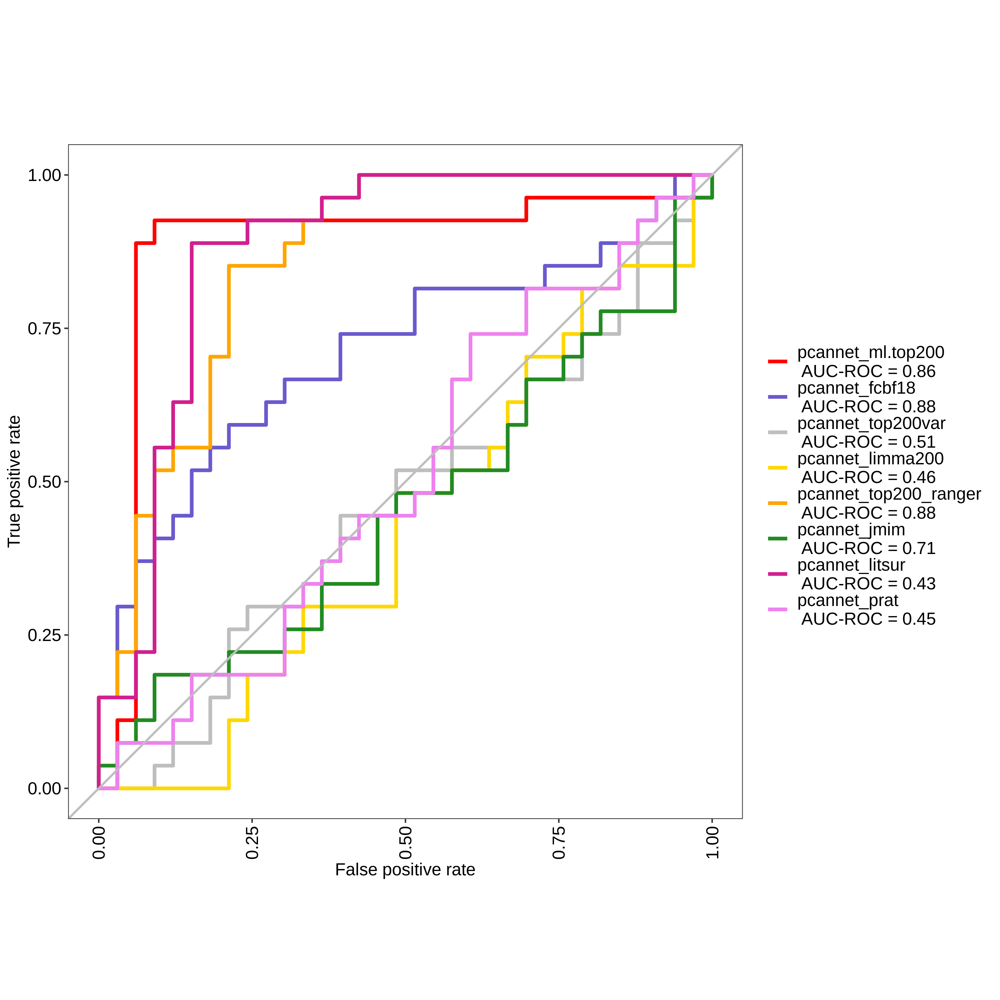

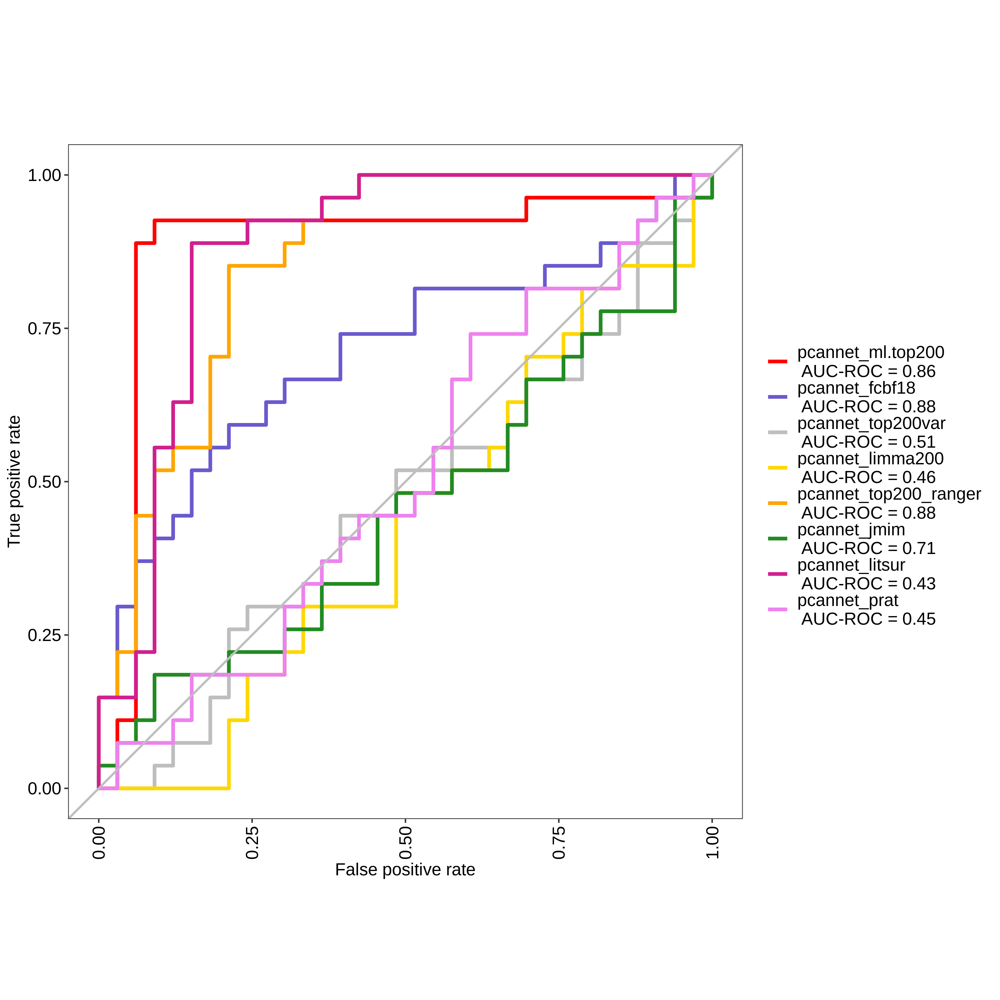

In [75]:
inp_top200_nnet <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf18_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf18.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma200_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma200.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_jmim_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))


res_nnet <- evalm(list(inp_top200_nnet, inp_fcbf18_nnet, inp_top200var_nnet, inp_limma200_nnet, inp_top200_ranger_nnet, inp_jmim_nnet, inp_litsur_nnet, inp_prat_nnet),
             gnames=c('pcannet_ml.top200', 'pcannet_fcbf18', 'pcannet_top200var', 'pcannet_limma200', 'pcannet_top200_ranger', 'pcannet_jmim', 'pcannet_litsur', 'pcannet_prat'))
res_nnet$roc

## Gradient Boosting Machines (GBM)

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.2902            -nan     0.1000    0.0191
     2        1.2127            -nan     0.1000    0.0131
     3        1.1639            -nan     0.1000    0.0019
     4        1.1185            -nan     0.1000    0.0018
     5        1.0611            -nan     0.1000    0.0181
     6        1.0246            -nan     0.1000   -0.0055
     7        0.9696            -nan     0.1000    0.0046
     8        0.9272            -nan     0.1000    0.0061
     9        0.8828            -nan     0.1000   -0.0005
    10        0.8618            -nan     0.1000   -0.0058
    20        0.6206            -nan     0.1000    0.0047
    40        0.3398            -nan     0.1000   -0.0056
    60        0.1775            -nan     0.1000   -0.0020
    80        0.0980            -nan     0.1000   -0.0012
   100        0.0544            -nan     0.1000   -0.0009
   120        0.0334            -nan     0.1000   -0.0001
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3280            -nan     0.1000    0.0130
     2        1.2880            -nan     0.1000    0.0075
     3        1.2535            -nan     0.1000    0.0011
     4        1.2247            -nan     0.1000    0.0036
     5        1.1939            -nan     0.1000   -0.0071
     6        1.1639            -nan     0.1000    0.0005
     7        1.1216            -nan     0.1000    0.0132
     8        1.0817            -nan     0.1000    0.0095
     9        1.0602            -nan     0.1000    0.0042
    10        1.0452            -nan     0.1000    0.0027
    20        0.8437            -nan     0.1000   -0.0010
    40        0.5907            -nan     0.1000   -0.0045
    60        0.4638            -nan     0.1000   -0.0047
    80        0.3808            -nan     0.1000   -0.0028
   100        0.3250            -nan     0.1000    0.0005
   120        0.2810            -nan     0.1000   -0.0053
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3461            -nan     0.1000   -0.0144
     2        1.3005            -nan     0.1000    0.0166
     3        1.2707            -nan     0.1000   -0.0016
     4        1.2518            -nan     0.1000   -0.0175
     5        1.2211            -nan     0.1000   -0.0009
     6        1.2035            -nan     0.1000   -0.0133
     7        1.1779            -nan     0.1000   -0.0023
     8        1.1401            -nan     0.1000    0.0046
     9        1.1168            -nan     0.1000   -0.0016
    10        1.0890            -nan     0.1000   -0.0020
    20        0.8939            -nan     0.1000   -0.0146
    40        0.6087            -nan     0.1000   -0.0004
    60        0.4461            -nan     0.1000   -0.0073
    80        0.3298            -nan     0.1000   -0.0013
   100        0.2491            -nan     0.1000   -0.0045
   120        0.1949            -nan     0.1000   -0.0020
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3618            -nan     0.1000   -0.0165
     2        1.3429            -nan     0.1000   -0.0074
     3        1.3219            -nan     0.1000   -0.0156
     4        1.2879            -nan     0.1000   -0.0042
     5        1.2753            -nan     0.1000   -0.0200
     6        1.2364            -nan     0.1000   -0.0141
     7        1.1862            -nan     0.1000    0.0091
     8        1.1673            -nan     0.1000   -0.0096
     9        1.1348            -nan     0.1000    0.0039
    10        1.1200            -nan     0.1000   -0.0135
    20        0.9369            -nan     0.1000   -0.0093
    40        0.6871            -nan     0.1000   -0.0085
    60        0.5002            -nan     0.1000   -0.0043
    80        0.3657            -nan     0.1000   -0.0062
   100        0.2689            -nan     0.1000   -0.0012
   120        0.2066            -nan     0.1000    0.0000
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3485            -nan     0.1000   -0.0197
     2        1.2780            -nan     0.1000    0.0189
     3        1.2355            -nan     0.1000   -0.0121
     4        1.1916            -nan     0.1000    0.0024
     5        1.1375            -nan     0.1000    0.0163
     6        1.0728            -nan     0.1000    0.0082
     7        1.0444            -nan     0.1000   -0.0092
     8        1.0019            -nan     0.1000    0.0149
     9        0.9569            -nan     0.1000    0.0105
    10        0.9196            -nan     0.1000   -0.0006
    20        0.6533            -nan     0.1000    0.0049
    40        0.3494            -nan     0.1000    0.0025
    60        0.1955            -nan     0.1000   -0.0000
    80        0.1199            -nan     0.1000   -0.0018
   100        0.0751            -nan     0.1000   -0.0005
   120        0.0433            -nan     0.1000    0.0001
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3075            -nan     0.1000    0.0247
     2        1.2410            -nan     0.1000    0.0248
     3        1.1829            -nan     0.1000    0.0190
     4        1.1361            -nan     0.1000    0.0129
     5        1.0866            -nan     0.1000    0.0081
     6        1.0561            -nan     0.1000   -0.0083
     7        1.0139            -nan     0.1000    0.0142
     8        0.9794            -nan     0.1000    0.0020
     9        0.9587            -nan     0.1000   -0.0058
    10        0.9075            -nan     0.1000    0.0165
    20        0.6541            -nan     0.1000   -0.0018
    40        0.4013            -nan     0.1000    0.0017
    60        0.2630            -nan     0.1000   -0.0032
    80        0.1798            -nan     0.1000   -0.0017
   100        0.1110            -nan     0.1000   -0.0018
   120        0.0683            -nan     0.1000   -0.0003
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3603            -nan     0.1000   -0.0001
     2        1.3542            -nan     0.1000   -0.0160
     3        1.3429            -nan     0.1000   -0.0182
     4        1.3382            -nan     0.1000   -0.0103
     5        1.3314            -nan     0.1000   -0.0247
     6        1.3183            -nan     0.1000   -0.0021
     7        1.3001            -nan     0.1000   -0.0035
     8        1.2789            -nan     0.1000   -0.0099
     9        1.2716            -nan     0.1000   -0.0096
    10        1.2568            -nan     0.1000   -0.0092
    20        1.1235            -nan     0.1000   -0.0076
    40        0.9608            -nan     0.1000   -0.0114
    60        0.8118            -nan     0.1000    0.0010
    80        0.6855            -nan     0.1000   -0.0034
   100        0.6071            -nan     0.1000   -0.0009
   120        0.5273            -nan     0.1000   -0.0040
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3142            -nan     0.1000    0.0021
     2        1.2902            -nan     0.1000   -0.0217
     3        1.2412            -nan     0.1000    0.0045
     4        1.2126            -nan     0.1000   -0.0053
     5        1.1830            -nan     0.1000   -0.0107
     6        1.1601            -nan     0.1000   -0.0110
     7        1.1277            -nan     0.1000   -0.0118
     8        1.0873            -nan     0.1000    0.0142
     9        1.0614            -nan     0.1000    0.0032
    10        1.0351            -nan     0.1000   -0.0188
    20        0.8564            -nan     0.1000   -0.0052
    40        0.5700            -nan     0.1000    0.0010
    60        0.4032            -nan     0.1000   -0.0036
    80        0.2882            -nan     0.1000    0.0000
   100        0.2111            -nan     0.1000   -0.0040
   120        0.1482            -nan     0.1000   -0.0030
   140        

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 480

Number of groups: 8

Observations per group: 60

Positive: Y

Negative: N

Group: gbm_ml.top200

Positive: 27

Negative: 33

Group: gbm_fcbf18

Positive: 27

Negative: 33

Group: gbm_top200var

Positive: 27

Negative: 33

Group: gbm_limma200

Positive: 27

Negative: 33

Group: gbm_top200_ranger

Positive: 27

Negative: 33

Group: gbm_jmim

Positive: 27

Negative: 33

Group: gbm_litsur

Positive: 27

Negative: 33

Group: gbm_prat

Positive: 27

Negative: 33

***Performance Metrics***



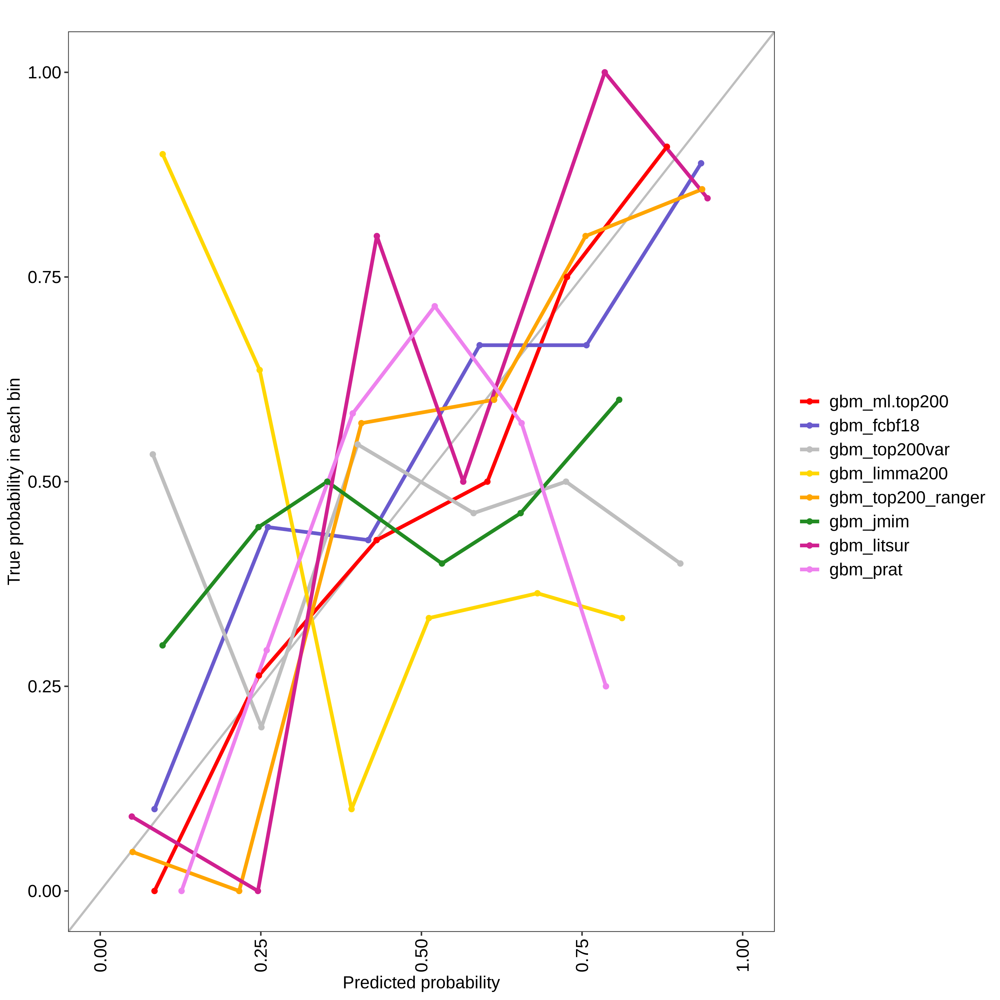

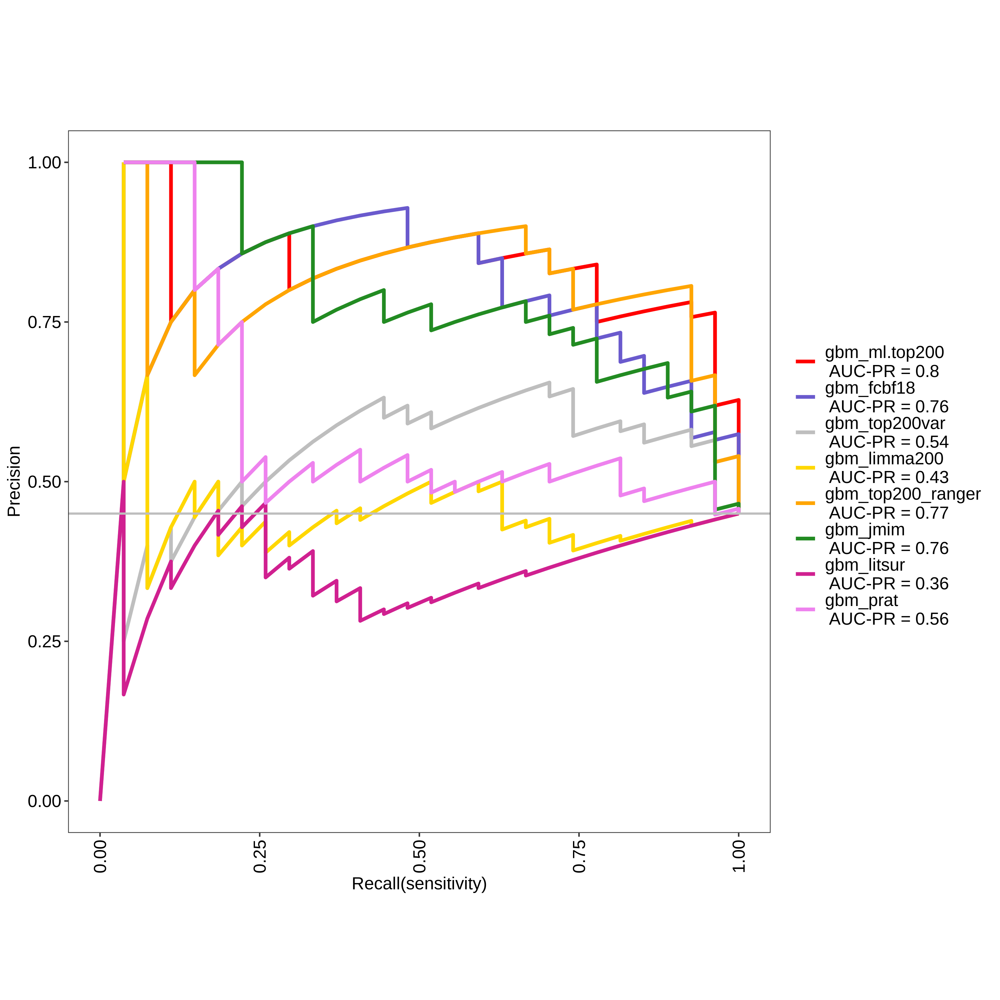

gbm_ml.top200 Optimal Informedness = 0.720538720538721

gbm_fcbf18 Optimal Informedness = 0.595959595959596

gbm_top200var Optimal Informedness = 0.407407407407407

gbm_limma200 Optimal Informedness = 0.114478114478115

gbm_top200_ranger Optimal Informedness = 0.744107744107744

gbm_jmim Optimal Informedness = 0.555555555555555

gbm_litsur Optimal Informedness = 0.0168350168350169

gbm_prat Optimal Informedness = 0.239057239057239

gbm_ml.top200 AUC-ROC = 0.9

gbm_fcbf18 AUC-ROC = 0.86

gbm_top200var AUC-ROC = 0.7

gbm_limma200 AUC-ROC = 0.47

gbm_top200_ranger AUC-ROC = 0.88

gbm_jmim AUC-ROC = 0.83

gbm_litsur AUC-ROC = 0.31

gbm_prat AUC-ROC = 0.61



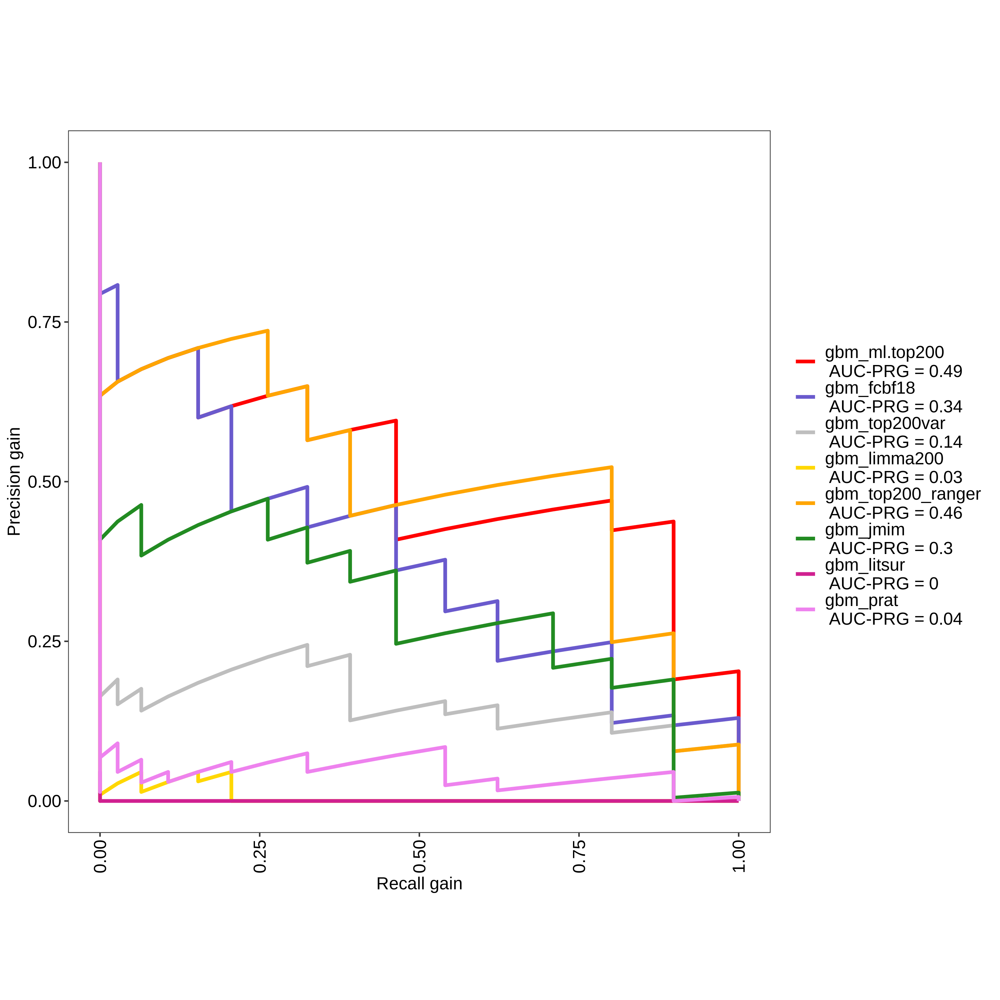

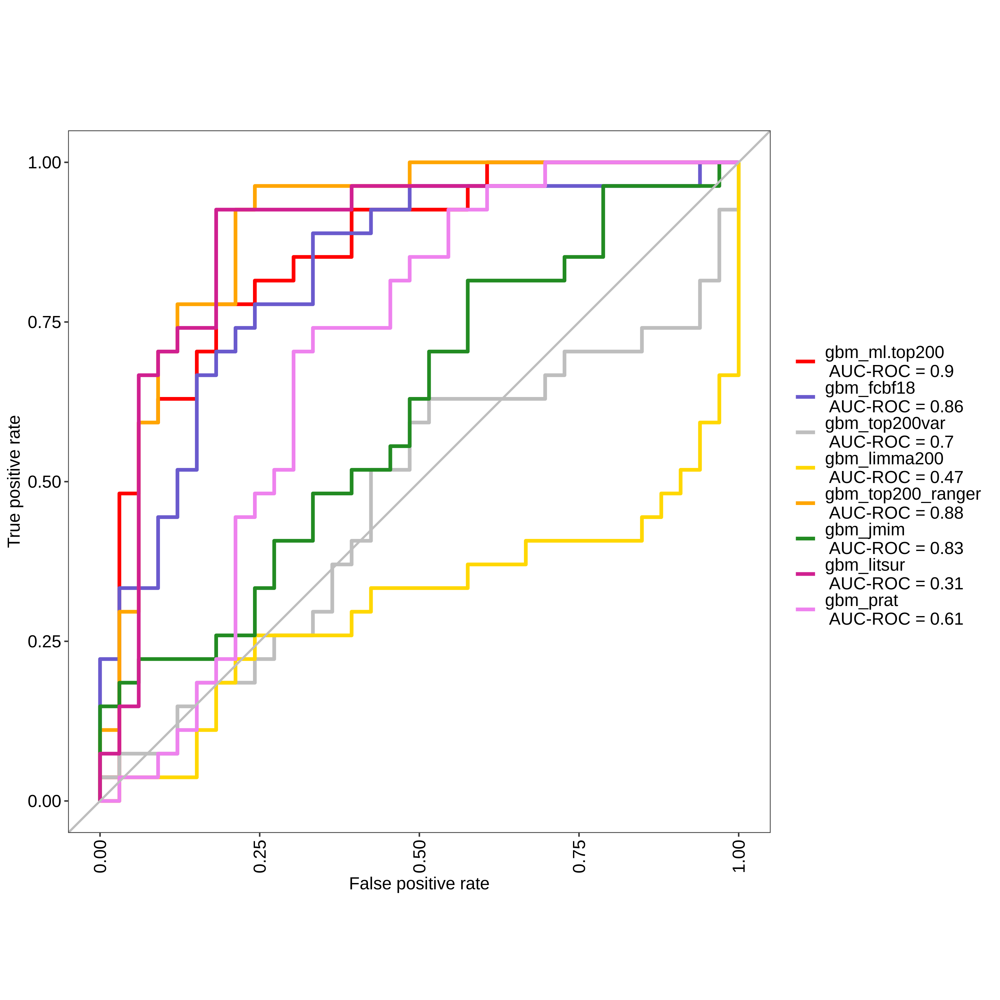

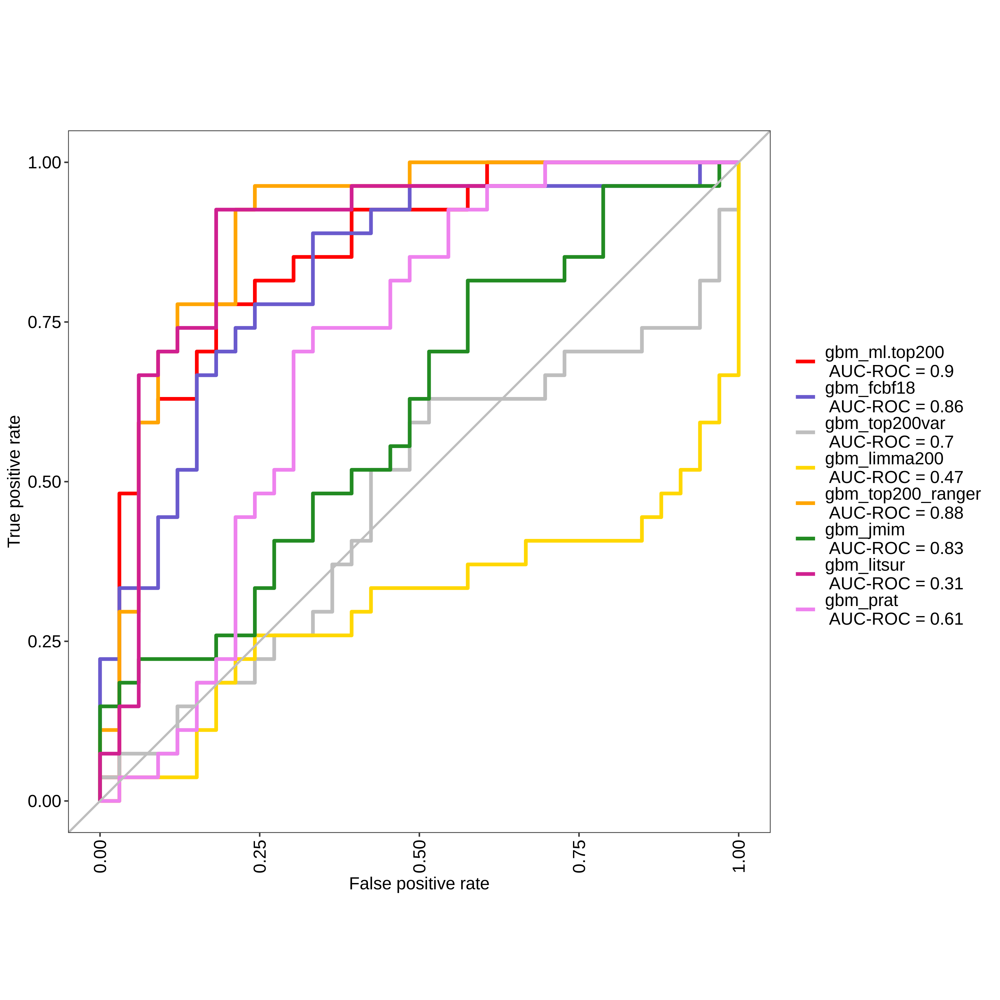

In [76]:
inp_top200_gbm <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf18_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf18.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma200_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma200.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_gbm <- evalm(list(inp_top200_gbm, inp_fcbf18_gbm, inp_top200var_gbm, inp_limma200_gbm, inp_top200_ranger_gbm, inp_jmim_gbm, inp_litsur_gbm, inp_prat_gbm),
             gnames=c('gbm_ml.top200', 'gbm_fcbf18', 'gbm_top200var', 'gbm_limma200', 'gbm_top200_ranger', 'gbm_jmim', 'gbm_litsur', 'gbm_prat'))
res_gbm$roc

## Partial Least Squares

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 480

Number of groups: 8

Observations per group: 60

Positive: Y

Negative: N

Group: pls_ml.top200

Positive: 27

Negative: 33

Group: pls_fcbf18

Positive: 27

Negative: 33

Group: pls_top200var

Positive: 27

Negative: 33

Group: pls_limma200

Positive: 27

Negative: 33

Group: pls_top200_ranger

Positive: 27

Negative: 33

Group: pls_jmim

Positive: 27

Negative: 33

Group: pls_litsur

Positive: 27

Negative: 33

Group: pls_prat

Positive: 27

Negative: 33

***Performance Metrics***



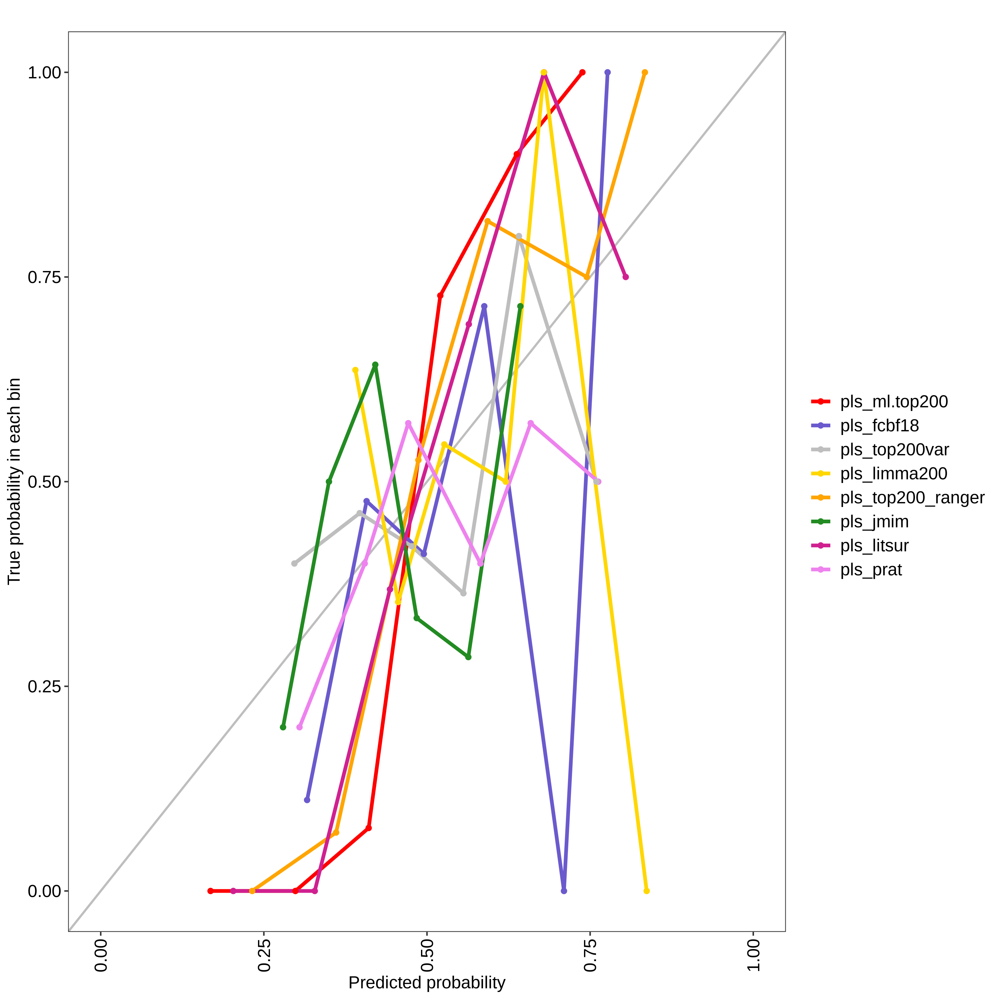

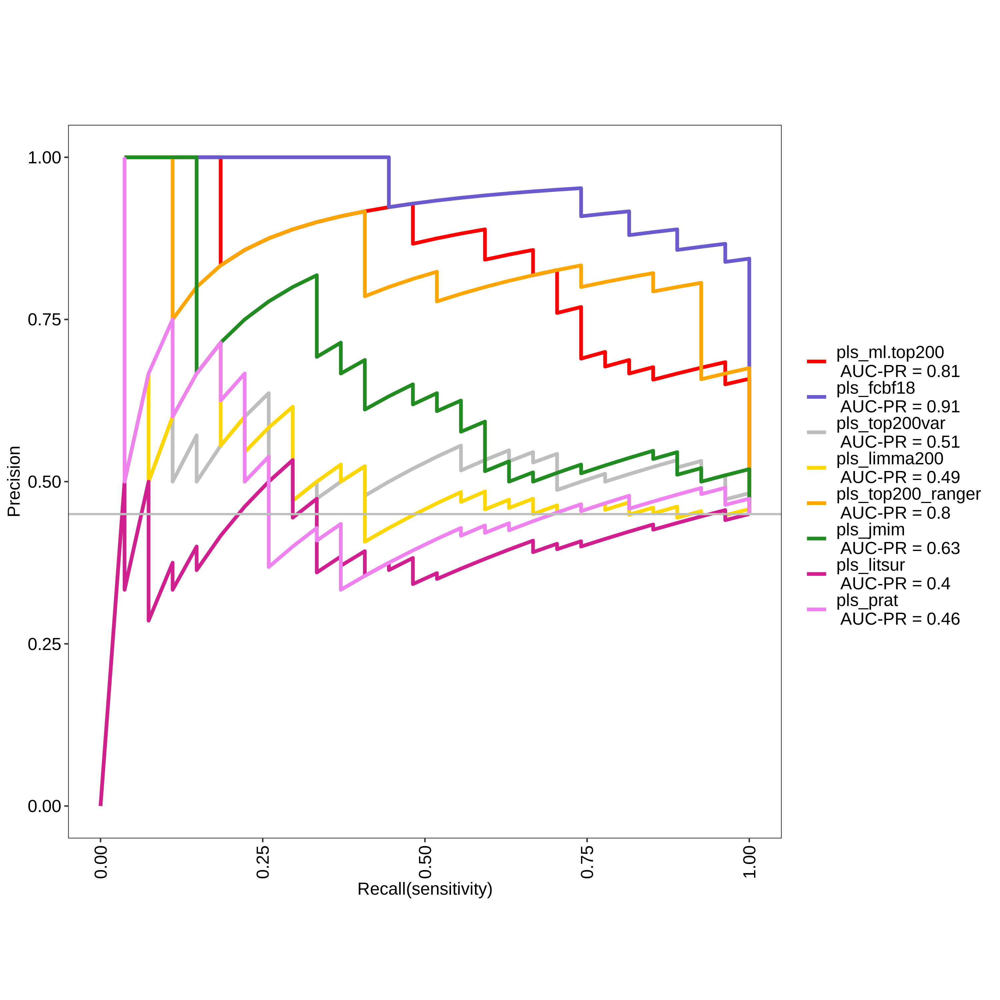

pls_ml.top200 Optimal Informedness = 0.599326599326599

pls_fcbf18 Optimal Informedness = 0.848484848484849

pls_top200var Optimal Informedness = 0.259259259259259

pls_limma200 Optimal Informedness = 0.144781144781145

pls_top200_ranger Optimal Informedness = 0.744107744107744

pls_jmim Optimal Informedness = 0.282828282828283

pls_litsur Optimal Informedness = 0.0841750841750841

pls_prat Optimal Informedness = 0.144781144781145

pls_ml.top200 AUC-ROC = 0.88

pls_fcbf18 AUC-ROC = 0.97

pls_top200var AUC-ROC = 0.62

pls_limma200 AUC-ROC = 0.54

pls_top200_ranger AUC-ROC = 0.89

pls_jmim AUC-ROC = 0.69

pls_litsur AUC-ROC = 0.41

pls_prat AUC-ROC = 0.5



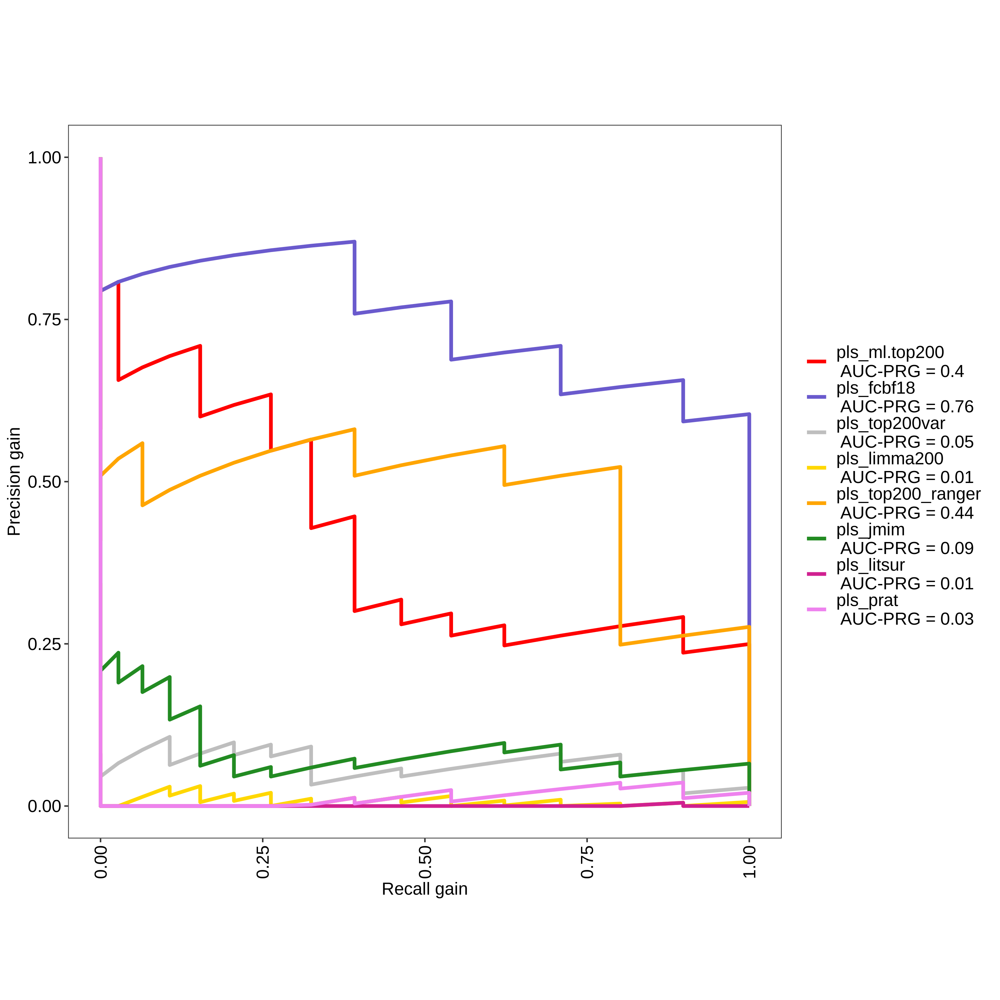

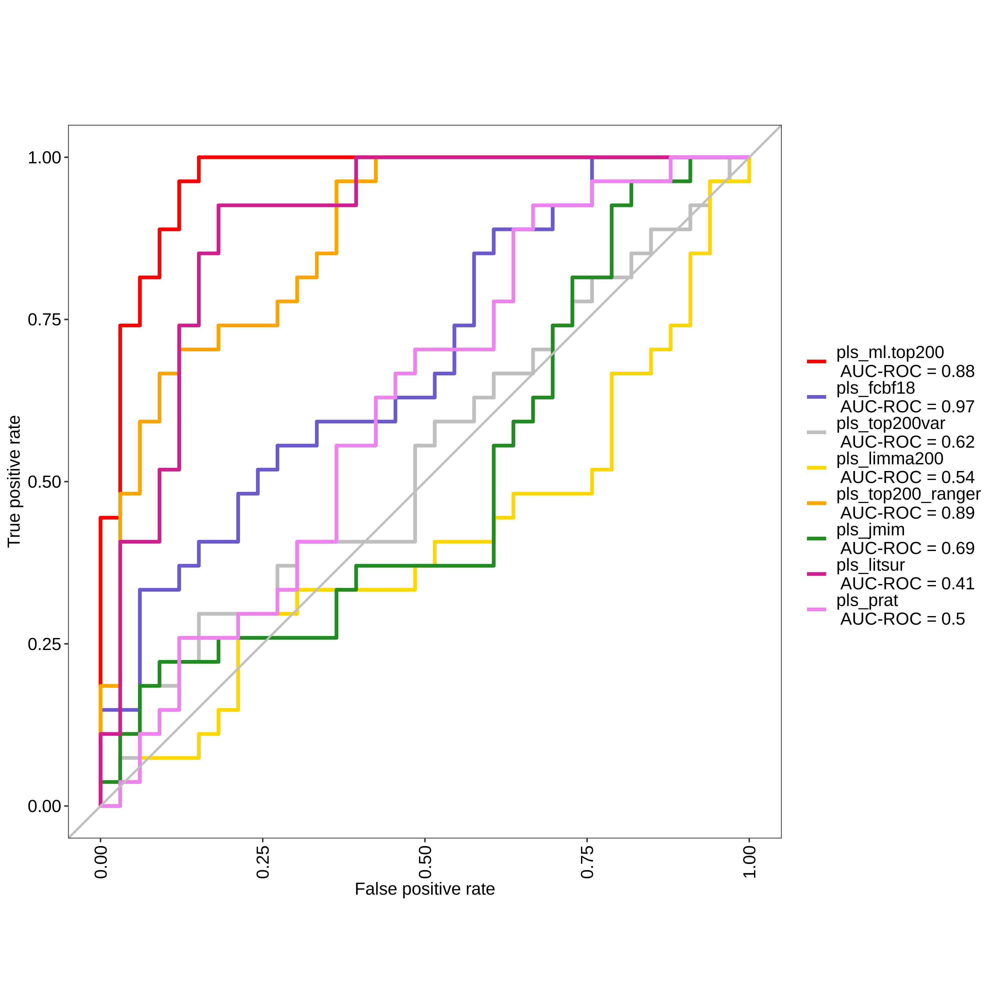

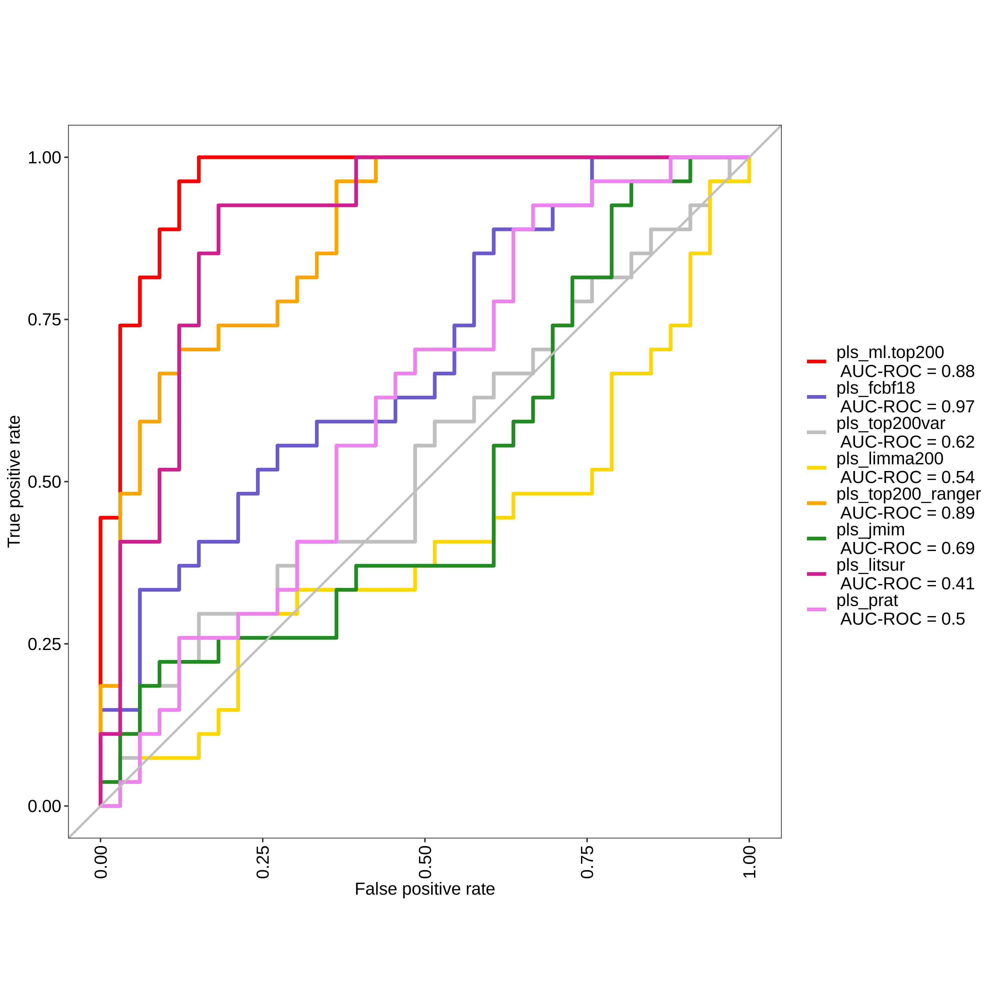

In [77]:
inp_top200_pls <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf18_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf18.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma200_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma200.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_litsur_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_pls <- evalm(list(inp_top200_pls, inp_fcbf18_pls, inp_top200var_pls, inp_limma200_pls, inp_top200_ranger_pls, inp_jmim_pls, inp_litsur_pls, inp_prat_pls),
             gnames=c('pls_ml.top200', 'pls_fcbf18', 'pls_top200var', 'pls_limma200', 'pls_top200_ranger', 'pls_jmim', 'pls_litsur', 'pls_prat'))
res_pls$roc

## Cforest

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 480

Number of groups: 8

Observations per group: 60

Positive: Y

Negative: N

Group: crf_ml.top200

Positive: 27

Negative: 33

Group: crf_fcbf18

Positive: 27

Negative: 33

Group: crf_top200var

Positive: 27

Negative: 33

Group: crf_limma200

Positive: 27

Negative: 33

Group: crf_top200_ranger

Positive: 27

Negative: 33

Group: crf_jmim

Positive: 27

Negative: 33

Group: crf_litsur

Positive: 27

Negative: 33

Group: crf_prat

Positive: 27

Negative: 33

***Performance Metrics***



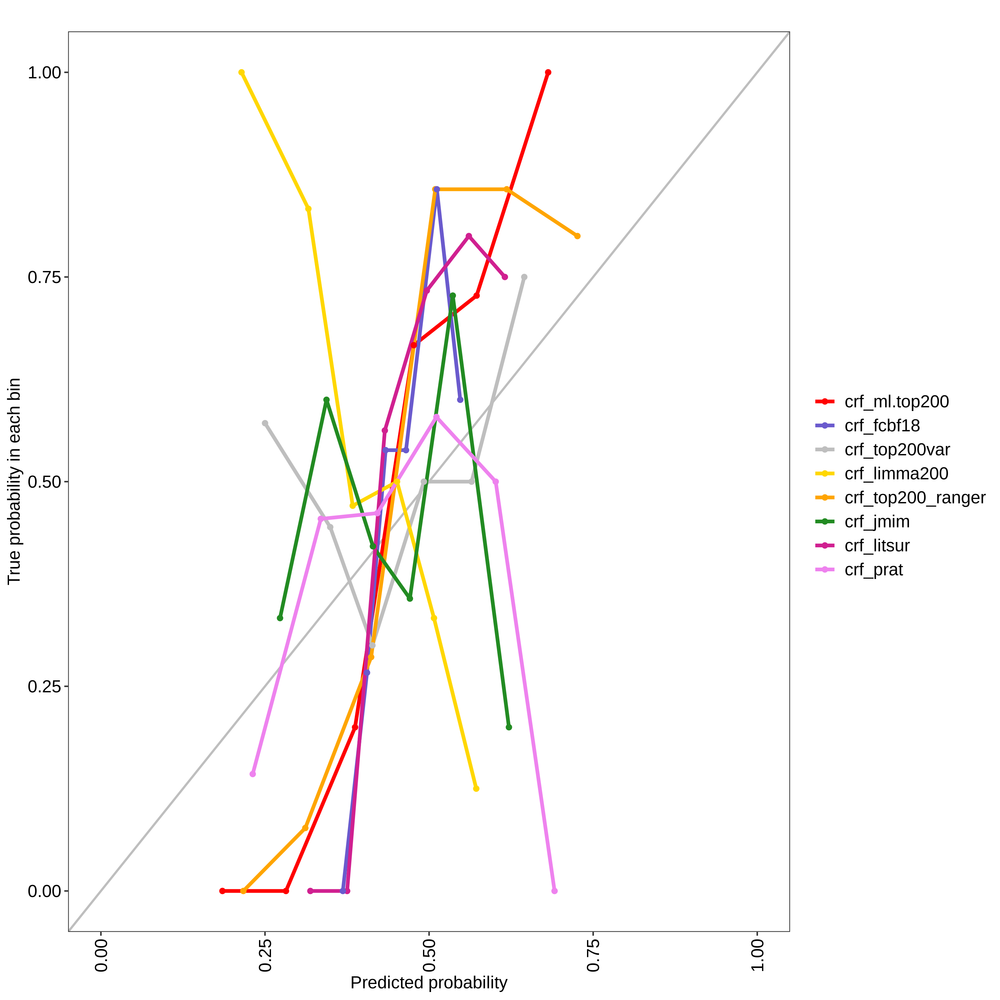

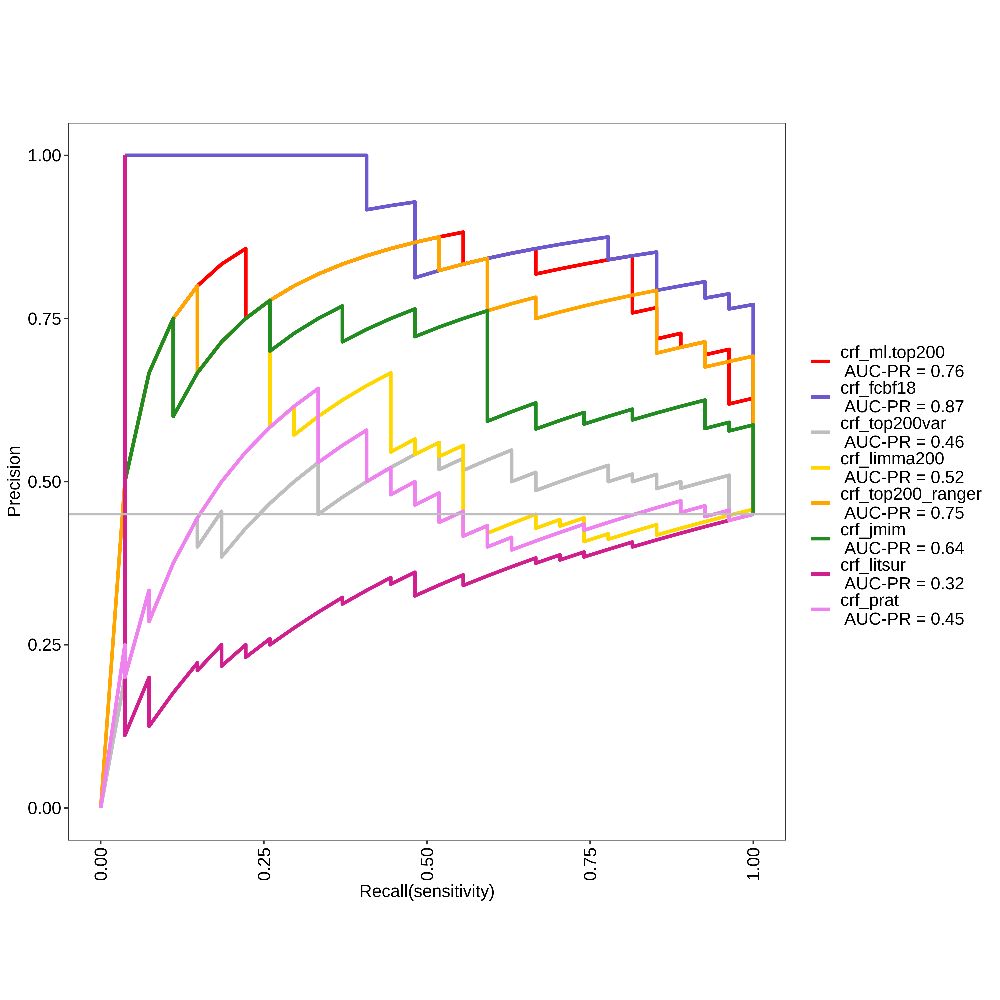

crf_ml.top200 Optimal Informedness = 0.693602693602694

crf_fcbf18 Optimal Informedness = 0.757575757575758

crf_top200var Optimal Informedness = 0.205387205387205

crf_limma200 Optimal Informedness = 0.262626262626263

crf_top200_ranger Optimal Informedness = 0.67003367003367

crf_jmim Optimal Informedness = 0.471380471380471

crf_litsur Optimal Informedness = 0.037037037037037

crf_prat Optimal Informedness = 0.181818181818182

crf_ml.top200 AUC-ROC = 0.89

crf_fcbf18 AUC-ROC = 0.93

crf_top200var AUC-ROC = 0.58

crf_limma200 AUC-ROC = 0.55

crf_top200_ranger AUC-ROC = 0.87

crf_jmim AUC-ROC = 0.77

crf_litsur AUC-ROC = 0.27

crf_prat AUC-ROC = 0.51



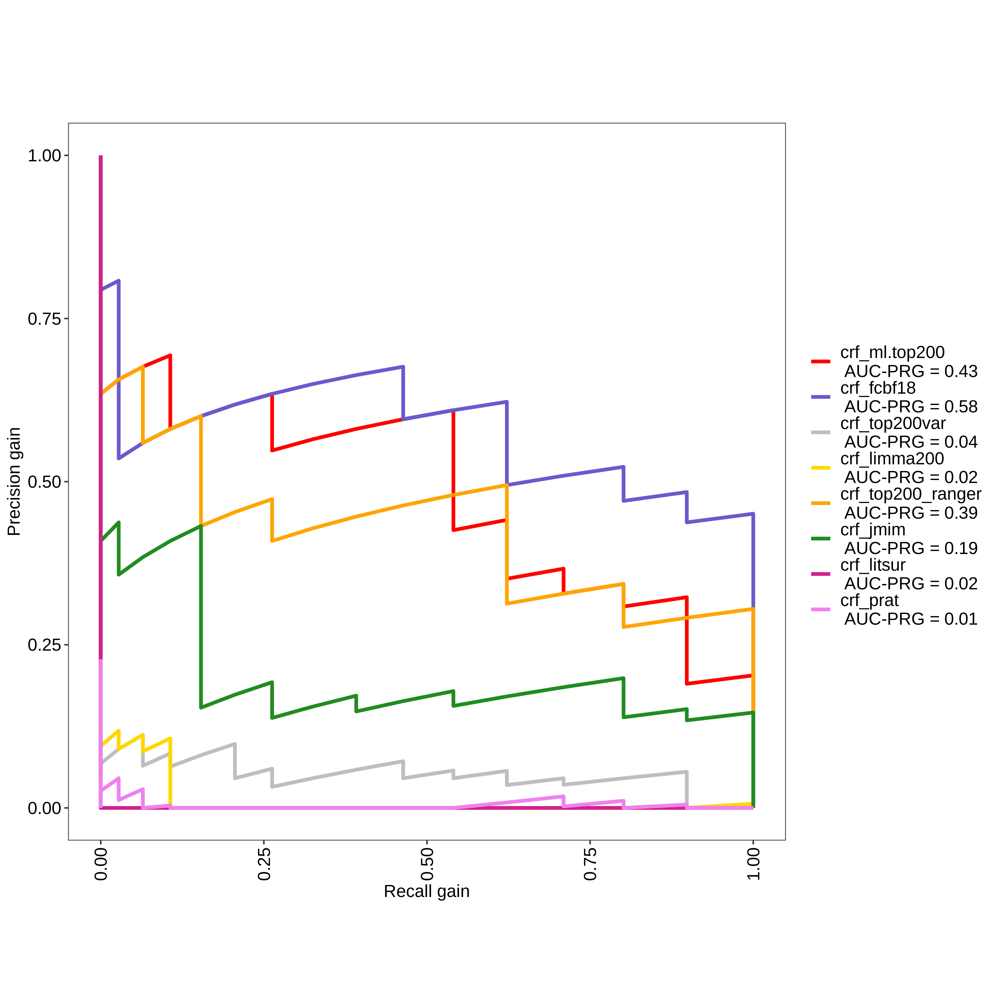

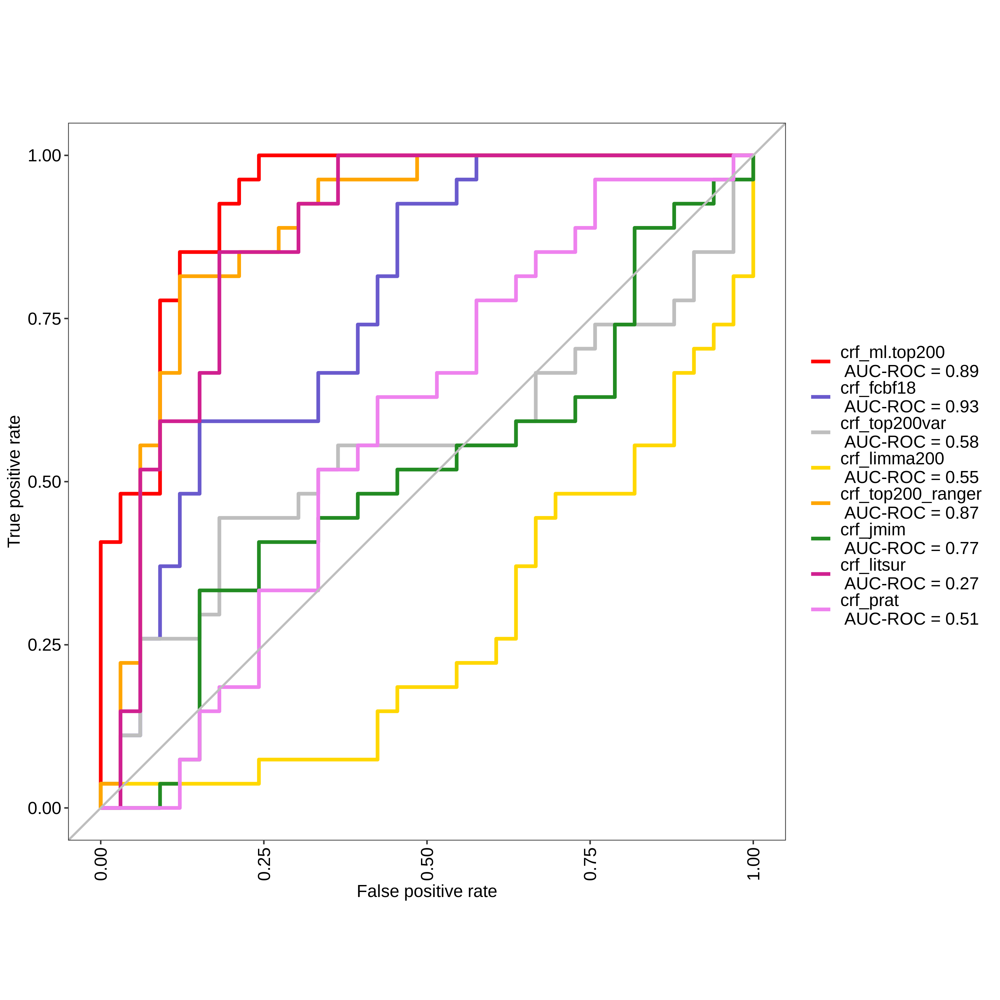

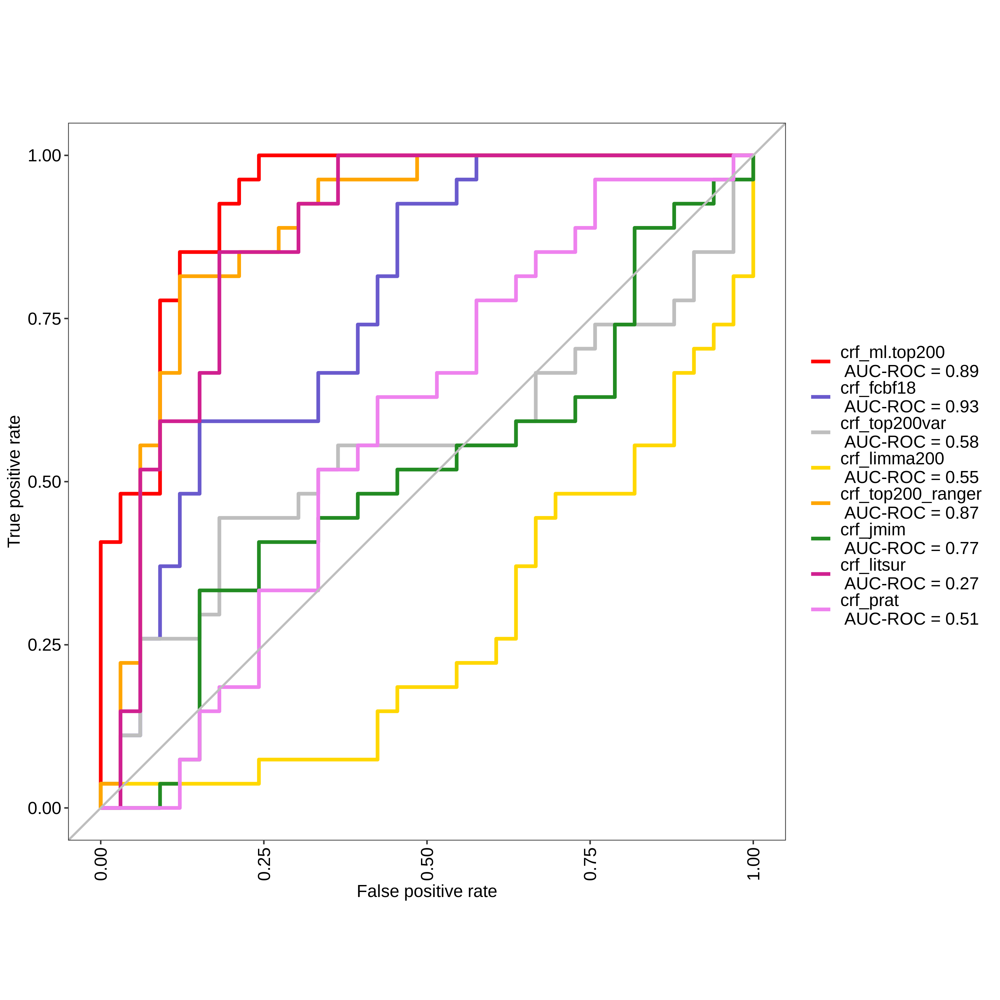

In [78]:
inp_top200_crf <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf18_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf18.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma200_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma200.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_litsur_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_crf <- evalm(list(inp_top200_crf, inp_fcbf18_crf, inp_top200var_crf, inp_limma200_crf, inp_top200_ranger_crf, inp_jmim_crf, inp_litsur_crf, inp_prat_crf),
             gnames=c('crf_ml.top200', 'crf_fcbf18', 'crf_top200var', 'crf_limma200', 'crf_top200_ranger', 'crf_jmim', 'crf_litsur', 'crf_prat'))
res_crf$roc

## High Dimensional Discriminant Analysis

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 480

Number of groups: 8

Observations per group: 60

Positive: Y

Negative: N

Group: hdda_ml.top200

Positive: 27

Negative: 33

Group: hdda_fcbf18

Positive: 27

Negative: 33

Group: hdda_litsurvey

Positive: 27

Negative: 33

Group: hdda_limma200

Positive: 27

Negative: 33

Group: hdda_top200_ranger

Positive: 27

Negative: 33

Group: hdda_jmim

Positive: 27

Negative: 33

Group: hdda_litsur

Positive: 27

Negative: 33

Group: hdda_prat

Positive: 27

Negative: 33

***Performance Metrics***



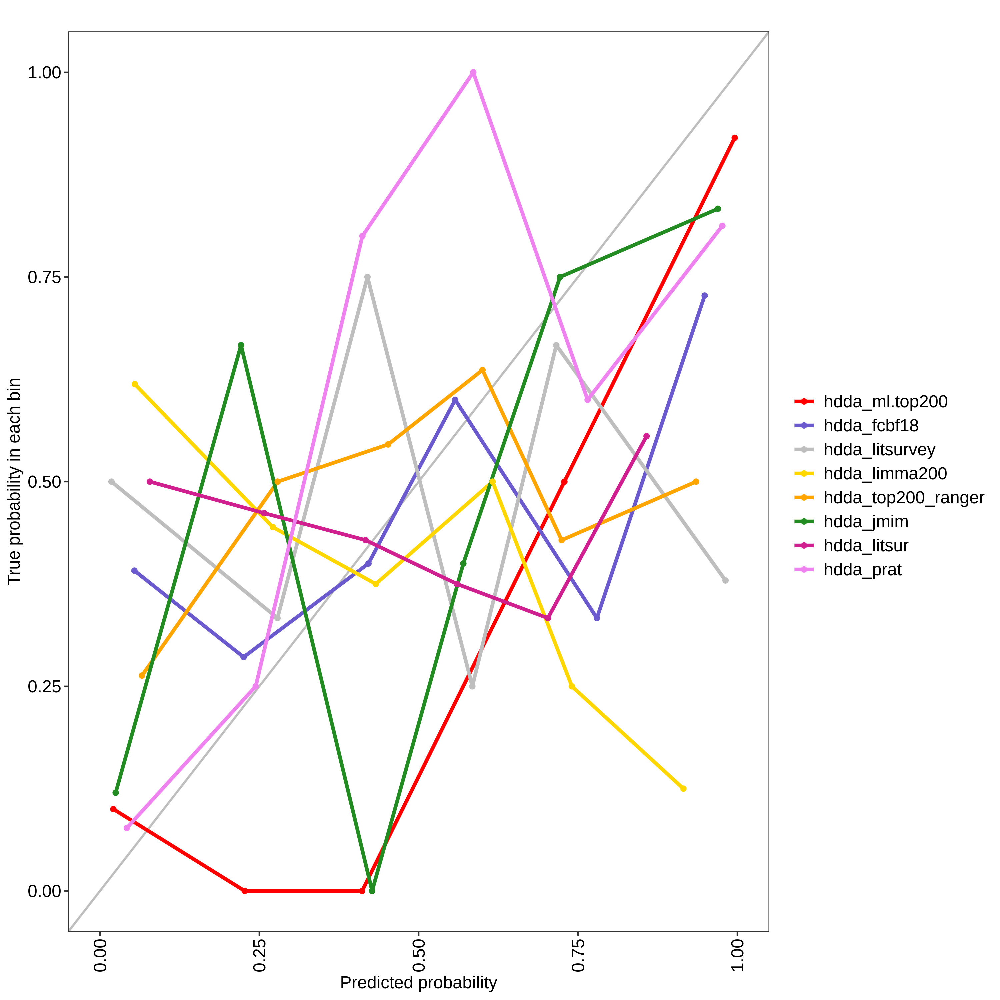

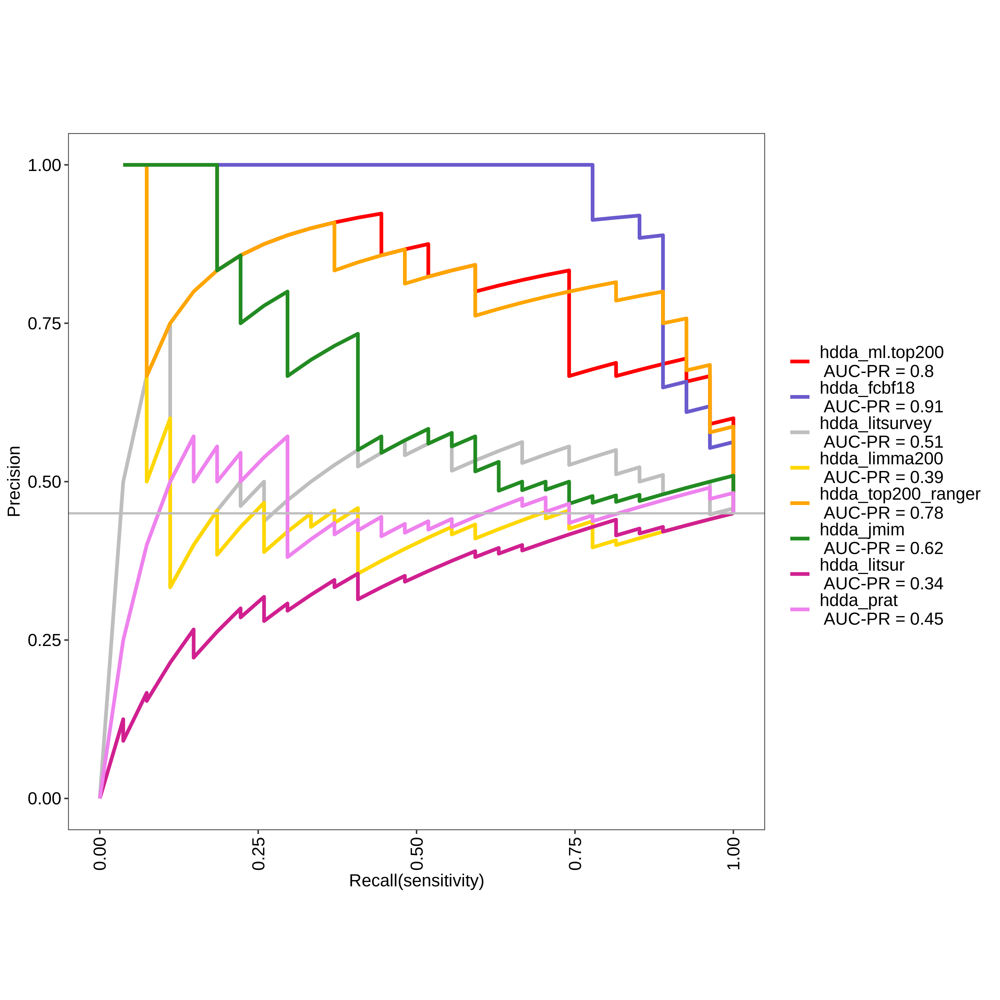

hdda_ml.top200 Optimal Informedness = 0.619528619528619

hdda_fcbf18 Optimal Informedness = 0.797979797979798

hdda_litsurvey Optimal Informedness = 0.269360269360269

hdda_limma200 Optimal Informedness = 0.0505050505050506

hdda_top200_ranger Optimal Informedness = 0.707070707070707

hdda_jmim Optimal Informedness = 0.286195286195286

hdda_litsur Optimal Informedness = 0

hdda_prat Optimal Informedness = 0.144781144781145

hdda_ml.top200 AUC-ROC = 0.87

hdda_fcbf18 AUC-ROC = 0.94

hdda_litsurvey AUC-ROC = 0.61

hdda_limma200 AUC-ROC = 0.44

hdda_top200_ranger AUC-ROC = 0.88

hdda_jmim AUC-ROC = 0.64

hdda_litsur AUC-ROC = 0.32

hdda_prat AUC-ROC = 0.51



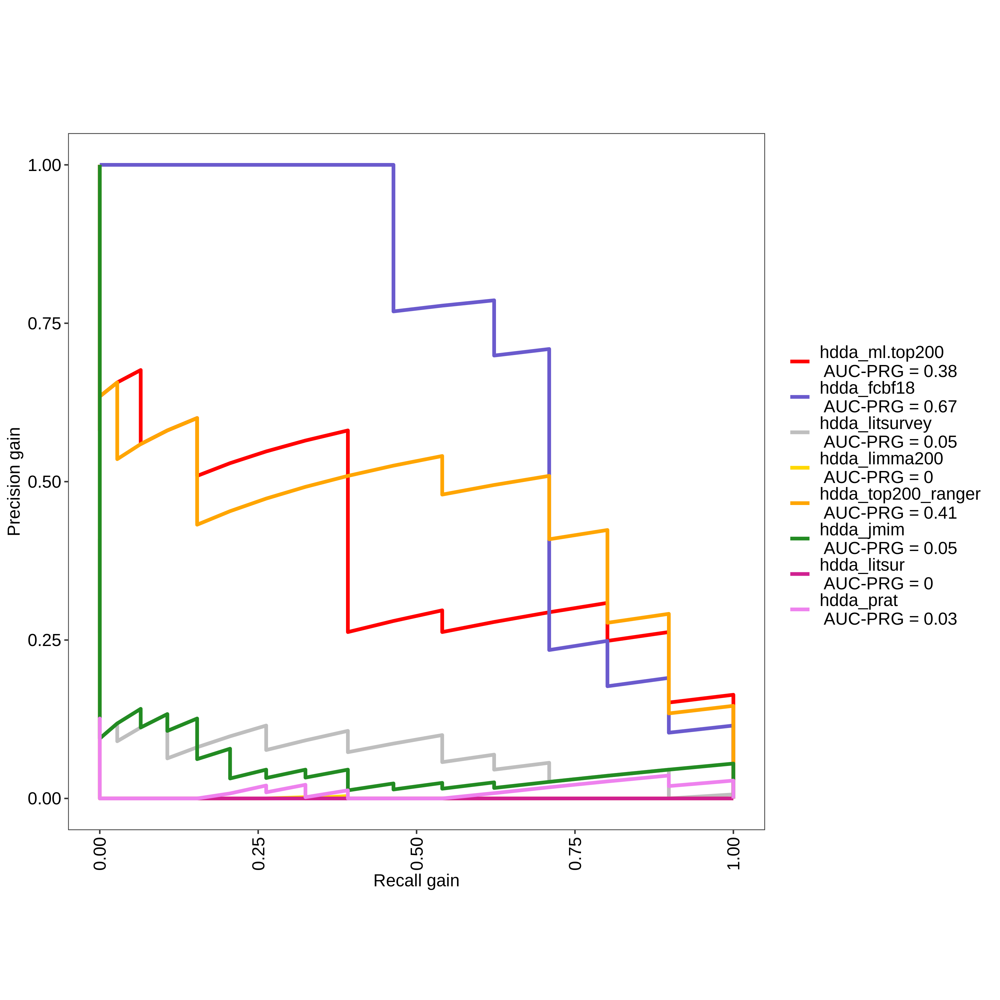

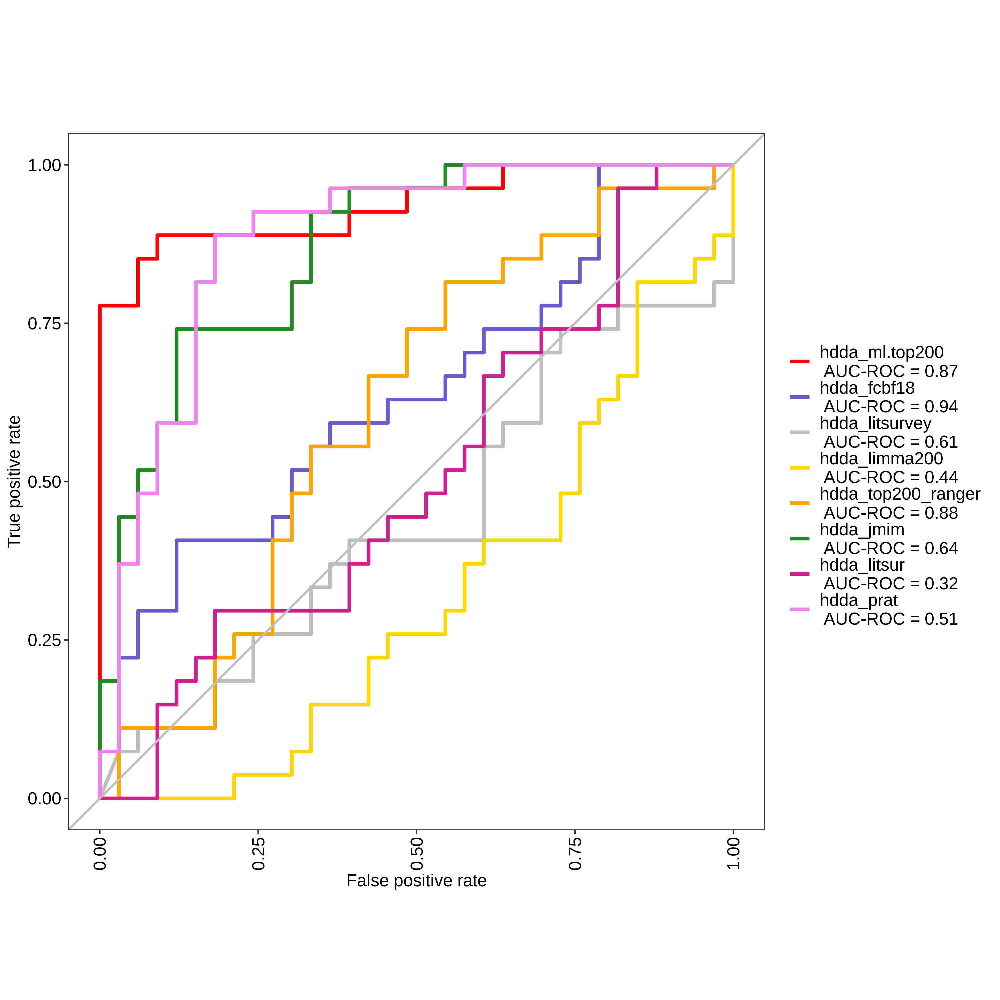

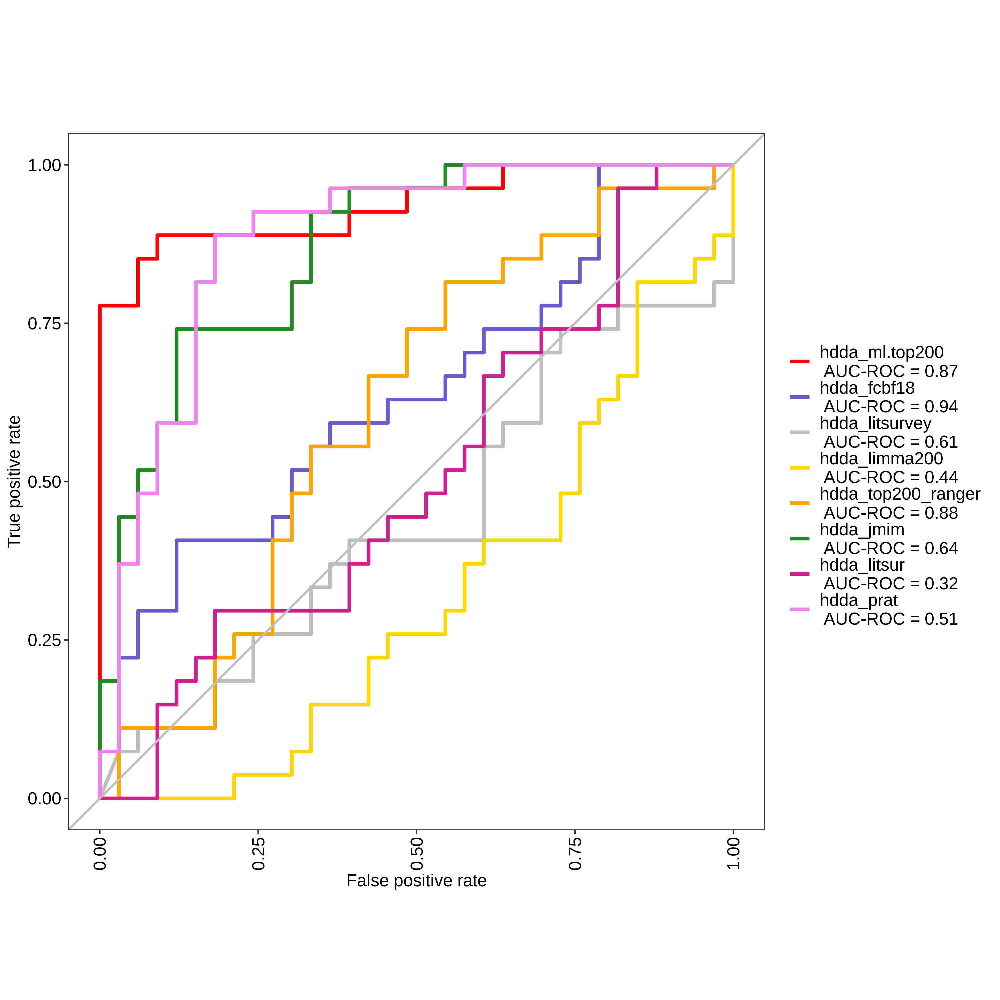

In [79]:
inp_top200_hdda <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf18_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf18.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma200_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma200.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_hdda <- evalm(list(inp_top200_hdda, inp_fcbf18_hdda, inp_top200var_hdda, inp_limma200_hdda, inp_top200_ranger_hdda, inp_jmim_hdda, inp_litsur_hdda, inp_prat_hdda),
             gnames=c('hdda_ml.top200', 'hdda_fcbf18', 'hdda_litsurvey', 'hdda_limma200', 'hdda_top200_ranger', 'hdda_jmim', 'hdda_litsur', 'hdda_prat'))
res_hdda$roc

## Naïve Bayes

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 480

Number of groups: 8

Observations per group: 60

Positive: Y

Negative: N

Group: nb_ml.top200

Positive: 27

Negative: 33

Group: nb_fcbf18

Positive: 27

Negative: 33

Group: nb_litsurvey

Positive: 27

Negative: 33

Group: nb_limma200

Positive: 27

Negative: 33

Group: nb_top200_ranger

Positive: 27

Negative: 33

Group: nb_jmim

Positive: 27

Negative: 33

Group: nb_litsur

Positive: 27

Negative: 33

Group: nb_prat

Positive: 27

Negative: 33

***Performance Metrics***



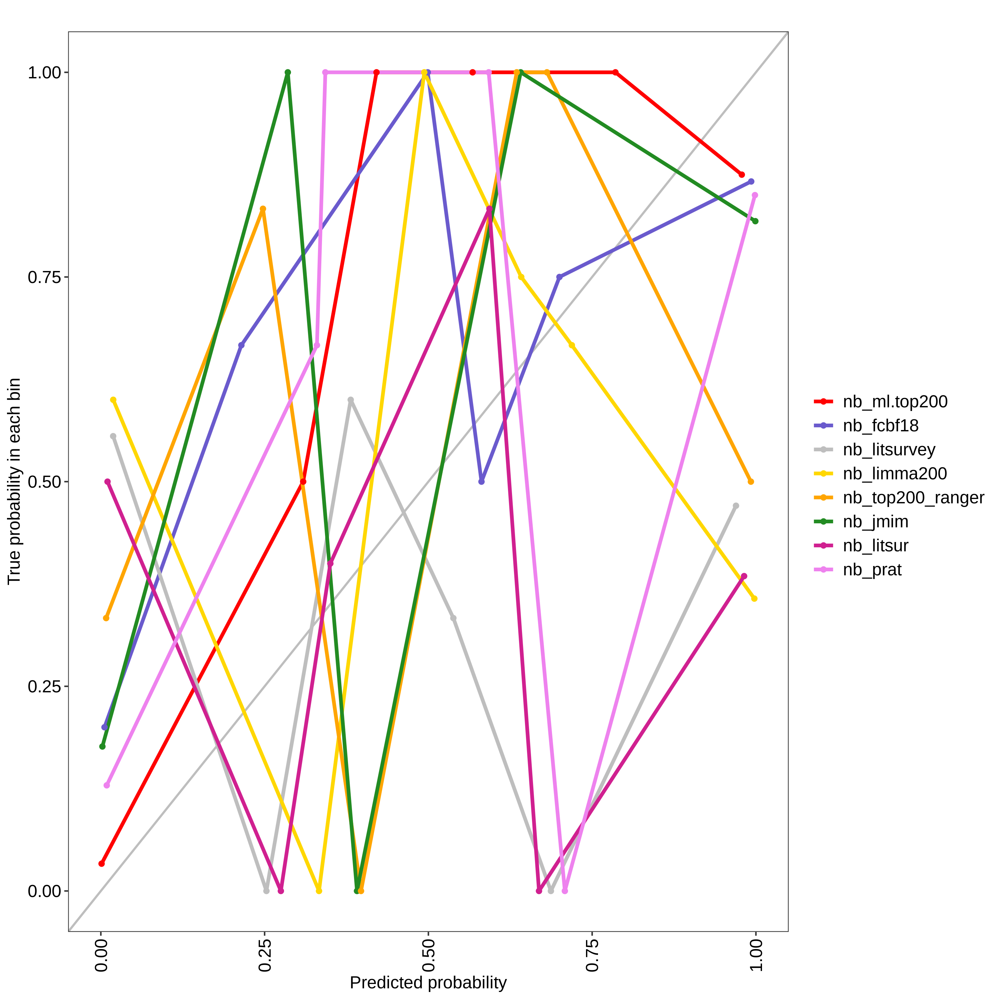

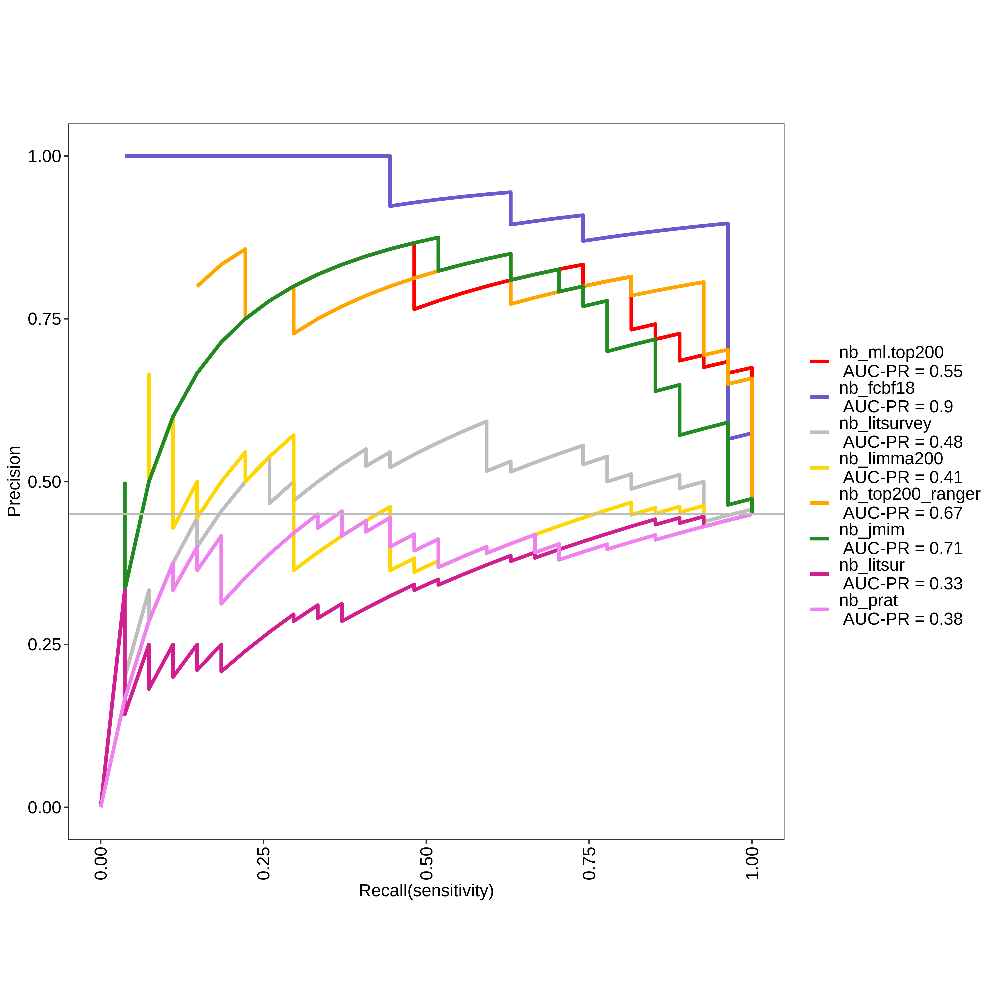

nb_ml.top200 Optimal Informedness = 0.663299663299663

nb_fcbf18 Optimal Informedness = 0.872053872053872

nb_litsurvey Optimal Informedness = 0.259259259259259

nb_limma200 Optimal Informedness = 0.114478114478115

nb_top200_ranger Optimal Informedness = 0.744107744107744

nb_jmim Optimal Informedness = 0.595959595959596

nb_litsur Optimal Informedness = 0

nb_prat Optimal Informedness = 0.0067340067340067

nb_ml.top200 AUC-ROC = 0.88

nb_fcbf18 AUC-ROC = 0.95

nb_litsurvey AUC-ROC = 0.6

nb_limma200 AUC-ROC = 0.46

nb_top200_ranger AUC-ROC = 0.88

nb_jmim AUC-ROC = 0.83

nb_litsur AUC-ROC = 0.3

nb_prat AUC-ROC = 0.4



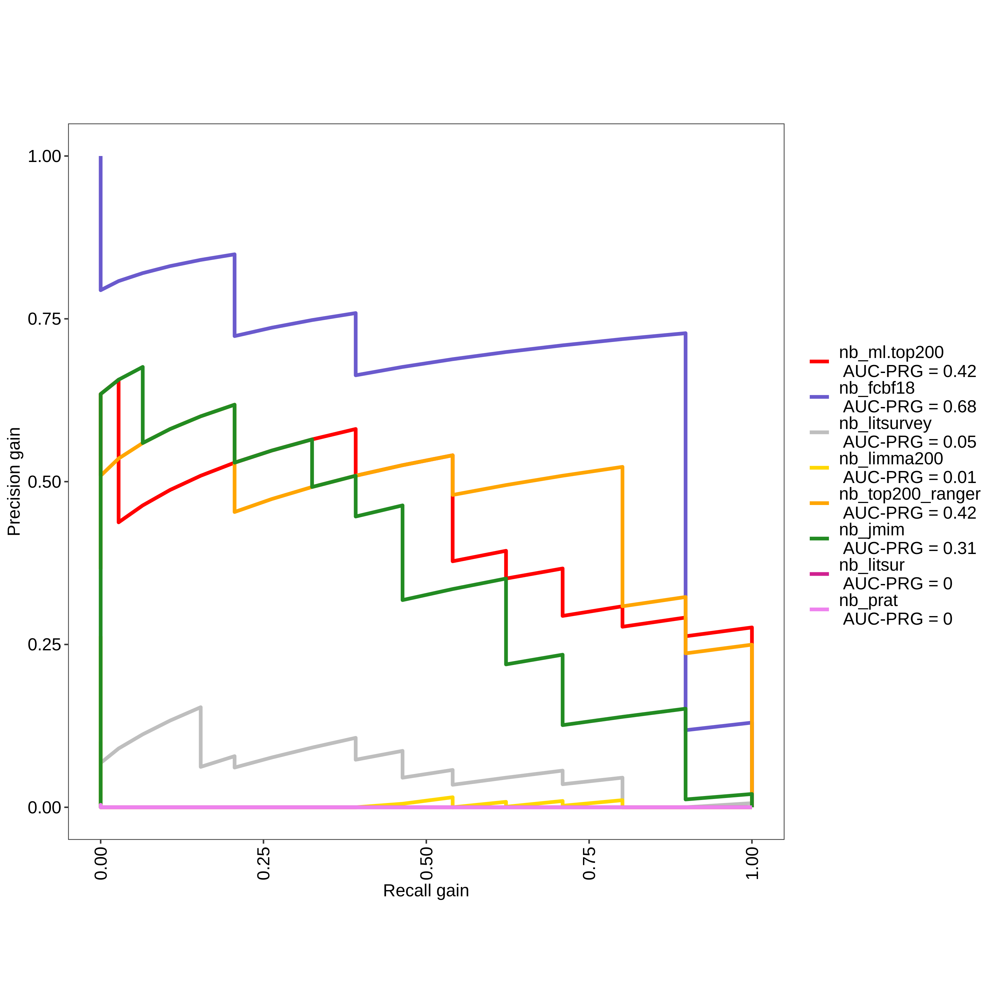

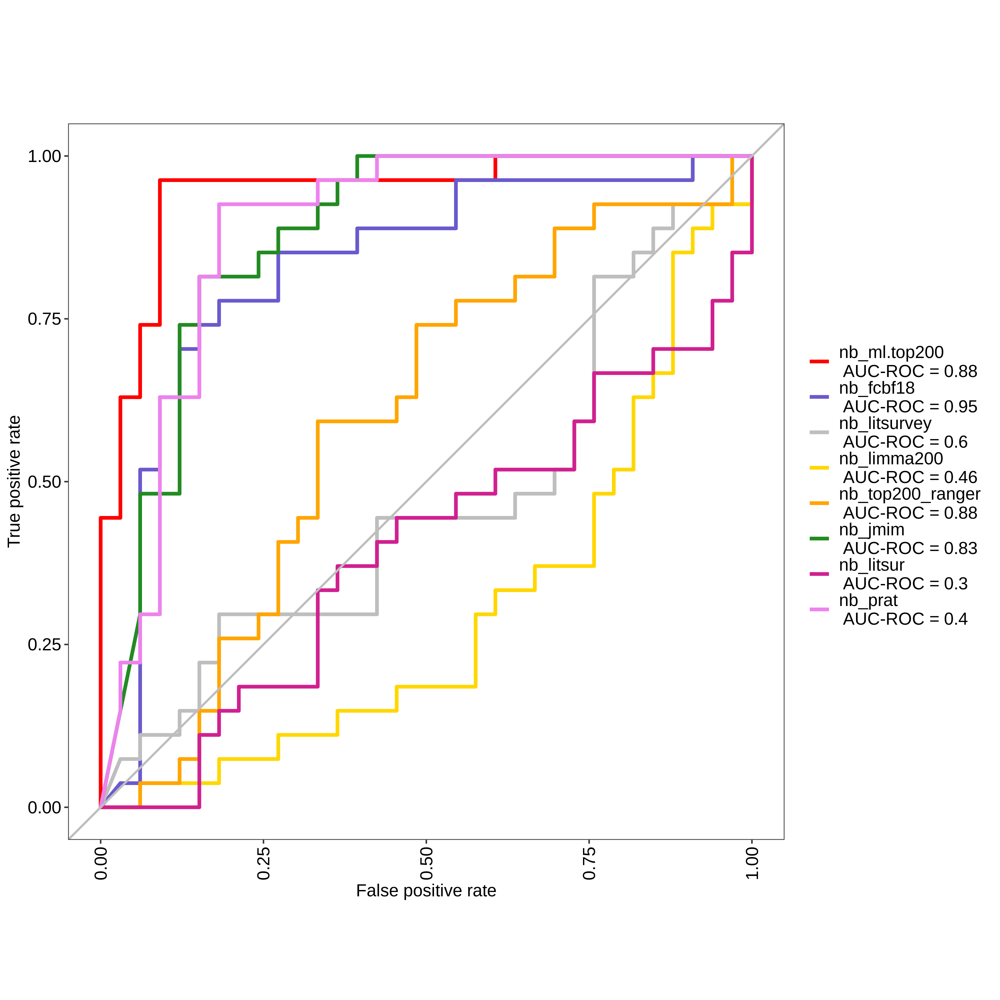

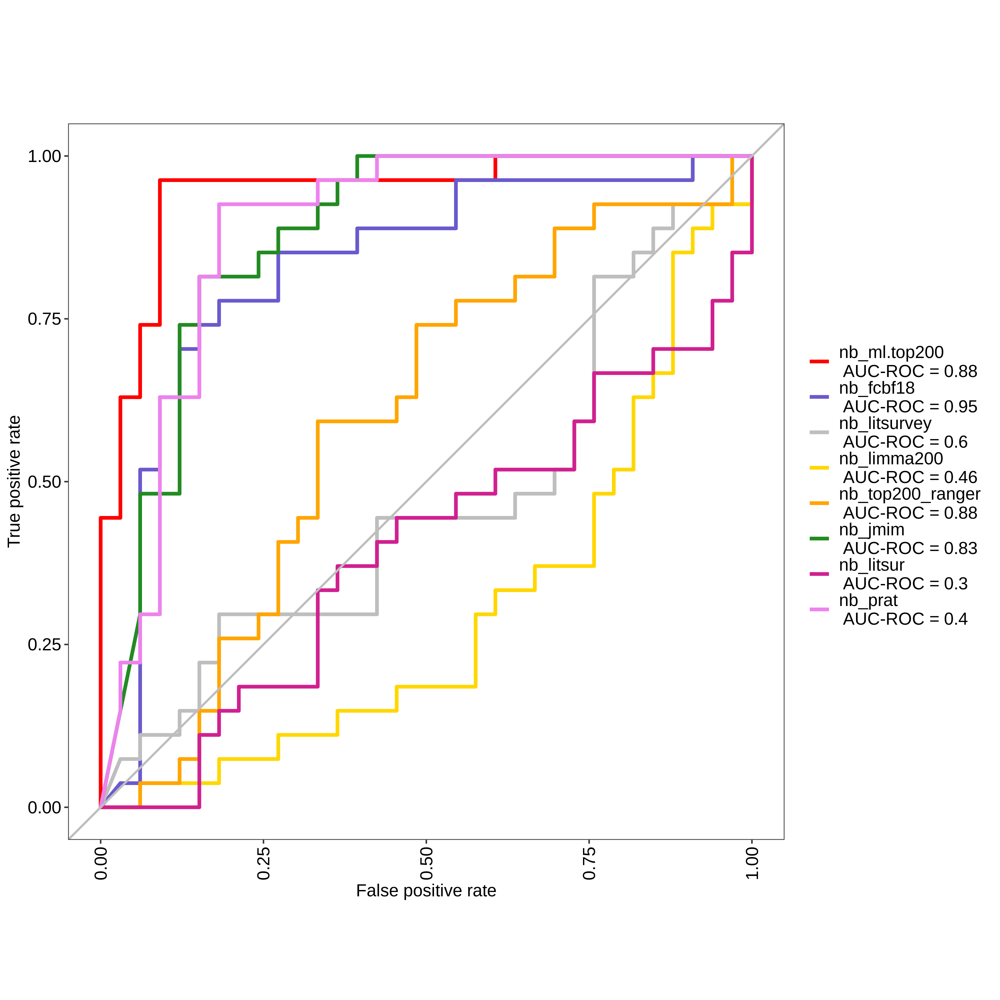

In [80]:
inp_top200_nb <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf18_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf18.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma200_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma200.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_litsur_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_nb <- evalm(list(inp_top200_nb, inp_fcbf18_nb, inp_top200var_nb, inp_limma200_nb, inp_top200_ranger_nb, inp_jmim_nb, inp_litsur_nb, inp_prat_nb),
             gnames=c('nb_ml.top200', 'nb_fcbf18', 'nb_litsurvey', 'nb_limma200', 'nb_top200_ranger', 'nb_jmim', 'nb_litsur', 'nb_prat'))
res_nb$roc

ROC-AUC Graphs available at https://github.com/runtime-terror101/ICP-Responders/tree/master/ICP_Responders/ROC_AUC%20analysis

# Output RDS

In [65]:
saveRDS(jmim.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/liu_jmim.list.rds")
# saveRDS(as.character(genes_lit_rawdata), "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/liu_litsur.list.rds")
# saveRDS(prat.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/liu_prat.list.rds")
# saveRDS(mergedRank.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/liu_mergedrank.list.rds")

In [ ]:
# #parameter tuning
# modelLookup('lvq')
# # design the parameter tuning grid
# grid <- expand.grid(size=c(5,10,20,50), k=c(1,2,3,4,5))
# # train the model
# model <- train(Species~., data=iris, method="lvq", trControl=control, tuneGrid=grid)

In [ ]:
# saveRds(tmp, "tmp.rds")
# # load by giving path
# # tmp <- readRds("path")
# # R
